In [1]:
import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from datetime import datetime

In [2]:
df = pd.read_csv('C:\jupyter_notebook_file\병합DB_2차.csv')
df

,Unnamed: 0,bridge_name,address,etc_address,latitude,longitude,brid_height_origin,location_start,wl_station_code,station_name,location,obs_date,WL,bridge_height
0,0,한평교,경기도,안성시,37.106555,127.433259,6.1,"[37.106555, 127.433259]",1007604,안성시(한평교),"[37.10666666666667, 127.43361111111112]",2016-11-09 01:00:00,145.0,734.0
1,1,한평교,경기도,안성시,37.106555,127.433259,6.1,"[37.106555, 127.433259]",1007604,안성시(한평교),"[37.10666666666667, 127.43361111111112]",2016-11-09 02:00:00,145.0,734.0
2,2,한평교,경기도,안성시,37.106555,127.433259,6.1,"[37.106555, 127.433259]",1007604,안성시(한평교),"[37.10666666666667, 127.43361111111112]",2016-11-09 03:00:00,145.0,734.0
3,3,한평교,경기도,안성시,37.106555,127.433259,6.1,"[37.106555, 127.433259]",1007604,안성시(한평교),"[37.10666666666667, 127.43361111111112]",2016-11-09 04:00:00,146.0,734.0
4,4,한평교,경기도,안성시,37.106555,127.433259,6.1,"[37.106555, 127.433259]",1007604,안성시(한평교),"[37.10666666666667, 127.43361111111112]",2016-11-09 05:00:00,146.0,734.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7456997,7456997,굴포천교,인천광역시,계양구,37.580726,126.776421,10.0,"[37.580726, 126.776421]",1019653,벌말교,"[37.583333333333336, 126.77222222222223]",2020-08-26 22:00:00,238.0,1239.0
7456998,7456998,굴포천교,인천광역시,계양구,37.580726,126.776421,10.0,"[37.580726, 126.776421]",1019653,벌말교,"[37.583333333333336, 126.77222222222223]",2020-08-26 23:00:00,230.0,1239.0
7456999,7456999,굴포천교,인천광역시,계양구,37.580726,126.776421,10.0,"[37.580726, 126.776421]",1019653,벌말교,"[37.583333333333336, 126.77222222222223]",2020-08-27 00:00:00,238.0,1239.0
7457000,7457000,굴포천교,인천광역시,계양구,37.580726,126.776421,10.0,"[37.580726, 126.776421]",1019653,벌말교,"[37.583333333333336, 126.77222222222223]",2020-08-27 01:00:00,230.0,1239.0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7457002 entries, 0 to 7457001
Data columns (total 14 columns):
 #   Column              Dtype  
---  ------              -----  
 0   Unnamed: 0          int64  
 1   bridge_name         object 
 2   address             object 
 3   etc_address         object 
 4   latitude            float64
 5   longitude           float64
 6   brid_height_origin  float64
 7   location_start      object 
 8   wl_station_code     int64  
 9   station_name        object 
 10  location            object 
 11  obs_date            object 
 12  WL                  float64
 13  bridge_height       float64
dtypes: float64(5), int64(2), object(7)
memory usage: 796.5+ MB


In [4]:
df['obs_date'] = pd.to_datetime(df['obs_date'])

In [5]:
bridge_list = pd.unique(df['location_start']).tolist() # 교량 리스트
len(bridge_list)

86

In [6]:
# 54개 모든 교량에 대한 df_list
df_list = [df[df['location_start']==i] for i in bridge_list]

for i in range(len(df_list)): 
    # obs_date, WL 컬럼 이외 삭제
    df_list[i] = df_list[i].drop(columns=['Unnamed: 0', 'bridge_name', 'address', 'etc_address', 'latitude', 'longitude', 'brid_height_origin',
                                          'location_start', 'wl_station_code', 'station_name', 'location', 'bridge_height'])
    # date 정렬
    df_list[i].sort_values(['obs_date'], inplace=True)
    df_list[i].reset_index(drop=True, inplace=True)
    df_list[i].rename({'obs_date':'time', 'WL':'value'}, axis=1, inplace=True)

In [7]:
df_list[0]

,time,value
0,2016-11-09 01:00:00,145.0
1,2016-11-09 02:00:00,145.0
2,2016-11-09 03:00:00,145.0
3,2016-11-09 04:00:00,146.0
4,2016-11-09 05:00:00,146.0
...,...,...
33252,2020-08-26 21:00:00,198.0
33253,2020-08-26 22:00:00,200.0
33254,2020-08-26 23:00:00,202.0
33255,2020-08-27 00:00:00,204.0


<AxesSubplot:>

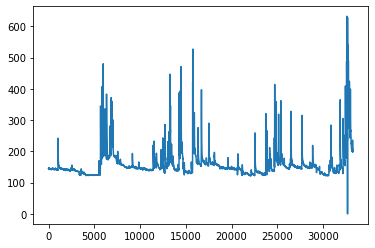

In [8]:
df_list[0]['value'].plot() # 첫 번째 교량 하천 수위 그래프

In [9]:
split_date = []
for i in range(len(df_list)):
    # 각 데이터프레임마다 test data의 비율이 0.4가 되도록 설정
    idx = len(train_test_split(df_list[i], test_size=.4)[0])
    split_date.append(df_list[i]['time'][idx])

In [10]:
split_date

[Timestamp('2019-02-18 20:00:00'),
 Timestamp('2016-05-14 06:00:00'),
 Timestamp('2018-10-04 20:00:00'),
 Timestamp('2018-10-04 20:00:00'),
 Timestamp('2017-05-30 09:00:00'),
 Timestamp('2019-06-08 10:00:00'),
 Timestamp('2016-08-22 07:00:00'),
 Timestamp('2016-06-06 21:00:00'),
 Timestamp('2016-04-15 21:00:00'),
 Timestamp('2016-05-18 07:00:00'),
 Timestamp('2016-05-18 07:00:00'),
 Timestamp('2018-09-20 08:00:00'),
 Timestamp('2016-08-10 01:00:00'),
 Timestamp('2016-12-01 12:00:00'),
 Timestamp('2016-05-23 14:00:00'),
 Timestamp('2016-05-21 22:00:00'),
 Timestamp('2016-06-01 17:00:00'),
 Timestamp('2017-12-27 04:00:00'),
 Timestamp('2019-02-18 20:00:00'),
 Timestamp('2016-06-02 15:00:00'),
 Timestamp('2016-05-24 00:00:00'),
 Timestamp('2020-01-25 01:00:00'),
 Timestamp('2016-09-13 21:00:00'),
 Timestamp('2016-07-03 20:00:00'),
 Timestamp('2017-12-27 01:00:00'),
 Timestamp('2016-05-24 20:00:00'),
 Timestamp('2016-06-13 03:00:00'),
 Timestamp('2016-10-30 11:00:00'),
 Timestamp('2016-05-

In [11]:
## X의 train, test용 데이터: 스플릿 기준으로 나누기
train_list = [df_list[i][df_list[i]['time'] < split_date[i]]['value'] for i in range(len(df_list))]
test_list = [df_list[i][df_list[i]['time'] >= split_date[i]]['value'] for i in range(len(df_list))]

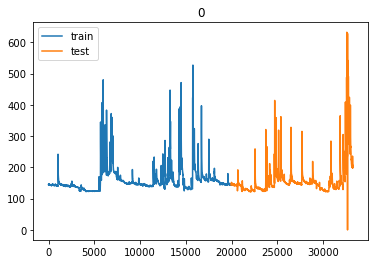

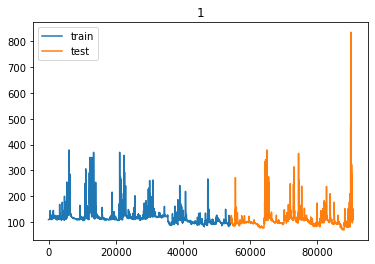

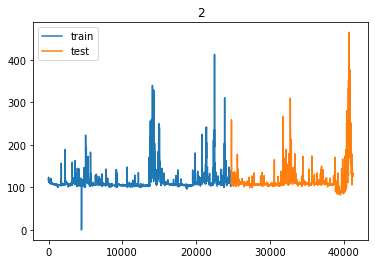

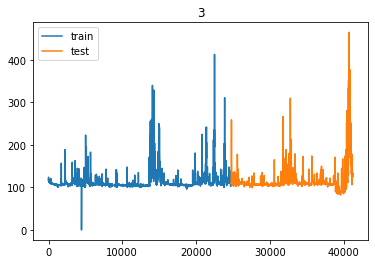

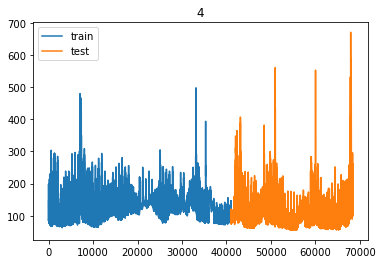

...

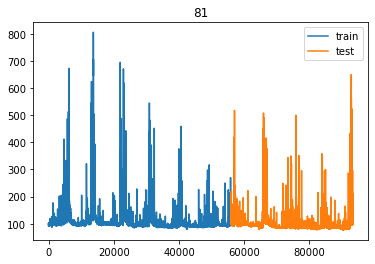

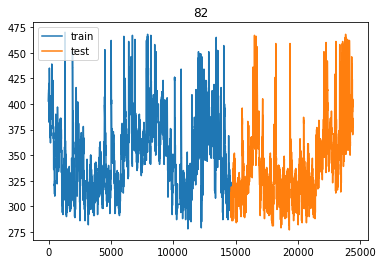

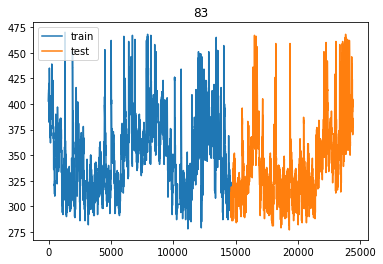

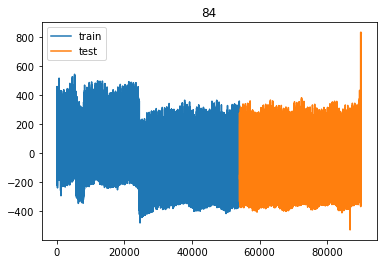

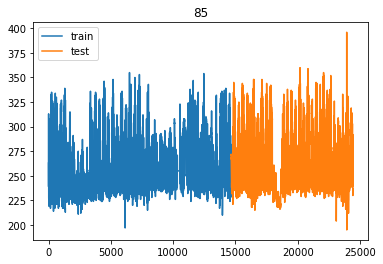

In [12]:
# train, test 데이터 시각화
for i in range(len(df_list)):
    ax = train_list[i].plot()
    test_list[i].plot(ax=ax)
    plt.title(i)
    plt.legend(['train', 'test'])
    plt.show()

In [13]:
for i in range(len(df_list)):
    # time 컬럼을 dataframe index로 설정
    df_list[i] = df_list[i].set_index('time')

In [14]:
df_list[0]

,value
time,
2016-11-09 01:00:00,145.0
2016-11-09 02:00:00,145.0
2016-11-09 03:00:00,145.0
2016-11-09 04:00:00,146.0
2016-11-09 05:00:00,146.0
...,...
2020-08-26 21:00:00,198.0
2020-08-26 22:00:00,200.0
2020-08-26 23:00:00,202.0


In [15]:
train_list_arr = [np.array(train_list[i]).reshape(-1,1) for i in range(len(df_list))]
test_list_arr = [np.array(test_list[i]).reshape(-1,1) for i in range(len(df_list))]

for i in range(len(df_list)):
    print(i, ': ', train_list_arr[i].shape, test_list_arr[i].shape)

0 :  (19954, 1) (13303, 1)
1 :  (54382, 1) (36256, 1)
2 :  (24763, 1) (16509, 1)
3 :  (24763, 1) (16509, 1)
4 :  (41056, 1) (27371, 1)
5 :  (16008, 1) (10673, 1)
6 :  (52720, 1) (35148, 1)
7 :  (54430, 1) (36287, 1)
8 :  (50389, 1) (33593, 1)
9 :  (55636, 1) (37092, 1)
10 :  (55636, 1) (37092, 1)
11 :  (15453, 1) (10303, 1)
12 :  (53174, 1) (35450, 1)
13 :  (49030, 1) (32687, 1)
14 :  (55984, 1) (37324, 1)
15 :  (47529, 1) (31686, 1)
16 :  (48693, 1) (32463, 1)
17 :  (35025, 1) (23351, 1)
18 :  (19954, 1) (13304, 1)
19 :  (55624, 1) (37084, 1)
20 :  (55972, 1) (37315, 1)
21 :  (7059, 1) (4706, 1)
22 :  (50693, 1) (33796, 1)
23 :  (53488, 1) (35659, 1)
24 :  (35031, 1) (23354, 1)
25 :  (29673, 1) (19783, 1)
26 :  (55079, 1) (36720, 1)
27 :  (50232, 1) (33489, 1)
28 :  (55986, 1) (37324, 1)
29 :  (54303, 1) (36202, 1)
30 :  (49032, 1) (32688, 1)
31 :  (52753, 1) (35169, 1)
32 :  (39493, 1) (26329, 1)
33 :  (55974, 1) (37316, 1)
34 :  (25582, 1) (17055, 1)
35 :  (44812, 1) (29875, 1)
36 :

In [16]:
# 데이터 스케일링(Scaling)
# 마지막으로 MinMaxScaler 클래스를 사용하여 데이터를 스케일링
# MinMaxScalar(X)는 데이터의 최대값이 1, 최소값이 0이 되도록 변환
# 데이터의 scale을 맞추면 weight의 scale도 일관성 있게 나올 수 있다.
from sklearn.preprocessing import MinMaxScaler

sc = MinMaxScaler() # 해당 함수는 최소한 데이터의 갯수가 1개는 있어야 수행 가능
#15, 44번 교량은 2019년부터 데이터가 있어 매우 적으므로 train, test 데이터 split 기준에 따라 오류 발생 가능

train_sc = [sc.fit_transform(train_list_arr[i]) for i in range(len(df_list))]
test_sc = [sc.fit_transform(test_list_arr[i]) for i in range(len(df_list))]

train_sc[0]

array([[0.05445545],
       [0.05445545],
       [0.05445545],
       ...,
       [0.04950495],
       [0.04950495],
       [0.04950495]])

In [17]:
# 정규화가 완료된 데이터들은 다시 pandas dataframe 데이터 타입으로 변환
# dataframe으로 타입을 변경하는 이유는 pandas는 시계열 자료에 대한 다양한 기능을 제공하여 LSTM에서 사용하는 window를 만들기 유용하기 때문
train_sc_df = [pd.DataFrame(train_sc[i], columns=['value'], index=train_list[i].index) for i in range(len(df_list))]
test_sc_df = [pd.DataFrame(test_sc[i], columns=['value'], index=test_list[i].index) for i in range(len(df_list))]
train_sc_df[0].head()

,value
0,0.054455
1,0.054455
2,0.054455
3,0.056931
4,0.056931


In [18]:
# sliding window 구성
# window: LSTM 훈련을 위한 고정된 사이즈 단위
# window 12개로 과거 시간 데이터 12개를 사용해서 다음 시간 단위의 값을 예측
for i in range(len(df_list)):
    for s in range(1, 13):
        train_sc_df[i]['shift_{}'.format(s)] = train_sc_df[i]['value'].shift(s)
        test_sc_df[i]['shift_{}'.format(s)] = test_sc_df[i]['value'].shift(s)

train_sc_df[0].head(13)

,value,shift_1,shift_2,shift_3,shift_4,shift_5,shift_6,shift_7,shift_8,shift_9,shift_10,shift_11,shift_12
0,0.054455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.054455,0.054455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.054455,0.054455,0.054455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.056931,0.054455,0.054455,0.054455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.056931,0.056931,0.054455,0.054455,0.054455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,0.056931,0.056931,0.056931,0.054455,0.054455,0.054455,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,0.056931,0.056931,0.056931,0.056931,0.054455,0.054455,0.054455,NaN,NaN,NaN,NaN,NaN,NaN
7,0.056931,0.056931,0.056931,0.056931,0.056931,0.054455,0.054455,0.054455,NaN,NaN,NaN,NaN,NaN
8,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.054455,0.054455,0.054455,NaN,NaN,NaN,NaN
9,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.054455,0.054455,0.054455,NaN,NaN,NaN


In [19]:
# 과거 12개 하천 수위 지수들이 train 속성들이 되고, '현재 하천 수위의 지수'가 y(target)이 된다.
# 데이터에서 결측값 제거
# 전체 데이터를 train 데이터, test 데이터로 분리
# 각각의 train, test 데이터는 속성과 타겟열로 분리
X_train = [train_sc_df[i].dropna().drop('value', axis=1) for i in range(len(df_list))]
y_train = [train_sc_df[i].dropna()[['value']] for i in range(len(df_list))]

X_test = [test_sc_df[i].dropna().drop('value', axis=1) for i in range(len(df_list))]
y_test = [test_sc_df[i].dropna()[['value']] for i in range(len(df_list))]

X_train[0].head()

,shift_1,shift_2,shift_3,shift_4,shift_5,shift_6,shift_7,shift_8,shift_9,shift_10,shift_11,shift_12
12,0.054455,0.054455,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.054455,0.054455,0.054455
13,0.054455,0.054455,0.054455,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.054455,0.054455
14,0.054455,0.054455,0.054455,0.054455,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.054455
15,0.054455,0.054455,0.054455,0.054455,0.054455,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931
16,0.054455,0.054455,0.054455,0.054455,0.054455,0.054455,0.056931,0.056931,0.056931,0.056931,0.056931,0.056931


In [20]:
# dataframe 타입이었던 train, test 데이터들을 values로 dataframe의 numpy 표현형만 가져옴
# sklearn을 비롯해서 기계학습 패키지들은 train, test 데이터로 numpy의 ndarray 타입을 지원
# values를 사용하기 전 X_train은 DataFrame 타입, values를 사용한 후 numpy.ndarray로 변경 확인
print(type(X_train[0]))
X_train_np = [X_train[i].values for i in range(len(df_list))]

print(type(X_train_np[0]))
X_test_np = [X_test[i].values for i in range(len(df_list))]
y_train_np = [y_train[i].values for i in range(len(df_list))]
y_test_np = [y_test[i].values for i in range(len(df_list))]
 
# X_train 데이터는 (데이터 갯수, 12개 slot)
# y_train 데이터는 (데이터 갯수, 1개의 target)
print(X_train_np[0].shape)
print(y_train_np[0].shape)

<class 'pandas.core.frame.DataFrame'>
<class 'numpy.ndarray'>
(19942, 12)
(19942, 1)


In [21]:
# 최종 훈련 데이터 생성을 위해 keras의 LSTM에 필요한 3차원 데이터로 변환
# 최종 데이터 shape이 (size, timestamp, feature) 형태로 나타나야함.
# 속성이 하천 수위 지수 한가지이므로 1을 입력, n 개의 속성을 사용할 경우 feature 순서에 n의 값을 입력
X_train_t = [X_train_np[i].reshape(X_train_np[i].shape[0], 12, 1) for i in range(len(df_list))]
X_test_t = [X_test_np[i].reshape(X_test_np[i].shape[0], 12, 1) for i in range(len(df_list))]

print("최종 DATA")
print(X_train_t[0].shape)
print(X_train_t[0])
print(y_train[0])

최종 DATA
(19942, 12, 1)
[[[0.05445545]
  [0.05445545]
  [0.05693069]
  ...
  [0.05445545]
  [0.05445545]
  [0.05445545]]

 [[0.05445545]
  [0.05445545]
  [0.05445545]
  ...
  [0.05693069]
  [0.05445545]
  [0.05445545]]

 [[0.05445545]
  [0.05445545]
  [0.05445545]
  ...
  [0.05693069]
  [0.05693069]
  [0.05445545]]

 ...

 [[0.04950495]
  [0.04950495]
  [0.0519802 ]
  ...
  [0.05445545]
  [0.05445545]
  [0.05445545]]

 [[0.04950495]
  [0.04950495]
  [0.04950495]
  ...
  [0.05445545]
  [0.05445545]
  [0.05445545]]

 [[0.04950495]
  [0.04950495]
  [0.04950495]
  ...
  [0.05445545]
  [0.05445545]
  [0.05445545]]]
          value
12     0.054455
13     0.054455
14     0.054455
15     0.054455
16     0.054455
...         ...
19949  0.049505
19950  0.049505
19951  0.049505
19952  0.049505
19953  0.049505

[19942 rows x 1 columns]


In [22]:
# LSTM 모델의 입력은 기본적으로 3차원 구조(최종 훈련 데이터를 생성하기 위해 3차원 데이터로 변환 필수)
# 첫 번째 차원: 데이터(sample/batch) 갯수, 두번째 차원: 시간축의 차원(time step size),
# 마지막 차원: LSTM 입력층에 입력되는 데이터(feature) 갯수
from keras.layers import LSTM 
from keras.models import Sequential 
from keras.layers import Dense 
import keras.backend as K 
from keras.callbacks import EarlyStopping, ModelCheckpoint
import os

# 모델 생성전에 tensorflow의 graph 영역을 clear한다.
K.clear_session()

# Sequeatial Model: 레이어들을 선형으로 쌓는 모델
model = Sequential() 
# LSTM 레이어: 20메모리 셀, (timestep, feature)
model.add(LSTM(20, input_shape=(1, 1))) 
# Dense 레이어: output = 1(예측하고자 하는 target갯수)
model.add(Dense(1)) 
# optimizer: 훈련과정 설정, loss: 최적화 과정에서 최소화될 손실 함수 설정, metrics: 훈련 모니터링위해 사용
model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_squared_error']) # metrics = ['accuracy']는 classification에 사용
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 20)                1760      
_________________________________________________________________
dense (Dense)                (None, 1)                 21        
Total params: 1,781
Trainable params: 1,781
Non-trainable params: 0
_________________________________________________________________


In [23]:
model_list = [model for i in range(len(df_list))]

In [24]:
# 과적합 방지: Early stopping 설정
# patience 횟수 만큼 정확도가 개선이 안되면 학습 중단
early_stop = EarlyStopping(monitor='loss', patience=5, verbose=1)

In [25]:
hist_list = []
for i in range(len(df_list)):
    # 체크 포인트 만들어서 모델 저장
    # 모델 저장 폴더 설정
    MODEL_DIR = './model_LSTM/'+str(i)+'/'   #같은 폴더 내에 model이라는 폴더가 없다면 만들어줘라
    if not os.path.exists(MODEL_DIR):      
        os.makedirs(MODEL_DIR)    #mkdir이 폴더 생성 함수

    # 모델 저장 조건 설정
    modelpath = MODEL_DIR+'{epoch:02d}-{val_loss:.4f}.hdf5'
    checkpointer = ModelCheckpoint(filepath = modelpath, monitor='loss', verbose = 1, save_best_only = True)

    hist_list.append(model_list[i].fit(X_train_t[i], y_train[i], validation_split=0.2, epochs=500,
              batch_size=20, verbose=1, callbacks=[early_stop, checkpointer]))

Epoch 1/500
787/798 [============================>.] - ETA: 0s - loss: 0.0014 - mean_squared_error: 0.0014WARNING:tensorflow:Model was constructed with shape (None, 1, 1) for input Tensor("lstm_input:0", shape=(None, 1, 1), dtype=float32), but it was called on an input with incompatible shape (None, 12, 1).

Epoch 00001: loss improved from inf to 0.00134, saving model to ./model_LSTM/0\01-0.0004.hdf5
798/798 [==============================] - 6s 7ms/step - loss: 0.0013 - mean_squared_error: 0.0013 - val_loss: 4.3313e-04 - val_mean_squared_error: 4.3313e-04
Epoch 2/500
796/798 [============================>.] - ETA: 0s - loss: 5.1503e-04 - mean_squared_error: 5.1503e-04
Epoch 00002: loss improved from 0.00134 to 0.00051, saving model to ./model_LSTM/0\02-0.0003.hdf5
798/798 [==============================] - 5s 6ms/step - loss: 5.1463e-04 - mean_squared_error: 5.1463e-04 - val_loss: 2.7058e-04 - val_mean_squared_error: 2.7058e-04
Epoch 3/500
790/798 [============================>.] - ET

Epoch 22/500
795/798 [============================>.] - ETA: 0s - loss: 2.1014e-04 - mean_squared_error: 2.1014e-04
Epoch 00022: loss did not improve from 0.00020
798/798 [==============================] - 5s 6ms/step - loss: 2.0965e-04 - mean_squared_error: 2.0965e-04 - val_loss: 2.8640e-05 - val_mean_squared_error: 2.8640e-05
Epoch 23/500
796/798 [============================>.] - ETA: 0s - loss: 1.8633e-04 - mean_squared_error: 1.8633e-04
Epoch 00023: loss improved from 0.00020 to 0.00019, saving model to ./model_LSTM/0\23-0.0001.hdf5
798/798 [==============================] - 5s 6ms/step - loss: 1.8619e-04 - mean_squared_error: 1.8619e-04 - val_loss: 5.1381e-05 - val_mean_squared_error: 5.1381e-05
Epoch 24/500
790/798 [============================>.] - ETA: 0s - loss: 1.8353e-04 - mean_squared_error: 1.8353e-04
Epoch 00024: loss improved from 0.00019 to 0.00018, saving model to ./model_LSTM/0\24-0.0000.hdf5
798/798 [==============================] - 5s 7ms/step - loss: 1.8213e-04 -

Epoch 46/500
787/798 [============================>.] - ETA: 0s - loss: 1.5168e-04 - mean_squared_error: 1.5168e-04
Epoch 00046: loss improved from 0.00015 to 0.00015, saving model to ./model_LSTM/0\46-0.0000.hdf5
798/798 [==============================] - 4s 5ms/step - loss: 1.5031e-04 - mean_squared_error: 1.5031e-04 - val_loss: 1.7904e-05 - val_mean_squared_error: 1.7904e-05
Epoch 47/500
788/798 [============================>.] - ETA: 0s - loss: 1.5119e-04 - mean_squared_error: 1.5119e-04
Epoch 00047: loss did not improve from 0.00015
798/798 [==============================] - 4s 5ms/step - loss: 1.5106e-04 - mean_squared_error: 1.5106e-04 - val_loss: 3.6589e-05 - val_mean_squared_error: 3.6589e-05
Epoch 48/500
795/798 [============================>.] - ETA: 0s - loss: 1.3247e-04 - mean_squared_error: 1.3247e-04
Epoch 00048: loss improved from 0.00015 to 0.00013, saving model to ./model_LSTM/0\48-0.0000.hdf5
798/798 [==============================] - 4s 5ms/step - loss: 1.3229e-04 -

2174/2175 [============================>.] - ETA: 0s - loss: 5.6765e-05 - mean_squared_error: 5.6765e-05
Epoch 00011: loss did not improve from 0.00006
2175/2175 [==============================] - 10s 5ms/step - loss: 5.6864e-05 - mean_squared_error: 5.6864e-05 - val_loss: 3.7606e-05 - val_mean_squared_error: 3.7606e-05
Epoch 12/500
2163/2175 [============================>.] - ETA: 0s - loss: 5.5015e-05 - mean_squared_error: 5.5015e-05
Epoch 00012: loss improved from 0.00006 to 0.00006, saving model to ./model_LSTM/1\12-0.0001.hdf5
2175/2175 [==============================] - 10s 5ms/step - loss: 5.5206e-05 - mean_squared_error: 5.5206e-05 - val_loss: 7.5985e-05 - val_mean_squared_error: 7.5985e-05
Epoch 13/500
2164/2175 [============================>.] - ETA: 0s - loss: 5.5436e-05 - mean_squared_error: 5.5436e-05
Epoch 00013: loss did not improve from 0.00006
2175/2175 [==============================] - 11s 5ms/step - loss: 5.5571e-05 - mean_squared_error: 5.5571e-05 - val_loss: 4.549

Epoch 00013: early stopping
Epoch 1/500
990/990 [==============================] - ETA: 0s - loss: 5.5183e-05 - mean_squared_error: 5.5183e-05
Epoch 00001: loss improved from inf to 0.00006, saving model to ./model_LSTM/3\01-0.0001.hdf5
990/990 [==============================] - 4s 4ms/step - loss: 5.5183e-05 - mean_squared_error: 5.5183e-05 - val_loss: 1.3070e-04 - val_mean_squared_error: 1.3070e-04
Epoch 2/500
984/990 [============================>.] - ETA: 0s - loss: 5.2013e-05 - mean_squared_error: 5.2013e-05
Epoch 00002: loss improved from 0.00006 to 0.00005, saving model to ./model_LSTM/3\02-0.0001.hdf5
990/990 [==============================] - 4s 4ms/step - loss: 5.1766e-05 - mean_squared_error: 5.1766e-05 - val_loss: 1.1028e-04 - val_mean_squared_error: 1.1028e-04
Epoch 3/500
989/990 [============================>.] - ETA: 0s - loss: 5.4990e-05 - mean_squared_error: 5.4990e-05
Epoch 00003: loss did not improve from 0.00005
990/990 [==============================] - 4s 4ms/step

Epoch 16/500
1637/1642 [============================>.] - ETA: 0s - loss: 7.9868e-04 - mean_squared_error: 7.9868e-04
Epoch 00016: loss improved from 0.00081 to 0.00080, saving model to ./model_LSTM/4\16-0.0005.hdf5
1642/1642 [==============================] - 8s 5ms/step - loss: 7.9743e-04 - mean_squared_error: 7.9743e-04 - val_loss: 4.5836e-04 - val_mean_squared_error: 4.5836e-04
Epoch 17/500
1638/1642 [============================>.] - ETA: 0s - loss: 7.9522e-04 - mean_squared_error: 7.9522e-04
Epoch 00017: loss improved from 0.00080 to 0.00079, saving model to ./model_LSTM/4\17-0.0005.hdf5
1642/1642 [==============================] - 8s 5ms/step - loss: 7.9434e-04 - mean_squared_error: 7.9434e-04 - val_loss: 4.7820e-04 - val_mean_squared_error: 4.7820e-04
Epoch 18/500
1636/1642 [============================>.] - ETA: 0s - loss: 7.9087e-04 - mean_squared_error: 7.9087e-04
Epoch 00018: loss improved from 0.00079 to 0.00079, saving model to ./model_LSTM/4\18-0.0005.hdf5
1642/1642 [===

Epoch 38/500
1638/1642 [============================>.] - ETA: 0s - loss: 7.5054e-04 - mean_squared_error: 7.5054e-04
Epoch 00038: loss did not improve from 0.00075
1642/1642 [==============================] - 10s 6ms/step - loss: 7.5023e-04 - mean_squared_error: 7.5023e-04 - val_loss: 4.3679e-04 - val_mean_squared_error: 4.3679e-04
Epoch 39/500
1633/1642 [============================>.] - ETA: 0s - loss: 7.5071e-04 - mean_squared_error: 7.5071e-04
Epoch 00039: loss did not improve from 0.00075
1642/1642 [==============================] - 8s 5ms/step - loss: 7.5060e-04 - mean_squared_error: 7.5060e-04 - val_loss: 6.2914e-04 - val_mean_squared_error: 6.2914e-04
Epoch 40/500
1642/1642 [==============================] - ETA: 0s - loss: 7.4920e-04 - mean_squared_error: 7.4920e-04
Epoch 00040: loss did not improve from 0.00075
1642/1642 [==============================] - 7s 5ms/step - loss: 7.4920e-04 - mean_squared_error: 7.4920e-04 - val_loss: 5.1164e-04 - val_mean_squared_error: 5.1164e-

Epoch 61/500
1632/1642 [============================>.] - ETA: 0s - loss: 7.1639e-04 - mean_squared_error: 7.1639e-04
Epoch 00061: loss improved from 0.00072 to 0.00071, saving model to ./model_LSTM/4\61-0.0005.hdf5
1642/1642 [==============================] - 8s 5ms/step - loss: 7.1429e-04 - mean_squared_error: 7.1429e-04 - val_loss: 4.6867e-04 - val_mean_squared_error: 4.6867e-04
Epoch 62/500
1641/1642 [============================>.] - ETA: 0s - loss: 7.0970e-04 - mean_squared_error: 7.0970e-04
Epoch 00062: loss improved from 0.00071 to 0.00071, saving model to ./model_LSTM/4\62-0.0005.hdf5
1642/1642 [==============================] - 8s 5ms/step - loss: 7.0955e-04 - mean_squared_error: 7.0955e-04 - val_loss: 4.5059e-04 - val_mean_squared_error: 4.5059e-04
Epoch 63/500
1636/1642 [============================>.] - ETA: 0s - loss: 7.0482e-04 - mean_squared_error: 7.0482e-04
Epoch 00063: loss improved from 0.00071 to 0.00071, saving model to ./model_LSTM/4\63-0.0004.hdf5
1642/1642 [===

Epoch 84/500
1642/1642 [==============================] - ETA: 0s - loss: 6.8269e-04 - mean_squared_error: 6.8269e-04
Epoch 00084: loss improved from 0.00069 to 0.00068, saving model to ./model_LSTM/4\84-0.0005.hdf5
1642/1642 [==============================] - 9s 5ms/step - loss: 6.8269e-04 - mean_squared_error: 6.8269e-04 - val_loss: 4.7089e-04 - val_mean_squared_error: 4.7089e-04
Epoch 85/500
1633/1642 [============================>.] - ETA: 0s - loss: 6.8583e-04 - mean_squared_error: 6.8583e-04
Epoch 00085: loss did not improve from 0.00068
1642/1642 [==============================] - 9s 6ms/step - loss: 6.8362e-04 - mean_squared_error: 6.8362e-04 - val_loss: 4.8527e-04 - val_mean_squared_error: 4.8527e-04
Epoch 86/500
1638/1642 [============================>.] - ETA: 0s - loss: 6.8544e-04 - mean_squared_error: 6.8544e-04
Epoch 00086: loss did not improve from 0.00068
1642/1642 [==============================] - 9s 6ms/step - loss: 6.8570e-04 - mean_squared_error: 6.8570e-04 - val_l

1631/1642 [============================>.] - ETA: 0s - loss: 6.7329e-04 - mean_squared_error: 6.7329e-04
Epoch 00107: loss did not improve from 0.00067
1642/1642 [==============================] - 7s 4ms/step - loss: 6.7134e-04 - mean_squared_error: 6.7134e-04 - val_loss: 4.5189e-04 - val_mean_squared_error: 4.5189e-04
Epoch 108/500
1639/1642 [============================>.] - ETA: 0s - loss: 6.6855e-04 - mean_squared_error: 6.6855e-04
Epoch 00108: loss improved from 0.00067 to 0.00067, saving model to ./model_LSTM/4\108-0.0005.hdf5
1642/1642 [==============================] - 7s 5ms/step - loss: 6.6781e-04 - mean_squared_error: 6.6781e-04 - val_loss: 4.9036e-04 - val_mean_squared_error: 4.9036e-04
Epoch 109/500
1632/1642 [============================>.] - ETA: 0s - loss: 6.6908e-04 - mean_squared_error: 6.6908e-04
Epoch 00109: loss did not improve from 0.00067
1642/1642 [==============================] - 8s 5ms/step - loss: 6.6944e-04 - mean_squared_error: 6.6944e-04 - val_loss: 4.835

1633/1642 [============================>.] - ETA: 0s - loss: 6.5525e-04 - mean_squared_error: 6.5525e-04
Epoch 00130: loss did not improve from 0.00065
1642/1642 [==============================] - 8s 5ms/step - loss: 6.5499e-04 - mean_squared_error: 6.5499e-04 - val_loss: 4.6347e-04 - val_mean_squared_error: 4.6347e-04
Epoch 131/500
1641/1642 [============================>.] - ETA: 0s - loss: 6.5323e-04 - mean_squared_error: 6.5323e-04
Epoch 00131: loss improved from 0.00065 to 0.00065, saving model to ./model_LSTM/4\131-0.0005.hdf5
1642/1642 [==============================] - 8s 5ms/step - loss: 6.5296e-04 - mean_squared_error: 6.5296e-04 - val_loss: 4.5338e-04 - val_mean_squared_error: 4.5338e-04
Epoch 132/500
1641/1642 [============================>.] - ETA: 0s - loss: 6.5814e-04 - mean_squared_error: 6.5814e-04
Epoch 00132: loss did not improve from 0.00065
1642/1642 [==============================] - 8s 5ms/step - loss: 6.5799e-04 - mean_squared_error: 6.5799e-04 - val_loss: 4.485

Epoch 14/500
629/640 [============================>.] - ETA: 0s - loss: 1.0096e-04 - mean_squared_error: 1.0096e-04
Epoch 00014: loss improved from 0.00010 to 0.00010, saving model to ./model_LSTM/5\14-0.0003.hdf5
640/640 [==============================] - 3s 5ms/step - loss: 1.0096e-04 - mean_squared_error: 1.0096e-04 - val_loss: 3.0779e-04 - val_mean_squared_error: 3.0779e-04
Epoch 15/500
632/640 [============================>.] - ETA: 0s - loss: 1.0007e-04 - mean_squared_error: 1.0007e-04
Epoch 00015: loss improved from 0.00010 to 0.00010, saving model to ./model_LSTM/5\15-0.0003.hdf5
640/640 [==============================] - 3s 5ms/step - loss: 9.9951e-05 - mean_squared_error: 9.9951e-05 - val_loss: 2.9409e-04 - val_mean_squared_error: 2.9409e-04
Epoch 16/500
639/640 [============================>.] - ETA: 0s - loss: 1.0161e-04 - mean_squared_error: 1.0161e-04
Epoch 00016: loss did not improve from 0.00010
640/640 [==============================] - 3s 5ms/step - loss: 1.0158e-04 -

Epoch 17/500
2104/2109 [============================>.] - ETA: 0s - loss: 2.1788e-05 - mean_squared_error: 2.1788e-05
Epoch 00017: loss did not improve from 0.00002
2109/2109 [==============================] - 13s 6ms/step - loss: 2.1759e-05 - mean_squared_error: 2.1759e-05 - val_loss: 1.8421e-05 - val_mean_squared_error: 1.8421e-05
Epoch 18/500
2103/2109 [============================>.] - ETA: 0s - loss: 2.1040e-05 - mean_squared_error: 2.1040e-05
Epoch 00018: loss improved from 0.00002 to 0.00002, saving model to ./model_LSTM/6\18-0.0000.hdf5
2109/2109 [==============================] - 12s 6ms/step - loss: 2.1065e-05 - mean_squared_error: 2.1065e-05 - val_loss: 1.7886e-05 - val_mean_squared_error: 1.7886e-05
Epoch 19/500
2108/2109 [============================>.] - ETA: 0s - loss: 2.1600e-05 - mean_squared_error: 2.1600e-05
Epoch 00019: loss did not improve from 0.00002
2109/2109 [==============================] - 11s 5ms/step - loss: 2.1597e-05 - mean_squared_error: 2.1597e-05 - va

2175/2177 [============================>.] - ETA: 0s - loss: 3.1000e-05 - mean_squared_error: 3.1000e-05
Epoch 00012: loss did not improve from 0.00003
2177/2177 [==============================] - 18s 8ms/step - loss: 3.0984e-05 - mean_squared_error: 3.0984e-05 - val_loss: 8.2650e-06 - val_mean_squared_error: 8.2650e-06
Epoch 13/500
2172/2177 [============================>.] - ETA: 0s - loss: 3.0313e-05 - mean_squared_error: 3.0313e-05
Epoch 00013: loss improved from 0.00003 to 0.00003, saving model to ./model_LSTM/7\13-0.0000.hdf5
2177/2177 [==============================] - 13s 6ms/step - loss: 3.0350e-05 - mean_squared_error: 3.0350e-05 - val_loss: 1.2227e-05 - val_mean_squared_error: 1.2227e-05
Epoch 14/500
2169/2177 [============================>.] - ETA: 0s - loss: 3.1095e-05 - mean_squared_error: 3.1095e-05
Epoch 00014: loss did not improve from 0.00003
2177/2177 [==============================] - 13s 6ms/step - loss: 3.1013e-05 - mean_squared_error: 3.1013e-05 - val_loss: 1.179

2010/2016 [============================>.] - ETA: 0s - loss: 2.0143e-05 - mean_squared_error: 2.0143e-05
Epoch 00004: loss improved from 0.00002 to 0.00002, saving model to ./model_LSTM/8\04-0.0000.hdf5
2016/2016 [==============================] - 10s 5ms/step - loss: 2.0112e-05 - mean_squared_error: 2.0112e-05 - val_loss: 2.4984e-06 - val_mean_squared_error: 2.4984e-06
Epoch 5/500
2012/2016 [============================>.] - ETA: 0s - loss: 2.0510e-05 - mean_squared_error: 2.0510e-05
Epoch 00005: loss did not improve from 0.00002
2016/2016 [==============================] - 10s 5ms/step - loss: 2.0492e-05 - mean_squared_error: 2.0492e-05 - val_loss: 1.5979e-06 - val_mean_squared_error: 1.5979e-06
Epoch 6/500
2012/2016 [============================>.] - ETA: 0s - loss: 1.8534e-05 - mean_squared_error: 1.8534e-05
Epoch 00006: loss improved from 0.00002 to 0.00002, saving model to ./model_LSTM/8\06-0.0000.hdf5
2016/2016 [==============================] - 11s 5ms/step - loss: 1.8509e-05 -

Epoch 13/500
2219/2225 [============================>.] - ETA: 0s - loss: 5.5778e-05 - mean_squared_error: 5.5778e-05
Epoch 00013: loss did not improve from 0.00006
2225/2225 [==============================] - 11s 5ms/step - loss: 5.5746e-05 - mean_squared_error: 5.5746e-05 - val_loss: 3.3417e-05 - val_mean_squared_error: 3.3417e-05
Epoch 14/500
2225/2225 [==============================] - ETA: 0s - loss: 5.5068e-05 - mean_squared_error: 5.5068e-05
Epoch 00014: loss improved from 0.00006 to 0.00006, saving model to ./model_LSTM/9\14-0.0000.hdf5
2225/2225 [==============================] - 11s 5ms/step - loss: 5.5068e-05 - mean_squared_error: 5.5068e-05 - val_loss: 3.4992e-05 - val_mean_squared_error: 3.4992e-05
Epoch 15/500
2222/2225 [============================>.] - ETA: 0s - loss: 5.5662e-05 - mean_squared_error: 5.5662e-05
Epoch 00015: loss did not improve from 0.00006
2225/2225 [==============================] - 11s 5ms/step - loss: 5.5641e-05 - mean_squared_error: 5.5641e-05 - va

618/618 [==============================] - ETA: 0s - loss: 9.4477e-06 - mean_squared_error: 9.4477e-06
Epoch 00003: loss improved from 0.00001 to 0.00001, saving model to ./model_LSTM/11\03-0.0002.hdf5
618/618 [==============================] - 3s 5ms/step - loss: 9.4477e-06 - mean_squared_error: 9.4477e-06 - val_loss: 1.6239e-04 - val_mean_squared_error: 1.6239e-04
Epoch 4/500
612/618 [============================>.] - ETA: 0s - loss: 9.5840e-06 - mean_squared_error: 9.5840e-06
Epoch 00004: loss did not improve from 0.00001
618/618 [==============================] - 3s 5ms/step - loss: 9.5108e-06 - mean_squared_error: 9.5108e-06 - val_loss: 1.6426e-04 - val_mean_squared_error: 1.6426e-04
Epoch 5/500
612/618 [============================>.] - ETA: 0s - loss: 9.1726e-06 - mean_squared_error: 9.1726e-06
Epoch 00005: loss improved from 0.00001 to 0.00001, saving model to ./model_LSTM/11\05-0.0002.hdf5
618/618 [==============================] - 3s 5ms/step - loss: 9.2844e-06 - mean_squared

2127/2127 [==============================] - ETA: 0s - loss: 3.8437e-05 - mean_squared_error: 3.8437e-05
Epoch 00013: loss improved from 0.00004 to 0.00004, saving model to ./model_LSTM/12\13-0.0000.hdf5
2127/2127 [==============================] - 10s 5ms/step - loss: 3.8437e-05 - mean_squared_error: 3.8437e-05 - val_loss: 3.0896e-05 - val_mean_squared_error: 3.0896e-05
Epoch 14/500
2122/2127 [============================>.] - ETA: 0s - loss: 3.8337e-05 - mean_squared_error: 3.8337e-05
Epoch 00014: loss improved from 0.00004 to 0.00004, saving model to ./model_LSTM/12\14-0.0000.hdf5
2127/2127 [==============================] - 10s 5ms/step - loss: 3.8274e-05 - mean_squared_error: 3.8274e-05 - val_loss: 2.5512e-05 - val_mean_squared_error: 2.5512e-05
Epoch 15/500
2125/2127 [============================>.] - ETA: 0s - loss: 3.8868e-05 - mean_squared_error: 3.8868e-05
Epoch 00015: loss did not improve from 0.00004
2127/2127 [==============================] - 10s 5ms/step - loss: 3.8845e-

Epoch 5/500
1952/1961 [============================>.] - ETA: 0s - loss: 4.5406e-04 - mean_squared_error: 4.5406e-04
Epoch 00005: loss improved from 0.00047 to 0.00045, saving model to ./model_LSTM/13\05-0.0003.hdf5
1961/1961 [==============================] - 10s 5ms/step - loss: 4.5432e-04 - mean_squared_error: 4.5432e-04 - val_loss: 3.4899e-04 - val_mean_squared_error: 3.4899e-04
Epoch 6/500
1958/1961 [============================>.] - ETA: 0s - loss: 4.4364e-04 - mean_squared_error: 4.4364e-04
Epoch 00006: loss improved from 0.00045 to 0.00044, saving model to ./model_LSTM/13\06-0.0004.hdf5
1961/1961 [==============================] - 10s 5ms/step - loss: 4.4369e-04 - mean_squared_error: 4.4369e-04 - val_loss: 3.5925e-04 - val_mean_squared_error: 3.5925e-04
Epoch 7/500
1954/1961 [============================>.] - ETA: 0s - loss: 4.3078e-04 - mean_squared_error: 4.3078e-04
Epoch 00007: loss improved from 0.00044 to 0.00043, saving model to ./model_LSTM/13\07-0.0003.hdf5
1961/1961 [=

Epoch 27/500
1960/1961 [============================>.] - ETA: 0s - loss: 3.6230e-04 - mean_squared_error: 3.6230e-04
Epoch 00027: loss did not improve from 0.00036
1961/1961 [==============================] - 13s 7ms/step - loss: 3.6227e-04 - mean_squared_error: 3.6227e-04 - val_loss: 2.8589e-04 - val_mean_squared_error: 2.8589e-04
Epoch 28/500
1954/1961 [============================>.] - ETA: 0s - loss: 3.6058e-04 - mean_squared_error: 3.6058e-04
Epoch 00028: loss improved from 0.00036 to 0.00036, saving model to ./model_LSTM/13\28-0.0003.hdf5
1961/1961 [==============================] - 12s 6ms/step - loss: 3.6013e-04 - mean_squared_error: 3.6013e-04 - val_loss: 2.8398e-04 - val_mean_squared_error: 2.8398e-04
Epoch 29/500
1961/1961 [==============================] - ETA: 0s - loss: 3.5842e-04 - mean_squared_error: 3.5842e-04
Epoch 00029: loss improved from 0.00036 to 0.00036, saving model to ./model_LSTM/13\29-0.0003.hdf5
1961/1961 [==============================] - 12s 6ms/step - l

Epoch 50/500
1956/1961 [============================>.] - ETA: 0s - loss: 3.4516e-04 - mean_squared_error: 3.4516e-04
Epoch 00050: loss did not improve from 0.00034
1961/1961 [==============================] - 10s 5ms/step - loss: 3.4496e-04 - mean_squared_error: 3.4496e-04 - val_loss: 2.8592e-04 - val_mean_squared_error: 2.8592e-04
Epoch 51/500
1952/1961 [============================>.] - ETA: 0s - loss: 3.3589e-04 - mean_squared_error: 3.3589e-04
Epoch 00051: loss improved from 0.00034 to 0.00034, saving model to ./model_LSTM/13\51-0.0003.hdf5
1961/1961 [==============================] - 10s 5ms/step - loss: 3.3590e-04 - mean_squared_error: 3.3590e-04 - val_loss: 2.7128e-04 - val_mean_squared_error: 2.7128e-04
Epoch 52/500
1960/1961 [============================>.] - ETA: 0s - loss: 3.4145e-04 - mean_squared_error: 3.4145e-04
Epoch 00052: loss did not improve from 0.00034
1961/1961 [==============================] - 11s 5ms/step - loss: 3.4145e-04 - mean_squared_error: 3.4145e-04 - v

2236/2239 [============================>.] - ETA: 0s - loss: 2.3205e-04 - mean_squared_error: 2.3205e-04
Epoch 00016: loss improved from 0.00023 to 0.00023, saving model to ./model_LSTM/14\16-0.0001.hdf5
2239/2239 [==============================] - 11s 5ms/step - loss: 2.3198e-04 - mean_squared_error: 2.3198e-04 - val_loss: 1.4438e-04 - val_mean_squared_error: 1.4438e-04
Epoch 17/500
2232/2239 [============================>.] - ETA: 0s - loss: 2.3187e-04 - mean_squared_error: 2.3187e-04
Epoch 00017: loss did not improve from 0.00023
2239/2239 [==============================] - 11s 5ms/step - loss: 2.3259e-04 - mean_squared_error: 2.3259e-04 - val_loss: 1.5173e-04 - val_mean_squared_error: 1.5173e-04
Epoch 18/500
2234/2239 [============================>.] - ETA: 0s - loss: 2.2903e-04 - mean_squared_error: 2.2903e-04
Epoch 00018: loss improved from 0.00023 to 0.00023, saving model to ./model_LSTM/14\18-0.0002.hdf5
2239/2239 [==============================] - 11s 5ms/step - loss: 2.2964e-

2236/2239 [============================>.] - ETA: 0s - loss: 2.1923e-04 - mean_squared_error: 2.1923e-04
Epoch 00038: loss improved from 0.00022 to 0.00022, saving model to ./model_LSTM/14\38-0.0001.hdf5
2239/2239 [==============================] - 11s 5ms/step - loss: 2.1935e-04 - mean_squared_error: 2.1935e-04 - val_loss: 1.4087e-04 - val_mean_squared_error: 1.4087e-04
Epoch 39/500
2237/2239 [============================>.] - ETA: 0s - loss: 2.2131e-04 - mean_squared_error: 2.2131e-04
Epoch 00039: loss did not improve from 0.00022
2239/2239 [==============================] - 11s 5ms/step - loss: 2.2154e-04 - mean_squared_error: 2.2154e-04 - val_loss: 1.5845e-04 - val_mean_squared_error: 1.5845e-04
Epoch 40/500
2231/2239 [============================>.] - ETA: 0s - loss: 2.2089e-04 - mean_squared_error: 2.2089e-04
Epoch 00040: loss did not improve from 0.00022
2239/2239 [==============================] - 11s 5ms/step - loss: 2.2081e-04 - mean_squared_error: 2.2081e-04 - val_loss: 1.99

Epoch 61/500
2239/2239 [==============================] - ETA: 0s - loss: 2.1525e-04 - mean_squared_error: 2.1525e-04
Epoch 00061: loss did not improve from 0.00021
2239/2239 [==============================] - 12s 5ms/step - loss: 2.1525e-04 - mean_squared_error: 2.1525e-04 - val_loss: 1.9633e-04 - val_mean_squared_error: 1.9633e-04
Epoch 62/500
2236/2239 [============================>.] - ETA: 0s - loss: 2.1198e-04 - mean_squared_error: 2.1198e-04
Epoch 00062: loss improved from 0.00021 to 0.00021, saving model to ./model_LSTM/14\62-0.0001.hdf5
2239/2239 [==============================] - 11s 5ms/step - loss: 2.1193e-04 - mean_squared_error: 2.1193e-04 - val_loss: 1.3988e-04 - val_mean_squared_error: 1.3988e-04
Epoch 63/500
2233/2239 [============================>.] - ETA: 0s - loss: 2.1357e-04 - mean_squared_error: 2.1357e-04
Epoch 00063: loss did not improve from 0.00021
2239/2239 [==============================] - 11s 5ms/step - loss: 2.1375e-04 - mean_squared_error: 2.1375e-04 - v

Epoch 17/500
1900/1901 [============================>.] - ETA: 0s - loss: 1.4417e-05 - mean_squared_error: 1.4417e-05
Epoch 00017: loss did not improve from 0.00001
1901/1901 [==============================] - 11s 6ms/step - loss: 1.4412e-05 - mean_squared_error: 1.4412e-05 - val_loss: 5.2439e-06 - val_mean_squared_error: 5.2439e-06
Epoch 18/500
1899/1901 [============================>.] - ETA: 0s - loss: 1.4662e-05 - mean_squared_error: 1.4662e-05
Epoch 00018: loss did not improve from 0.00001
1901/1901 [==============================] - 12s 6ms/step - loss: 1.4649e-05 - mean_squared_error: 1.4649e-05 - val_loss: 5.6030e-06 - val_mean_squared_error: 5.6030e-06
Epoch 19/500
1898/1901 [============================>.] - ETA: 0s - loss: 1.3770e-05 - mean_squared_error: 1.3770e-05
Epoch 00019: loss did not improve from 0.00001
1901/1901 [==============================] - 12s 6ms/step - loss: 1.3756e-05 - mean_squared_error: 1.3756e-05 - val_loss: 5.9498e-06 - val_mean_squared_error: 5.9498

1398/1401 [============================>.] - ETA: 0s - loss: 1.1570e-05 - mean_squared_error: 1.1570e-05
Epoch 00002: loss improved from 0.00001 to 0.00001, saving model to ./model_LSTM/17\02-0.0001.hdf5
1401/1401 [==============================] - 7s 5ms/step - loss: 1.1553e-05 - mean_squared_error: 1.1553e-05 - val_loss: 5.1340e-05 - val_mean_squared_error: 5.1340e-05
Epoch 3/500
1395/1401 [============================>.] - ETA: 0s - loss: 1.1230e-05 - mean_squared_error: 1.1230e-05
Epoch 00003: loss improved from 0.00001 to 0.00001, saving model to ./model_LSTM/17\03-0.0000.hdf5
1401/1401 [==============================] - 7s 5ms/step - loss: 1.1202e-05 - mean_squared_error: 1.1202e-05 - val_loss: 3.7887e-05 - val_mean_squared_error: 3.7887e-05
Epoch 4/500
1396/1401 [============================>.] - ETA: 0s - loss: 1.0877e-05 - mean_squared_error: 1.0877e-05
Epoch 00004: loss improved from 0.00001 to 0.00001, saving model to ./model_LSTM/17\04-0.0000.hdf5
1401/1401 [===============

Epoch 25/500
1399/1401 [============================>.] - ETA: 0s - loss: 8.5010e-06 - mean_squared_error: 8.5010e-06
Epoch 00025: loss improved from 0.00001 to 0.00001, saving model to ./model_LSTM/17\25-0.0001.hdf5
1401/1401 [==============================] - 7s 5ms/step - loss: 8.4935e-06 - mean_squared_error: 8.4935e-06 - val_loss: 5.3135e-05 - val_mean_squared_error: 5.3135e-05
Epoch 26/500
1391/1401 [============================>.] - ETA: 0s - loss: 8.9014e-06 - mean_squared_error: 8.9014e-06
Epoch 00026: loss did not improve from 0.00001
1401/1401 [==============================] - 7s 5ms/step - loss: 8.8485e-06 - mean_squared_error: 8.8485e-06 - val_loss: 5.6108e-05 - val_mean_squared_error: 5.6108e-05
Epoch 27/500
1397/1401 [============================>.] - ETA: 0s - loss: 8.8475e-06 - mean_squared_error: 8.8475e-06
Epoch 00027: loss did not improve from 0.00001
1401/1401 [==============================] - 8s 5ms/step - loss: 8.8802e-06 - mean_squared_error: 8.8802e-06 - val_

794/798 [============================>.] - ETA: 0s - loss: 4.7549e-05 - mean_squared_error: 4.7549e-05
Epoch 00008: loss did not improve from 0.00005
798/798 [==============================] - 4s 5ms/step - loss: 4.7379e-05 - mean_squared_error: 4.7379e-05 - val_loss: 1.0964e-05 - val_mean_squared_error: 1.0964e-05
Epoch 9/500
797/798 [============================>.] - ETA: 0s - loss: 4.7523e-05 - mean_squared_error: 4.7523e-05
Epoch 00009: loss did not improve from 0.00005
798/798 [==============================] - 4s 5ms/step - loss: 4.7510e-05 - mean_squared_error: 4.7510e-05 - val_loss: 5.2423e-06 - val_mean_squared_error: 5.2423e-06
Epoch 10/500
788/798 [============================>.] - ETA: 0s - loss: 4.5478e-05 - mean_squared_error: 4.5478e-05
Epoch 00010: loss improved from 0.00005 to 0.00005, saving model to ./model_LSTM/18\10-0.0000.hdf5
798/798 [==============================] - 4s 5ms/step - loss: 4.5483e-05 - mean_squared_error: 4.5483e-05 - val_loss: 5.0599e-06 - val_mea

Epoch 14/500
2218/2225 [============================>.] - ETA: 0s - loss: 2.7067e-05 - mean_squared_error: 2.7067e-05
Epoch 00014: loss improved from 0.00003 to 0.00003, saving model to ./model_LSTM/19\14-0.0000.hdf5
2225/2225 [==============================] - 14s 6ms/step - loss: 2.7025e-05 - mean_squared_error: 2.7025e-05 - val_loss: 1.4223e-06 - val_mean_squared_error: 1.4223e-06
Epoch 15/500
2217/2225 [============================>.] - ETA: 0s - loss: 2.7145e-05 - mean_squared_error: 2.7145e-05
Epoch 00015: loss did not improve from 0.00003
2225/2225 [==============================] - 12s 6ms/step - loss: 2.7075e-05 - mean_squared_error: 2.7075e-05 - val_loss: 4.1287e-06 - val_mean_squared_error: 4.1287e-06
Epoch 16/500
2221/2225 [============================>.] - ETA: 0s - loss: 2.5897e-05 - mean_squared_error: 2.5897e-05
Epoch 00016: loss improved from 0.00003 to 0.00003, saving model to ./model_LSTM/19\16-0.0000.hdf5
2225/2225 [==============================] - 11s 5ms/step - l

Epoch 3/500
2235/2239 [============================>.] - ETA: 0s - loss: 3.3841e-05 - mean_squared_error: 3.3841e-05
Epoch 00003: loss improved from 0.00004 to 0.00003, saving model to ./model_LSTM/20\03-0.0000.hdf5
2239/2239 [==============================] - 16s 7ms/step - loss: 3.3811e-05 - mean_squared_error: 3.3811e-05 - val_loss: 6.4736e-06 - val_mean_squared_error: 6.4736e-06
Epoch 4/500
2239/2239 [==============================] - ETA: 0s - loss: 3.4103e-05 - mean_squared_error: 3.4103e-05
Epoch 00004: loss did not improve from 0.00003
2239/2239 [==============================] - 12s 5ms/step - loss: 3.4103e-05 - mean_squared_error: 3.4103e-05 - val_loss: 4.4583e-06 - val_mean_squared_error: 4.4583e-06
Epoch 5/500
2236/2239 [============================>.] - ETA: 0s - loss: 3.2624e-05 - mean_squared_error: 3.2624e-05
Epoch 00005: loss improved from 0.00003 to 0.00003, saving model to ./model_LSTM/20\05-0.0000.hdf5
2239/2239 [==============================] - 11s 5ms/step - loss

Epoch 16/500
282/282 [==============================] - ETA: 0s - loss: 4.9080e-05 - mean_squared_error: 4.9080e-05
Epoch 00016: loss improved from 0.00005 to 0.00005, saving model to ./model_LSTM/21\16-0.0000.hdf5
282/282 [==============================] - 2s 8ms/step - loss: 4.9080e-05 - mean_squared_error: 4.9080e-05 - val_loss: 1.0093e-05 - val_mean_squared_error: 1.0093e-05
Epoch 17/500
282/282 [==============================] - ETA: 0s - loss: 5.1122e-05 - mean_squared_error: 5.1122e-05
Epoch 00017: loss did not improve from 0.00005
282/282 [==============================] - 2s 8ms/step - loss: 5.1122e-05 - mean_squared_error: 5.1122e-05 - val_loss: 1.5617e-05 - val_mean_squared_error: 1.5617e-05
Epoch 18/500
281/282 [============================>.] - ETA: 0s - loss: 5.0297e-05 - mean_squared_error: 5.0297e-05 ETA: 0s - loss: 5.0824e-05 - mean_squared_error: 5.0824e-
Epoch 00018: loss did not improve from 0.00005
282/282 [==============================] - 2s 8ms/step - loss: 5.03

Epoch 39/500
274/282 [============================>.] - ETA: 0s - loss: 4.3735e-05 - mean_squared_error: 4.3735e-05
Epoch 00039: loss did not improve from 0.00004
282/282 [==============================] - 2s 5ms/step - loss: 4.3507e-05 - mean_squared_error: 4.3507e-05 - val_loss: 1.1931e-05 - val_mean_squared_error: 1.1931e-05
Epoch 40/500
271/282 [===========================>..] - ETA: 0s - loss: 4.4342e-05 - mean_squared_error: 4.4342e-05
Epoch 00040: loss did not improve from 0.00004
282/282 [==============================] - 1s 5ms/step - loss: 4.3704e-05 - mean_squared_error: 4.3704e-05 - val_loss: 1.0540e-05 - val_mean_squared_error: 1.0540e-05
Epoch 41/500
274/282 [============================>.] - ETA: 0s - loss: 4.3726e-05 - mean_squared_error: 4.3726e-05
Epoch 00041: loss did not improve from 0.00004
282/282 [==============================] - 1s 5ms/step - loss: 4.3762e-05 - mean_squared_error: 4.3762e-05 - val_loss: 9.3932e-06 - val_mean_squared_error: 9.3932e-06
Epoch 42/5

277/282 [============================>.] - ETA: 0s - loss: 3.8666e-05 - mean_squared_error: 3.8666e-05
Epoch 00062: loss did not improve from 0.00004
282/282 [==============================] - 1s 5ms/step - loss: 3.9083e-05 - mean_squared_error: 3.9083e-05 - val_loss: 1.2893e-05 - val_mean_squared_error: 1.2893e-05
Epoch 63/500
279/282 [============================>.] - ETA: 0s - loss: 3.8093e-05 - mean_squared_error: 3.8093e-05
Epoch 00063: loss did not improve from 0.00004
282/282 [==============================] - 1s 5ms/step - loss: 3.8094e-05 - mean_squared_error: 3.8094e-05 - val_loss: 1.2647e-05 - val_mean_squared_error: 1.2647e-05
Epoch 64/500
278/282 [============================>.] - ETA: 0s - loss: 3.8991e-05 - mean_squared_error: 3.8991e-05
Epoch 00064: loss did not improve from 0.00004
282/282 [==============================] - 1s 5ms/step - loss: 3.8984e-05 - mean_squared_error: 3.8984e-05 - val_loss: 1.1661e-05 - val_mean_squared_error: 1.1661e-05
Epoch 65/500
273/282 [=

Epoch 6/500
2021/2028 [============================>.] - ETA: 0s - loss: 2.9212e-05 - mean_squared_error: 2.9212e-05
Epoch 00006: loss improved from 0.00003 to 0.00003, saving model to ./model_LSTM/22\06-0.0000.hdf5
2028/2028 [==============================] - 13s 6ms/step - loss: 2.9186e-05 - mean_squared_error: 2.9186e-05 - val_loss: 1.9612e-05 - val_mean_squared_error: 1.9612e-05
Epoch 7/500
2020/2028 [============================>.] - ETA: 0s - loss: 2.8324e-05 - mean_squared_error: 2.8324e-05
Epoch 00007: loss improved from 0.00003 to 0.00003, saving model to ./model_LSTM/22\07-0.0000.hdf5
2028/2028 [==============================] - 13s 6ms/step - loss: 2.8313e-05 - mean_squared_error: 2.8313e-05 - val_loss: 2.6560e-05 - val_mean_squared_error: 2.6560e-05
Epoch 8/500
2019/2028 [============================>.] - ETA: 0s - loss: 2.7917e-05 - mean_squared_error: 2.7917e-05
Epoch 00008: loss improved from 0.00003 to 0.00003, saving model to ./model_LSTM/22\08-0.0000.hdf5
2028/2028 [=

Epoch 29/500
2017/2028 [============================>.] - ETA: 0s - loss: 2.4928e-05 - mean_squared_error: 2.4928e-05
Epoch 00029: loss did not improve from 0.00002
2028/2028 [==============================] - 10s 5ms/step - loss: 2.4845e-05 - mean_squared_error: 2.4845e-05 - val_loss: 1.4543e-05 - val_mean_squared_error: 1.4543e-05
Epoch 30/500
2021/2028 [============================>.] - ETA: 0s - loss: 2.5251e-05 - mean_squared_error: 2.5251e-05
Epoch 00030: loss did not improve from 0.00002
2028/2028 [==============================] - 10s 5ms/step - loss: 2.5227e-05 - mean_squared_error: 2.5227e-05 - val_loss: 2.4337e-05 - val_mean_squared_error: 2.4337e-05
Epoch 31/500
2021/2028 [============================>.] - ETA: 0s - loss: 2.4648e-05 - mean_squared_error: 2.4648e-05
Epoch 00031: loss improved from 0.00002 to 0.00002, saving model to ./model_LSTM/22\31-0.0000.hdf5
2028/2028 [==============================] - 11s 5ms/step - loss: 2.4594e-05 - mean_squared_error: 2.4594e-05 - v

Epoch 53/500
2021/2028 [============================>.] - ETA: 0s - loss: 2.3514e-05 - mean_squared_error: 2.3514e-05
Epoch 00053: loss did not improve from 0.00002
2028/2028 [==============================] - 11s 5ms/step - loss: 2.3520e-05 - mean_squared_error: 2.3520e-05 - val_loss: 1.4663e-05 - val_mean_squared_error: 1.4663e-05
Epoch 54/500
2027/2028 [============================>.] - ETA: 0s - loss: 2.3633e-05 - mean_squared_error: 2.3633e-05
Epoch 00054: loss did not improve from 0.00002
2028/2028 [==============================] - 10s 5ms/step - loss: 2.3631e-05 - mean_squared_error: 2.3631e-05 - val_loss: 1.8240e-05 - val_mean_squared_error: 1.8240e-05
Epoch 00054: early stopping
Epoch 1/500
2127/2139 [============================>.] - ETA: 0s - loss: 2.4016e-04 - mean_squared_error: 2.4016e-04
Epoch 00001: loss improved from inf to 0.00024, saving model to ./model_LSTM/23\01-0.0002.hdf5
2139/2139 [==============================] - 9s 4ms/step - loss: 2.3994e-04 - mean_squared

Epoch 21/500
2132/2139 [============================>.] - ETA: 0s - loss: 1.9859e-04 - mean_squared_error: 1.9859e-04
Epoch 00021: loss improved from 0.00020 to 0.00020, saving model to ./model_LSTM/23\21-0.0002.hdf5
2139/2139 [==============================] - 9s 4ms/step - loss: 1.9856e-04 - mean_squared_error: 1.9856e-04 - val_loss: 1.5250e-04 - val_mean_squared_error: 1.5250e-04
Epoch 22/500
2131/2139 [============================>.] - ETA: 0s - loss: 1.9842e-04 - mean_squared_error: 1.9842e-04
Epoch 00022: loss improved from 0.00020 to 0.00020, saving model to ./model_LSTM/23\22-0.0001.hdf5
2139/2139 [==============================] - 10s 5ms/step - loss: 1.9822e-04 - mean_squared_error: 1.9822e-04 - val_loss: 1.4583e-04 - val_mean_squared_error: 1.4583e-04
Epoch 23/500
2136/2139 [============================>.] - ETA: 0s - loss: 1.9805e-04 - mean_squared_error: 1.9805e-04
Epoch 00023: loss improved from 0.00020 to 0.00020, saving model to ./model_LSTM/23\23-0.0001.hdf5
2139/2139 

2130/2139 [============================>.] - ETA: 0s - loss: 1.9181e-04 - mean_squared_error: 1.9181e-04
Epoch 00043: loss did not improve from 0.00019
2139/2139 [==============================] - 9s 4ms/step - loss: 1.9174e-04 - mean_squared_error: 1.9174e-04 - val_loss: 1.3960e-04 - val_mean_squared_error: 1.3960e-04
Epoch 44/500
2131/2139 [============================>.] - ETA: 0s - loss: 1.8982e-04 - mean_squared_error: 1.8982e-04
Epoch 00044: loss improved from 0.00019 to 0.00019, saving model to ./model_LSTM/23\44-0.0001.hdf5
2139/2139 [==============================] - 9s 4ms/step - loss: 1.8974e-04 - mean_squared_error: 1.8974e-04 - val_loss: 1.4231e-04 - val_mean_squared_error: 1.4231e-04
Epoch 45/500
2132/2139 [============================>.] - ETA: 0s - loss: 1.8948e-04 - mean_squared_error: 1.8948e-04
Epoch 00045: loss did not improve from 0.00019
2139/2139 [==============================] - 8s 4ms/step - loss: 1.8977e-04 - mean_squared_error: 1.8977e-04 - val_loss: 1.3840e

1400/1401 [============================>.] - ETA: 0s - loss: 1.9911e-05 - mean_squared_error: 1.9911e-05
Epoch 00013: loss did not improve from 0.00002
1401/1401 [==============================] - 7s 5ms/step - loss: 1.9901e-05 - mean_squared_error: 1.9901e-05 - val_loss: 1.0935e-04 - val_mean_squared_error: 1.0935e-04
Epoch 14/500
1397/1401 [============================>.] - ETA: 0s - loss: 2.0162e-05 - mean_squared_error: 2.0162e-05
Epoch 00014: loss did not improve from 0.00002
1401/1401 [==============================] - 7s 5ms/step - loss: 2.0111e-05 - mean_squared_error: 2.0111e-05 - val_loss: 1.0480e-04 - val_mean_squared_error: 1.0480e-04
Epoch 15/500
1396/1401 [============================>.] - ETA: 0s - loss: 1.9967e-05 - mean_squared_error: 1.9967e-05
Epoch 00015: loss did not improve from 0.00002
1401/1401 [==============================] - 7s 5ms/step - loss: 1.9929e-05 - mean_squared_error: 1.9929e-05 - val_loss: 1.1539e-04 - val_mean_squared_error: 1.1539e-04
Epoch 00015

Epoch 6/500
2198/2203 [============================>.] - ETA: 0s - loss: 1.2497e-05 - mean_squared_error: 1.2497e-05
Epoch 00006: loss improved from 0.00001 to 0.00001, saving model to ./model_LSTM/26\06-0.0000.hdf5
2203/2203 [==============================] - 12s 6ms/step - loss: 1.2474e-05 - mean_squared_error: 1.2474e-05 - val_loss: 2.0194e-06 - val_mean_squared_error: 2.0194e-06
Epoch 7/500
2199/2203 [============================>.] - ETA: 0s - loss: 1.2481e-05 - mean_squared_error: 1.2481e-05
Epoch 00007: loss did not improve from 0.00001
2203/2203 [==============================] - 14s 6ms/step - loss: 1.2495e-05 - mean_squared_error: 1.2495e-05 - val_loss: 2.3871e-06 - val_mean_squared_error: 2.3871e-06
Epoch 8/500
2202/2203 [============================>.] - ETA: 0s - loss: 1.2057e-05 - mean_squared_error: 1.2057e-05
Epoch 00008: loss improved from 0.00001 to 0.00001, saving model to ./model_LSTM/26\08-0.0000.hdf5
2203/2203 [==============================] - 15s 7ms/step - loss

Epoch 7/500
1999/2009 [============================>.] - ETA: 0s - loss: 2.0178e-05 - mean_squared_error: 2.0178e-05
Epoch 00007: loss improved from 0.00002 to 0.00002, saving model to ./model_LSTM/27\07-0.0000.hdf5
2009/2009 [==============================] - 10s 5ms/step - loss: 2.0148e-05 - mean_squared_error: 2.0148e-05 - val_loss: 3.3865e-06 - val_mean_squared_error: 3.3865e-06
Epoch 8/500
2007/2009 [============================>.] - ETA: 0s - loss: 1.9957e-05 - mean_squared_error: 1.9957e-05
Epoch 00008: loss improved from 0.00002 to 0.00002, saving model to ./model_LSTM/27\08-0.0000.hdf5
2009/2009 [==============================] - 11s 5ms/step - loss: 1.9941e-05 - mean_squared_error: 1.9941e-05 - val_loss: 2.6883e-06 - val_mean_squared_error: 2.6883e-06
Epoch 9/500
2001/2009 [============================>.] - ETA: 0s - loss: 1.9566e-05 - mean_squared_error: 1.9566e-05
Epoch 00009: loss improved from 0.00002 to 0.00002, saving model to ./model_LSTM/27\09-0.0000.hdf5
2009/2009 [=

2233/2239 [============================>.] - ETA: 0s - loss: 9.5913e-06 - mean_squared_error: 9.5913e-06
Epoch 00001: loss improved from inf to 0.00001, saving model to ./model_LSTM/28\01-0.0000.hdf5
2239/2239 [==============================] - 11s 5ms/step - loss: 9.5853e-06 - mean_squared_error: 9.5853e-06 - val_loss: 3.1624e-06 - val_mean_squared_error: 3.1624e-06
Epoch 2/500
2237/2239 [============================>.] - ETA: 0s - loss: 1.0209e-05 - mean_squared_error: 1.0209e-05
Epoch 00002: loss did not improve from 0.00001
2239/2239 [==============================] - 11s 5ms/step - loss: 1.0206e-05 - mean_squared_error: 1.0206e-05 - val_loss: 4.4479e-06 - val_mean_squared_error: 4.4479e-06
Epoch 3/500
2235/2239 [============================>.] - ETA: 0s - loss: 8.0181e-06 - mean_squared_error: 8.0181e-06
Epoch 00003: loss improved from 0.00001 to 0.00001, saving model to ./model_LSTM/28\03-0.0000.hdf5
2239/2239 [==============================] - 11s 5ms/step - loss: 8.0218e-06 - m

Epoch 24/500
2229/2239 [============================>.] - ETA: 0s - loss: 7.1866e-06 - mean_squared_error: 7.1866e-06
Epoch 00024: loss did not improve from 0.00001
2239/2239 [==============================] - 11s 5ms/step - loss: 7.2146e-06 - mean_squared_error: 7.2146e-06 - val_loss: 2.7223e-06 - val_mean_squared_error: 2.7223e-06
Epoch 25/500
2233/2239 [============================>.] - ETA: 0s - loss: 7.3558e-06 - mean_squared_error: 7.3558e-06
Epoch 00025: loss did not improve from 0.00001
2239/2239 [==============================] - 10s 5ms/step - loss: 7.3506e-06 - mean_squared_error: 7.3506e-06 - val_loss: 4.9002e-06 - val_mean_squared_error: 4.9002e-06
Epoch 26/500
2239/2239 [==============================] - ETA: 0s - loss: 7.2572e-06 - mean_squared_error: 7.2572e-06
Epoch 00026: loss did not improve from 0.00001
2239/2239 [==============================] - 11s 5ms/step - loss: 7.2572e-06 - mean_squared_error: 7.2572e-06 - val_loss: 3.3929e-06 - val_mean_squared_error: 3.3929

Epoch 20/500
2172/2172 [==============================] - ETA: 0s - loss: 4.0580e-05 - mean_squared_error: 4.0580e-05
Epoch 00020: loss did not improve from 0.00004
2172/2172 [==============================] - 14s 7ms/step - loss: 4.0580e-05 - mean_squared_error: 4.0580e-05 - val_loss: 3.4857e-05 - val_mean_squared_error: 3.4857e-05
Epoch 21/500
2169/2172 [============================>.] - ETA: 0s - loss: 4.0771e-05 - mean_squared_error: 4.0771e-05
Epoch 00021: loss did not improve from 0.00004
2172/2172 [==============================] - 13s 6ms/step - loss: 4.0749e-05 - mean_squared_error: 4.0749e-05 - val_loss: 2.8350e-05 - val_mean_squared_error: 2.8350e-05
Epoch 22/500
2172/2172 [==============================] - ETA: 0s - loss: 4.0707e-05 - mean_squared_error: 4.0707e-05
Epoch 00022: loss did not improve from 0.00004
2172/2172 [==============================] - 12s 5ms/step - loss: 4.0707e-05 - mean_squared_error: 4.0707e-05 - val_loss: 2.7685e-05 - val_mean_squared_error: 2.7685

1960/1961 [============================>.] - ETA: 0s - loss: 4.4964e-05 - mean_squared_error: 4.4964e-05
Epoch 00019: loss improved from 0.00005 to 0.00004, saving model to ./model_LSTM/30\19-0.0000.hdf5
1961/1961 [==============================] - 10s 5ms/step - loss: 4.4946e-05 - mean_squared_error: 4.4946e-05 - val_loss: 1.8527e-05 - val_mean_squared_error: 1.8527e-05
Epoch 20/500
1952/1961 [============================>.] - ETA: 0s - loss: 4.5075e-05 - mean_squared_error: 4.5075e-05
Epoch 00020: loss did not improve from 0.00004
1961/1961 [==============================] - 10s 5ms/step - loss: 4.4947e-05 - mean_squared_error: 4.4947e-05 - val_loss: 1.9260e-05 - val_mean_squared_error: 1.9260e-05
Epoch 21/500
1951/1961 [============================>.] - ETA: 0s - loss: 4.5278e-05 - mean_squared_error: 4.5278e-05
Epoch 00021: loss did not improve from 0.00004
1961/1961 [==============================] - 11s 6ms/step - loss: 4.5253e-05 - mean_squared_error: 4.5253e-05 - val_loss: 1.82

2109/2110 [============================>.] - ETA: 0s - loss: 1.6972e-05 - mean_squared_error: 1.6972e-05
Epoch 00002: loss improved from 0.00002 to 0.00002, saving model to ./model_LSTM/31\02-0.0000.hdf5
2110/2110 [==============================] - 15s 7ms/step - loss: 1.6970e-05 - mean_squared_error: 1.6970e-05 - val_loss: 5.0886e-06 - val_mean_squared_error: 5.0886e-06
Epoch 3/500
2105/2110 [============================>.] - ETA: 0s - loss: 1.6495e-05 - mean_squared_error: 1.6495e-05
Epoch 00003: loss improved from 0.00002 to 0.00002, saving model to ./model_LSTM/31\03-0.0000.hdf5
2110/2110 [==============================] - 14s 7ms/step - loss: 1.6464e-05 - mean_squared_error: 1.6464e-05 - val_loss: 5.3437e-06 - val_mean_squared_error: 5.3437e-06
Epoch 4/500
2109/2110 [============================>.] - ETA: 0s - loss: 1.5414e-05 - mean_squared_error: 1.5414e-05
Epoch 00004: loss improved from 0.00002 to 0.00002, saving model to ./model_LSTM/31\04-0.0000.hdf5
2110/2110 [=============

2104/2110 [============================>.] - ETA: 0s - loss: 1.3118e-05 - mean_squared_error: 1.3118e-05
Epoch 00024: loss did not improve from 0.00001
2110/2110 [==============================] - 14s 6ms/step - loss: 1.3091e-05 - mean_squared_error: 1.3091e-05 - val_loss: 4.9034e-06 - val_mean_squared_error: 4.9034e-06
Epoch 25/500
2108/2110 [============================>.] - ETA: 0s - loss: 1.2823e-05 - mean_squared_error: 1.2823e-05
Epoch 00025: loss did not improve from 0.00001
2110/2110 [==============================] - 13s 6ms/step - loss: 1.2820e-05 - mean_squared_error: 1.2820e-05 - val_loss: 5.4164e-06 - val_mean_squared_error: 5.4164e-06
Epoch 26/500
2105/2110 [============================>.] - ETA: 0s - loss: 1.3028e-05 - mean_squared_error: 1.3028e-05
Epoch 00026: loss did not improve from 0.00001
2110/2110 [==============================] - 13s 6ms/step - loss: 1.3001e-05 - mean_squared_error: 1.3001e-05 - val_loss: 4.9584e-06 - val_mean_squared_error: 4.9584e-06
Epoch 27

Epoch 20/500
1577/1580 [============================>.] - ETA: 0s - loss: 4.9106e-05 - mean_squared_error: 4.9106e-05
Epoch 00020: loss did not improve from 0.00005
1580/1580 [==============================] - 10s 6ms/step - loss: 4.9084e-05 - mean_squared_error: 4.9084e-05 - val_loss: 1.3131e-05 - val_mean_squared_error: 1.3131e-05
Epoch 21/500
1576/1580 [============================>.] - ETA: 0s - loss: 4.9117e-05 - mean_squared_error: 4.9117e-05
Epoch 00021: loss did not improve from 0.00005
1580/1580 [==============================] - 9s 6ms/step - loss: 4.9087e-05 - mean_squared_error: 4.9087e-05 - val_loss: 1.9469e-05 - val_mean_squared_error: 1.9469e-05
Epoch 22/500
1579/1580 [============================>.] - ETA: 0s - loss: 4.9015e-05 - mean_squared_error: 4.9015e-05
Epoch 00022: loss did not improve from 0.00005
1580/1580 [==============================] - 19s 12ms/step - loss: 4.9018e-05 - mean_squared_error: 4.9018e-05 - val_loss: 7.9985e-06 - val_mean_squared_error: 7.9985

Epoch 20/500
2233/2239 [============================>.] - ETA: 0s - loss: 3.0001e-05 - mean_squared_error: 3.0001e-05
Epoch 00020: loss did not improve from 0.00003
2239/2239 [==============================] - 12s 5ms/step - loss: 3.0000e-05 - mean_squared_error: 3.0000e-05 - val_loss: 1.1872e-05 - val_mean_squared_error: 1.1872e-05
Epoch 21/500
2233/2239 [============================>.] - ETA: 0s - loss: 2.9864e-05 - mean_squared_error: 2.9864e-05
Epoch 00021: loss improved from 0.00003 to 0.00003, saving model to ./model_LSTM/33\21-0.0000.hdf5
2239/2239 [==============================] - 14s 6ms/step - loss: 2.9859e-05 - mean_squared_error: 2.9859e-05 - val_loss: 1.2059e-05 - val_mean_squared_error: 1.2059e-05
Epoch 22/500
2236/2239 [============================>.] - ETA: 0s - loss: 2.9587e-05 - mean_squared_error: 2.9587e-05
Epoch 00022: loss improved from 0.00003 to 0.00003, saving model to ./model_LSTM/33\22-0.0000.hdf5
2239/2239 [==============================] - 14s 6ms/step - l

Epoch 43/500
2236/2239 [============================>.] - ETA: 0s - loss: 2.8157e-05 - mean_squared_error: 2.8157e-05
Epoch 00043: loss did not improve from 0.00003
2239/2239 [==============================] - 23s 10ms/step - loss: 2.8132e-05 - mean_squared_error: 2.8132e-05 - val_loss: 1.0827e-05 - val_mean_squared_error: 1.0827e-05
Epoch 44/500
2235/2239 [============================>.] - ETA: 0s - loss: 2.8130e-05 - mean_squared_error: 2.8130e-05
Epoch 00044: loss did not improve from 0.00003
2239/2239 [==============================] - 18s 8ms/step - loss: 2.8128e-05 - mean_squared_error: 2.8128e-05 - val_loss: 1.1178e-05 - val_mean_squared_error: 1.1178e-05
Epoch 45/500
2229/2239 [============================>.] - ETA: 0s - loss: 2.8145e-05 - mean_squared_error: 2.8145e-05
Epoch 00045: loss did not improve from 0.00003
2239/2239 [==============================] - 14s 6ms/step - loss: 2.8151e-05 - mean_squared_error: 2.8151e-05 - val_loss: 1.1506e-05 - val_mean_squared_error: 1.150

Epoch 21/500
1021/1023 [============================>.] - ETA: 0s - loss: 4.7651e-05 - mean_squared_error: 4.7651e-05
Epoch 00021: loss did not improve from 0.00004
1023/1023 [==============================] - 7s 7ms/step - loss: 4.7587e-05 - mean_squared_error: 4.7587e-05 - val_loss: 2.2889e-05 - val_mean_squared_error: 2.2889e-05
Epoch 00021: early stopping
Epoch 1/500
1781/1792 [============================>.] - ETA: 0s - loss: 4.4319e-06 - mean_squared_error: 4.4319e-06
Epoch 00001: loss improved from inf to 0.00000, saving model to ./model_LSTM/35\01-0.0000.hdf5
1792/1792 [==============================] - 15s 8ms/step - loss: 4.4117e-06 - mean_squared_error: 4.4117e-06 - val_loss: 2.4402e-06 - val_mean_squared_error: 2.4402e-06
Epoch 2/500
1789/1792 [============================>.] - ETA: 0s - loss: 3.3522e-06 - mean_squared_error: 3.3522e-06
Epoch 00002: loss improved from 0.00000 to 0.00000, saving model to ./model_LSTM/35\02-0.0000.hdf5
1792/1792 [=============================

Epoch 23/500
1782/1792 [============================>.] - ETA: 0s - loss: 2.5247e-06 - mean_squared_error: 2.5247e-06
Epoch 00023: loss improved from 0.00000 to 0.00000, saving model to ./model_LSTM/35\23-0.0000.hdf5
1792/1792 [==============================] - 12s 7ms/step - loss: 2.5125e-06 - mean_squared_error: 2.5125e-06 - val_loss: 2.5859e-06 - val_mean_squared_error: 2.5859e-06
Epoch 24/500
1789/1792 [============================>.] - ETA: 0s - loss: 2.6570e-06 - mean_squared_error: 2.6570e-06
Epoch 00024: loss did not improve from 0.00000
1792/1792 [==============================] - 12s 7ms/step - loss: 2.6557e-06 - mean_squared_error: 2.6557e-06 - val_loss: 3.0339e-06 - val_mean_squared_error: 3.0339e-06
Epoch 25/500
1787/1792 [============================>.] - ETA: 0s - loss: 2.5960e-06 - mean_squared_error: 2.5960e-06
Epoch 00025: loss did not improve from 0.00000
1792/1792 [==============================] - 13s 7ms/step - loss: 2.5906e-06 - mean_squared_error: 2.5906e-06 - v

1826/1829 [============================>.] - ETA: 0s - loss: 3.5022e-06 - mean_squared_error: 3.5022e-06
Epoch 00018: loss did not improve from 0.00000
1829/1829 [==============================] - 12s 7ms/step - loss: 3.5060e-06 - mean_squared_error: 3.5060e-06 - val_loss: 1.9120e-06 - val_mean_squared_error: 1.9120e-06
Epoch 00018: early stopping
Epoch 1/500
2156/2156 [==============================] - ETA: 0s - loss: 5.0688e-06 - mean_squared_error: 5.0688e-06
Epoch 00001: loss improved from inf to 0.00001, saving model to ./model_LSTM/37\01-0.0000.hdf5
2156/2156 [==============================] - 15s 7ms/step - loss: 5.0688e-06 - mean_squared_error: 5.0688e-06 - val_loss: 4.6900e-06 - val_mean_squared_error: 4.6900e-06
Epoch 2/500
2154/2156 [============================>.] - ETA: 0s - loss: 5.1066e-06 - mean_squared_error: 5.1066e-06
Epoch 00002: loss did not improve from 0.00001
2156/2156 [==============================] - 13s 6ms/step - loss: 5.1031e-06 - mean_squared_error: 5.103

Epoch 10/500
2057/2058 [============================>.] - ETA: 0s - loss: 2.9579e-05 - mean_squared_error: 2.9579e-05
Epoch 00010: loss improved from 0.00003 to 0.00003, saving model to ./model_LSTM/38\10-0.0000.hdf5
2058/2058 [==============================] - 12s 6ms/step - loss: 2.9570e-05 - mean_squared_error: 2.9570e-05 - val_loss: 1.3642e-05 - val_mean_squared_error: 1.3642e-05
Epoch 11/500
2057/2058 [============================>.] - ETA: 0s - loss: 3.4118e-05 - mean_squared_error: 3.4118e-05
Epoch 00011: loss did not improve from 0.00003
2058/2058 [==============================] - 14s 7ms/step - loss: 3.4107e-05 - mean_squared_error: 3.4107e-05 - val_loss: 1.3651e-05 - val_mean_squared_error: 1.3651e-05
Epoch 12/500
2052/2058 [============================>.] - ETA: 0s - loss: 2.6594e-05 - mean_squared_error: 2.6594e-05
Epoch 00012: loss improved from 0.00003 to 0.00003, saving model to ./model_LSTM/38\12-0.0000.hdf5
2058/2058 [==============================] - 15s 7ms/step - l

Epoch 33/500
2051/2058 [============================>.] - ETA: 0s - loss: 1.7794e-05 - mean_squared_error: 1.7794e-05
Epoch 00033: loss did not improve from 0.00002
2058/2058 [==============================] - 12s 6ms/step - loss: 1.7755e-05 - mean_squared_error: 1.7755e-05 - val_loss: 1.4260e-05 - val_mean_squared_error: 1.4260e-05
Epoch 00033: early stopping
Epoch 1/500
2162/2171 [============================>.] - ETA: 0s - loss: 7.8650e-06 - mean_squared_error: 7.8650e-06
Epoch 00001: loss improved from inf to 0.00001, saving model to ./model_LSTM/39\01-0.0000.hdf5
2171/2171 [==============================] - 14s 6ms/step - loss: 7.8518e-06 - mean_squared_error: 7.8518e-06 - val_loss: 1.6541e-06 - val_mean_squared_error: 1.6541e-06
Epoch 2/500
2167/2171 [============================>.] - ETA: 0s - loss: 5.4537e-06 - mean_squared_error: 5.4537e-06
Epoch 00002: loss improved from 0.00001 to 0.00001, saving model to ./model_LSTM/39\02-0.0000.hdf5
2171/2171 [============================

2162/2171 [============================>.] - ETA: 0s - loss: 4.6690e-06 - mean_squared_error: 4.6690e-06
Epoch 00022: loss improved from 0.00000 to 0.00000, saving model to ./model_LSTM/39\22-0.0000.hdf5
2171/2171 [==============================] - 12s 6ms/step - loss: 4.7268e-06 - mean_squared_error: 4.7268e-06 - val_loss: 3.6234e-06 - val_mean_squared_error: 3.6234e-06
Epoch 23/500
2171/2171 [==============================] - ETA: 0s - loss: 4.7414e-06 - mean_squared_error: 4.7414e-06
Epoch 00023: loss did not improve from 0.00000
2171/2171 [==============================] - 15s 7ms/step - loss: 4.7414e-06 - mean_squared_error: 4.7414e-06 - val_loss: 1.9871e-06 - val_mean_squared_error: 1.9871e-06
Epoch 24/500
2170/2171 [============================>.] - ETA: 0s - loss: 4.8538e-06 - mean_squared_error: 4.8538e-06
Epoch 00024: loss did not improve from 0.00000
2171/2171 [==============================] - 15s 7ms/step - loss: 4.8526e-06 - mean_squared_error: 4.8526e-06 - val_loss: 1.74

Epoch 8/500
1303/1310 [============================>.] - ETA: 0s - loss: 1.4582e-04 - mean_squared_error: 1.4582e-04
Epoch 00008: loss improved from 0.00015 to 0.00015, saving model to ./model_LSTM/40\08-0.0001.hdf5
1310/1310 [==============================] - 8s 6ms/step - loss: 1.4575e-04 - mean_squared_error: 1.4575e-04 - val_loss: 1.3767e-04 - val_mean_squared_error: 1.3767e-04
Epoch 9/500
1304/1310 [============================>.] - ETA: 0s - loss: 1.4531e-04 - mean_squared_error: 1.4531e-04
Epoch 00009: loss improved from 0.00015 to 0.00014, saving model to ./model_LSTM/40\09-0.0001.hdf5
1310/1310 [==============================] - 7s 5ms/step - loss: 1.4496e-04 - mean_squared_error: 1.4496e-04 - val_loss: 1.3875e-04 - val_mean_squared_error: 1.3875e-04
Epoch 10/500
1302/1310 [============================>.] - ETA: 0s - loss: 1.4494e-04 - mean_squared_error: 1.4494e-04
Epoch 00010: loss improved from 0.00014 to 0.00014, saving model to ./model_LSTM/40\10-0.0001.hdf5
1310/1310 [==

Epoch 00030: early stopping
Epoch 1/500
272/282 [===========================>..] - ETA: 0s - loss: 3.1532e-04 - mean_squared_error: 3.1532e-04
Epoch 00001: loss improved from inf to 0.00031, saving model to ./model_LSTM/41\01-0.0003.hdf5
282/282 [==============================] - 2s 5ms/step - loss: 3.1124e-04 - mean_squared_error: 3.1124e-04 - val_loss: 3.1393e-04 - val_mean_squared_error: 3.1393e-04
Epoch 2/500
275/282 [============================>.] - ETA: 0s - loss: 2.8645e-04 - mean_squared_error: 2.8645e-04
Epoch 00002: loss improved from 0.00031 to 0.00029, saving model to ./model_LSTM/41\02-0.0003.hdf5
282/282 [==============================] - 2s 6ms/step - loss: 2.8528e-04 - mean_squared_error: 2.8528e-04 - val_loss: 2.5830e-04 - val_mean_squared_error: 2.5830e-04
Epoch 3/500
279/282 [============================>.] - ETA: 0s - loss: 2.7110e-04 - mean_squared_error: 2.7110e-04
Epoch 00003: loss improved from 0.00029 to 0.00027, saving model to ./model_LSTM/41\03-0.0002.hdf5


Epoch 23/500
275/282 [============================>.] - ETA: 0s - loss: 2.0783e-04 - mean_squared_error: 2.0783e-04
Epoch 00023: loss did not improve from 0.00020
282/282 [==============================] - 2s 7ms/step - loss: 2.0636e-04 - mean_squared_error: 2.0636e-04 - val_loss: 1.6910e-04 - val_mean_squared_error: 1.6910e-04
Epoch 24/500
277/282 [============================>.] - ETA: 0s - loss: 2.0063e-04 - mean_squared_error: 2.0063e-04
Epoch 00024: loss did not improve from 0.00020
282/282 [==============================] - 2s 6ms/step - loss: 2.0514e-04 - mean_squared_error: 2.0514e-04 - val_loss: 1.8629e-04 - val_mean_squared_error: 1.8629e-04
Epoch 25/500
276/282 [============================>.] - ETA: 0s - loss: 2.0933e-04 - mean_squared_error: 2.0933e-04
Epoch 00025: loss did not improve from 0.00020
282/282 [==============================] - 2s 7ms/step - loss: 2.0769e-04 - mean_squared_error: 2.0769e-04 - val_loss: 1.7305e-04 - val_mean_squared_error: 1.7305e-04
Epoch 26/5

Epoch 19/500
275/282 [============================>.] - ETA: 0s - loss: 2.3563e-05 - mean_squared_error: 2.3563e-05
Epoch 00019: loss did not improve from 0.00002
282/282 [==============================] - 2s 6ms/step - loss: 2.3364e-05 - mean_squared_error: 2.3364e-05 - val_loss: 1.9657e-05 - val_mean_squared_error: 1.9657e-05
Epoch 20/500
271/282 [===========================>..] - ETA: 0s - loss: 2.2233e-05 - mean_squared_error: 2.2233e-05
Epoch 00020: loss did not improve from 0.00002
282/282 [==============================] - 1s 5ms/step - loss: 2.1844e-05 - mean_squared_error: 2.1844e-05 - val_loss: 1.3319e-05 - val_mean_squared_error: 1.3319e-05
Epoch 21/500
279/282 [============================>.] - ETA: 0s - loss: 2.0538e-05 - mean_squared_error: 2.0538e-05
Epoch 00021: loss improved from 0.00002 to 0.00002, saving model to ./model_LSTM/42\21-0.0000.hdf5
282/282 [==============================] - 1s 5ms/step - loss: 2.1259e-05 - mean_squared_error: 2.1259e-05 - val_loss: 3.5882

Epoch 11/500
2165/2170 [============================>.] - ETA: 0s - loss: 8.5098e-06 - mean_squared_error: 8.5098e-06
Epoch 00011: loss did not improve from 0.00001
2170/2170 [==============================] - 13s 6ms/step - loss: 8.4953e-06 - mean_squared_error: 8.4953e-06 - val_loss: 6.4276e-06 - val_mean_squared_error: 6.4276e-06
Epoch 12/500
2170/2170 [==============================] - ETA: 0s - loss: 8.5270e-06 - mean_squared_error: 8.5270e-06
Epoch 00012: loss did not improve from 0.00001
2170/2170 [==============================] - 12s 6ms/step - loss: 8.5270e-06 - mean_squared_error: 8.5270e-06 - val_loss: 6.7489e-06 - val_mean_squared_error: 6.7489e-06
Epoch 13/500
2162/2170 [============================>.] - ETA: 0s - loss: 8.4951e-06 - mean_squared_error: 8.4951e-06
Epoch 00013: loss did not improve from 0.00001
2170/2170 [==============================] - 13s 6ms/step - loss: 8.4816e-06 - mean_squared_error: 8.4816e-06 - val_loss: 6.7650e-06 - val_mean_squared_error: 6.7650

Epoch 9/500
2168/2176 [============================>.] - ETA: 0s - loss: 1.5945e-04 - mean_squared_error: 1.5945e-04
Epoch 00009: loss did not improve from 0.00016
2176/2176 [==============================] - 14s 6ms/step - loss: 1.5906e-04 - mean_squared_error: 1.5906e-04 - val_loss: 6.1024e-05 - val_mean_squared_error: 6.1024e-05
Epoch 10/500
2169/2176 [============================>.] - ETA: 0s - loss: 1.5934e-04 - mean_squared_error: 1.5934e-04
Epoch 00010: loss did not improve from 0.00016
2176/2176 [==============================] - 12s 6ms/step - loss: 1.5949e-04 - mean_squared_error: 1.5949e-04 - val_loss: 6.0703e-05 - val_mean_squared_error: 6.0703e-05
Epoch 11/500
2175/2176 [============================>.] - ETA: 0s - loss: 1.5709e-04 - mean_squared_error: 1.5709e-04
Epoch 00011: loss improved from 0.00016 to 0.00016, saving model to ./model_LSTM/44\11-0.0001.hdf5
2176/2176 [==============================] - 12s 5ms/step - loss: 1.5709e-04 - mean_squared_error: 1.5709e-04 - va

Epoch 32/500
2174/2176 [============================>.] - ETA: 0s - loss: 1.4602e-04 - mean_squared_error: 1.4602e-04
Epoch 00032: loss improved from 0.00015 to 0.00015, saving model to ./model_LSTM/44\32-0.0001.hdf5
2176/2176 [==============================] - 20s 9ms/step - loss: 1.4598e-04 - mean_squared_error: 1.4598e-04 - val_loss: 6.0164e-05 - val_mean_squared_error: 6.0164e-05
Epoch 33/500
2173/2176 [============================>.] - ETA: 0s - loss: 1.4463e-04 - mean_squared_error: 1.4463e-04
Epoch 00033: loss improved from 0.00015 to 0.00014, saving model to ./model_LSTM/44\33-0.0001.hdf5
2176/2176 [==============================] - 16s 8ms/step - loss: 1.4449e-04 - mean_squared_error: 1.4449e-04 - val_loss: 5.7408e-05 - val_mean_squared_error: 5.7408e-05
Epoch 34/500
2172/2176 [============================>.] - ETA: 0s - loss: 1.4724e-04 - mean_squared_error: 1.4724e-04
Epoch 00034: loss did not improve from 0.00014
2176/2176 [==============================] - 15s 7ms/step - l

Epoch 55/500
2173/2176 [============================>.] - ETA: 0s - loss: 1.3714e-04 - mean_squared_error: 1.3714e-04
Epoch 00055: loss did not improve from 0.00014
2176/2176 [==============================] - 14s 6ms/step - loss: 1.3736e-04 - mean_squared_error: 1.3736e-04 - val_loss: 6.6463e-05 - val_mean_squared_error: 6.6463e-05
Epoch 56/500
2172/2176 [============================>.] - ETA: 0s - loss: 1.3433e-04 - mean_squared_error: 1.3433e-04
Epoch 00056: loss improved from 0.00014 to 0.00013, saving model to ./model_LSTM/44\56-0.0001.hdf5
2176/2176 [==============================] - 17s 8ms/step - loss: 1.3457e-04 - mean_squared_error: 1.3457e-04 - val_loss: 6.9327e-05 - val_mean_squared_error: 6.9327e-05
Epoch 57/500
2175/2176 [============================>.] - ETA: 0s - loss: 1.3848e-04 - mean_squared_error: 1.3848e-04
Epoch 00057: loss did not improve from 0.00013
2176/2176 [==============================] - 16s 7ms/step - loss: 1.3848e-04 - mean_squared_error: 1.3848e-04 - v

Epoch 9/500
1398/1399 [============================>.] - ETA: 0s - loss: 7.1298e-05 - mean_squared_error: 7.1298e-05
Epoch 00009: loss improved from 0.00007 to 0.00007, saving model to ./model_LSTM/45\09-0.0002.hdf5
1399/1399 [==============================] - 9s 6ms/step - loss: 7.1270e-05 - mean_squared_error: 7.1270e-05 - val_loss: 2.0231e-04 - val_mean_squared_error: 2.0231e-04
Epoch 10/500
1395/1399 [============================>.] - ETA: 0s - loss: 7.0508e-05 - mean_squared_error: 7.0508e-05
Epoch 00010: loss improved from 0.00007 to 0.00007, saving model to ./model_LSTM/45\10-0.0002.hdf5
1399/1399 [==============================] - 9s 7ms/step - loss: 7.0475e-05 - mean_squared_error: 7.0475e-05 - val_loss: 1.9844e-04 - val_mean_squared_error: 1.9844e-04
Epoch 11/500
1392/1399 [============================>.] - ETA: 0s - loss: 6.8711e-05 - mean_squared_error: 6.8711e-05 ETA: 1s - loss: 6.9476e-05 -  - ETA: 0s - loss: 6.9707e-05 - me
Epoch 00011: loss improved from 0.00007 to 0.00

Epoch 31/500
1392/1399 [============================>.] - ETA: 0s - loss: 6.2155e-05 - mean_squared_error: 6.2155e-05
Epoch 00031: loss did not improve from 0.00006
1399/1399 [==============================] - 7s 5ms/step - loss: 6.2616e-05 - mean_squared_error: 6.2616e-05 - val_loss: 1.9305e-04 - val_mean_squared_error: 1.9305e-04
Epoch 32/500
1396/1399 [============================>.] - ETA: 0s - loss: 6.0833e-05 - mean_squared_error: 6.0833e-05
Epoch 00032: loss improved from 0.00006 to 0.00006, saving model to ./model_LSTM/45\32-0.0002.hdf5
1399/1399 [==============================] - 7s 5ms/step - loss: 6.0826e-05 - mean_squared_error: 6.0826e-05 - val_loss: 2.0860e-04 - val_mean_squared_error: 2.0860e-04
Epoch 33/500
1388/1399 [============================>.] - ETA: 0s - loss: 6.1548e-05 - mean_squared_error: 6.1548e-05
Epoch 00033: loss did not improve from 0.00006
1399/1399 [==============================] - 7s 5ms/step - loss: 6.1405e-05 - mean_squared_error: 6.1405e-05 - val_

2208/2214 [============================>.] - ETA: 0s - loss: 1.0091e-04 - mean_squared_error: 1.0091e-04
Epoch 00005: loss improved from 0.00010 to 0.00010, saving model to ./model_LSTM/47\05-0.0000.hdf5
2214/2214 [==============================] - 16s 7ms/step - loss: 1.0165e-04 - mean_squared_error: 1.0165e-04 - val_loss: 4.7884e-05 - val_mean_squared_error: 4.7884e-05
Epoch 6/500
2213/2214 [============================>.] - ETA: 0s - loss: 1.0139e-04 - mean_squared_error: 1.0139e-04
Epoch 00006: loss improved from 0.00010 to 0.00010, saving model to ./model_LSTM/47\06-0.0000.hdf5
2214/2214 [==============================] - 18s 8ms/step - loss: 1.0137e-04 - mean_squared_error: 1.0137e-04 - val_loss: 3.7302e-05 - val_mean_squared_error: 3.7302e-05
Epoch 7/500
2209/2214 [============================>.] - ETA: 0s - loss: 9.9365e-05 - mean_squared_error: 9.9365e-05
Epoch 00007: loss improved from 0.00010 to 0.00010, saving model to ./model_LSTM/47\07-0.0000.hdf5
2214/2214 [=============

Epoch 5/500
2224/2226 [============================>.] - ETA: 0s - loss: 7.6381e-05 - mean_squared_error: 7.6381e-05
Epoch 00005: loss did not improve from 0.00008
2226/2226 [==============================] - 14s 6ms/step - loss: 7.6333e-05 - mean_squared_error: 7.6333e-05 - val_loss: 3.2073e-05 - val_mean_squared_error: 3.2073e-05
Epoch 6/500
2223/2226 [============================>.] - ETA: 0s - loss: 7.3641e-05 - mean_squared_error: 7.3641e-05
Epoch 00006: loss improved from 0.00008 to 0.00007, saving model to ./model_LSTM/48\06-0.0000.hdf5
2226/2226 [==============================] - 15s 7ms/step - loss: 7.3573e-05 - mean_squared_error: 7.3573e-05 - val_loss: 3.2446e-05 - val_mean_squared_error: 3.2446e-05
Epoch 7/500
2219/2226 [============================>.] - ETA: 0s - loss: 7.4890e-05 - mean_squared_error: 7.4890e-05
Epoch 00007: loss did not improve from 0.00007
2226/2226 [==============================] - 14s 6ms/step - loss: 7.5040e-05 - mean_squared_error: 7.5040e-05 - val_

Epoch 28/500
2222/2226 [============================>.] - ETA: 0s - loss: 6.8815e-05 - mean_squared_error: 6.8815e-05
Epoch 00028: loss did not improve from 0.00007
2226/2226 [==============================] - 13s 6ms/step - loss: 6.8717e-05 - mean_squared_error: 6.8717e-05 - val_loss: 3.5595e-05 - val_mean_squared_error: 3.5595e-05
Epoch 29/500
2218/2226 [============================>.] - ETA: 0s - loss: 6.8489e-05 - mean_squared_error: 6.8489e-05
Epoch 00029: loss did not improve from 0.00007
2226/2226 [==============================] - 15s 7ms/step - loss: 6.9468e-05 - mean_squared_error: 6.9468e-05 - val_loss: 4.4641e-05 - val_mean_squared_error: 4.4641e-05
Epoch 30/500
2225/2226 [============================>.] - ETA: 0s - loss: 6.7342e-05 - mean_squared_error: 6.7342e-05
Epoch 00030: loss improved from 0.00007 to 0.00007, saving model to ./model_LSTM/48\30-0.0000.hdf5
2226/2226 [==============================] - 13s 6ms/step - loss: 6.7327e-05 - mean_squared_error: 6.7327e-05 - v

Epoch 12/500
2208/2208 [==============================] - ETA: 0s - loss: 4.3377e-05 - mean_squared_error: 4.3377e-05
Epoch 00012: loss improved from 0.00004 to 0.00004, saving model to ./model_LSTM/49\12-0.0000.hdf5
2208/2208 [==============================] - 11s 5ms/step - loss: 4.3377e-05 - mean_squared_error: 4.3377e-05 - val_loss: 3.9818e-05 - val_mean_squared_error: 3.9818e-05
Epoch 13/500
2208/2208 [==============================] - ETA: 0s - loss: 4.3480e-05 - mean_squared_error: 4.3480e-05
Epoch 00013: loss did not improve from 0.00004
2208/2208 [==============================] - 11s 5ms/step - loss: 4.3480e-05 - mean_squared_error: 4.3480e-05 - val_loss: 4.1171e-05 - val_mean_squared_error: 4.1171e-05
Epoch 14/500
2201/2208 [============================>.] - ETA: 0s - loss: 4.3202e-05 - mean_squared_error: 4.3202e-05
Epoch 00014: loss improved from 0.00004 to 0.00004, saving model to ./model_LSTM/49\14-0.0000.hdf5
2208/2208 [==============================] - 12s 5ms/step - l

Epoch 35/500
2207/2208 [============================>.] - ETA: 0s - loss: 4.2220e-05 - mean_squared_error: 4.2220e-05
Epoch 00035: loss did not improve from 0.00004
2208/2208 [==============================] - 11s 5ms/step - loss: 4.2216e-05 - mean_squared_error: 4.2216e-05 - val_loss: 4.0551e-05 - val_mean_squared_error: 4.0551e-05
Epoch 36/500
2200/2208 [============================>.] - ETA: 0s - loss: 4.1409e-05 - mean_squared_error: 4.1409e-05
Epoch 00036: loss improved from 0.00004 to 0.00004, saving model to ./model_LSTM/49\36-0.0000.hdf5
2208/2208 [==============================] - 12s 5ms/step - loss: 4.1431e-05 - mean_squared_error: 4.1431e-05 - val_loss: 4.0738e-05 - val_mean_squared_error: 4.0738e-05
Epoch 37/500
2206/2208 [============================>.] - ETA: 0s - loss: 4.1488e-05 - mean_squared_error: 4.1488e-05
Epoch 00037: loss did not improve from 0.00004
2208/2208 [==============================] - 11s 5ms/step - loss: 4.1470e-05 - mean_squared_error: 4.1470e-05 - v

Epoch 10/500
2217/2226 [============================>.] - ETA: 0s - loss: 1.7792e-04 - mean_squared_error: 1.7792e-04
Epoch 00010: loss improved from 0.00018 to 0.00018, saving model to ./model_LSTM/50\10-0.0001.hdf5
2226/2226 [==============================] - 11s 5ms/step - loss: 1.7828e-04 - mean_squared_error: 1.7828e-04 - val_loss: 9.8062e-05 - val_mean_squared_error: 9.8062e-05
Epoch 11/500
2222/2226 [============================>.] - ETA: 0s - loss: 1.7875e-04 - mean_squared_error: 1.7875e-04
Epoch 00011: loss did not improve from 0.00018
2226/2226 [==============================] - 12s 5ms/step - loss: 1.7854e-04 - mean_squared_error: 1.7854e-04 - val_loss: 1.0389e-04 - val_mean_squared_error: 1.0389e-04
Epoch 12/500
2218/2226 [============================>.] - ETA: 0s - loss: 1.7604e-04 - mean_squared_error: 1.7604e-04
Epoch 00012: loss improved from 0.00018 to 0.00018, saving model to ./model_LSTM/50\12-0.0001.hdf5
2226/2226 [==============================] - 11s 5ms/step - l

Epoch 5/500
2182/2187 [============================>.] - ETA: 0s - loss: 1.5291e-04 - mean_squared_error: 1.5291e-04
Epoch 00005: loss improved from 0.00016 to 0.00015, saving model to ./model_LSTM/51\05-0.0002.hdf5
2187/2187 [==============================] - 11s 5ms/step - loss: 1.5278e-04 - mean_squared_error: 1.5278e-04 - val_loss: 1.5040e-04 - val_mean_squared_error: 1.5040e-04
Epoch 6/500
2181/2187 [============================>.] - ETA: 0s - loss: 1.4812e-04 - mean_squared_error: 1.4812e-04
Epoch 00006: loss improved from 0.00015 to 0.00015, saving model to ./model_LSTM/51\06-0.0001.hdf5
2187/2187 [==============================] - 12s 5ms/step - loss: 1.4818e-04 - mean_squared_error: 1.4818e-04 - val_loss: 1.4162e-04 - val_mean_squared_error: 1.4162e-04
Epoch 7/500
2180/2187 [============================>.] - ETA: 0s - loss: 1.4597e-04 - mean_squared_error: 1.4597e-04
Epoch 00007: loss improved from 0.00015 to 0.00015, saving model to ./model_LSTM/51\07-0.0001.hdf5
2187/2187 [=

Epoch 27/500
2181/2187 [============================>.] - ETA: 0s - loss: 1.3202e-04 - mean_squared_error: 1.3202e-04
Epoch 00027: loss improved from 0.00013 to 0.00013, saving model to ./model_LSTM/51\27-0.0001.hdf5
2187/2187 [==============================] - 13s 6ms/step - loss: 1.3181e-04 - mean_squared_error: 1.3181e-04 - val_loss: 1.3662e-04 - val_mean_squared_error: 1.3662e-04
Epoch 28/500
2184/2187 [============================>.] - ETA: 0s - loss: 1.3176e-04 - mean_squared_error: 1.3176e-04
Epoch 00028: loss improved from 0.00013 to 0.00013, saving model to ./model_LSTM/51\28-0.0001.hdf5
2187/2187 [==============================] - 13s 6ms/step - loss: 1.3176e-04 - mean_squared_error: 1.3176e-04 - val_loss: 1.3691e-04 - val_mean_squared_error: 1.3691e-04
Epoch 29/500
2183/2187 [============================>.] - ETA: 0s - loss: 1.3215e-04 - mean_squared_error: 1.3215e-04
Epoch 00029: loss did not improve from 0.00013
2187/2187 [==============================] - 18s 8ms/step - l

Epoch 49/500
2182/2187 [============================>.] - ETA: 0s - loss: 1.2409e-04 - mean_squared_error: 1.2409e-04
Epoch 00049: loss improved from 0.00012 to 0.00012, saving model to ./model_LSTM/51\49-0.0001.hdf5
2187/2187 [==============================] - 15s 7ms/step - loss: 1.2406e-04 - mean_squared_error: 1.2406e-04 - val_loss: 1.3257e-04 - val_mean_squared_error: 1.3257e-04
Epoch 50/500
2182/2187 [============================>.] - ETA: 0s - loss: 1.2371e-04 - mean_squared_error: 1.2371e-04
Epoch 00050: loss improved from 0.00012 to 0.00012, saving model to ./model_LSTM/51\50-0.0001.hdf5
2187/2187 [==============================] - 18s 8ms/step - loss: 1.2359e-04 - mean_squared_error: 1.2359e-04 - val_loss: 1.3705e-04 - val_mean_squared_error: 1.3705e-04
Epoch 51/500
2186/2187 [============================>.] - ETA: 0s - loss: 1.2324e-04 - mean_squared_error: 1.2324e-04
Epoch 00051: loss improved from 0.00012 to 0.00012, saving model to ./model_LSTM/51\51-0.0001.hdf5
2187/2187

Epoch 71/500
2185/2187 [============================>.] - ETA: 0s - loss: 1.1628e-04 - mean_squared_error: 1.1628e-04 E
Epoch 00071: loss improved from 0.00012 to 0.00012, saving model to ./model_LSTM/51\71-0.0001.hdf5
2187/2187 [==============================] - 17s 8ms/step - loss: 1.1625e-04 - mean_squared_error: 1.1625e-04 - val_loss: 1.3220e-04 - val_mean_squared_error: 1.3220e-04
Epoch 72/500
2180/2187 [============================>.] - ETA: 0s - loss: 1.1513e-04 - mean_squared_error: 1.1513e-04
Epoch 00072: loss improved from 0.00012 to 0.00012, saving model to ./model_LSTM/51\72-0.0001.hdf5
2187/2187 [==============================] - 15s 7ms/step - loss: 1.1510e-04 - mean_squared_error: 1.1510e-04 - val_loss: 1.3546e-04 - val_mean_squared_error: 1.3546e-04
Epoch 73/500
2185/2187 [============================>.] - ETA: 0s - loss: 1.1442e-04 - mean_squared_error: 1.1442e-04
Epoch 00073: loss improved from 0.00012 to 0.00011, saving model to ./model_LSTM/51\73-0.0001.hdf5
2187/21

2179/2187 [============================>.] - ETA: 0s - loss: 1.0862e-04 - mean_squared_error: 1.0862e-04
Epoch 00093: loss improved from 0.00011 to 0.00011, saving model to ./model_LSTM/51\93-0.0001.hdf5
2187/2187 [==============================] - 12s 5ms/step - loss: 1.0868e-04 - mean_squared_error: 1.0868e-04 - val_loss: 1.2668e-04 - val_mean_squared_error: 1.2668e-04
Epoch 94/500
2175/2187 [============================>.] - ETA: 0s - loss: 1.0726e-04 - mean_squared_error: 1.0726e-04
Epoch 00094: loss improved from 0.00011 to 0.00011, saving model to ./model_LSTM/51\94-0.0001.hdf5
2187/2187 [==============================] - 10s 5ms/step - loss: 1.0862e-04 - mean_squared_error: 1.0862e-04 - val_loss: 1.2241e-04 - val_mean_squared_error: 1.2241e-04
Epoch 95/500
2186/2187 [============================>.] - ETA: 0s - loss: 1.0798e-04 - mean_squared_error: 1.0798e-04
Epoch 00095: loss improved from 0.00011 to 0.00011, saving model to ./model_LSTM/51\95-0.0001.hdf5
2187/2187 [===========

Epoch 116/500
2183/2187 [============================>.] - ETA: 0s - loss: 1.0487e-04 - mean_squared_error: 1.0487e-04
Epoch 00116: loss did not improve from 0.00010
2187/2187 [==============================] - 14s 6ms/step - loss: 1.0503e-04 - mean_squared_error: 1.0503e-04 - val_loss: 1.3224e-04 - val_mean_squared_error: 1.3224e-04
Epoch 117/500
2181/2187 [============================>.] - ETA: 0s - loss: 1.0529e-04 - mean_squared_error: 1.0529e-04
Epoch 00117: loss did not improve from 0.00010
2187/2187 [==============================] - 12s 6ms/step - loss: 1.0525e-04 - mean_squared_error: 1.0525e-04 - val_loss: 1.2570e-04 - val_mean_squared_error: 1.2570e-04
Epoch 118/500
2176/2187 [============================>.] - ETA: 0s - loss: 1.0491e-04 - mean_squared_error: 1.0491e-04
Epoch 00118: loss did not improve from 0.00010
2187/2187 [==============================] - 11s 5ms/step - loss: 1.0503e-04 - mean_squared_error: 1.0503e-04 - val_loss: 1.2010e-04 - val_mean_squared_error: 1.2

Epoch 11/500
2193/2200 [============================>.] - ETA: 0s - loss: 5.0167e-04 - mean_squared_error: 5.0167e-04
Epoch 00011: loss improved from 0.00051 to 0.00050, saving model to ./model_LSTM/52\11-0.0007.hdf5
2200/2200 [==============================] - 14s 7ms/step - loss: 5.0062e-04 - mean_squared_error: 5.0062e-04 - val_loss: 6.5723e-04 - val_mean_squared_error: 6.5723e-04
Epoch 12/500
2190/2200 [============================>.] - ETA: 0s - loss: 4.9255e-04 - mean_squared_error: 4.9255e-04
Epoch 00012: loss improved from 0.00050 to 0.00050, saving model to ./model_LSTM/52\12-0.0006.hdf5
2200/2200 [==============================] - 12s 5ms/step - loss: 4.9565e-04 - mean_squared_error: 4.9565e-04 - val_loss: 6.3236e-04 - val_mean_squared_error: 6.3236e-04
Epoch 13/500
2192/2200 [============================>.] - ETA: 0s - loss: 4.8999e-04 - mean_squared_error: 4.8999e-04
Epoch 00013: loss improved from 0.00050 to 0.00049, saving model to ./model_LSTM/52\13-0.0006.hdf5
2200/2200

Epoch 33/500
2199/2200 [============================>.] - ETA: 0s - loss: 4.4844e-04 - mean_squared_error: 4.4844e-04
Epoch 00033: loss improved from 0.00045 to 0.00045, saving model to ./model_LSTM/52\33-0.0007.hdf5
2200/2200 [==============================] - 18s 8ms/step - loss: 4.4837e-04 - mean_squared_error: 4.4837e-04 - val_loss: 7.2872e-04 - val_mean_squared_error: 7.2872e-04
Epoch 34/500
2194/2200 [============================>.] - ETA: 0s - loss: 4.4935e-04 - mean_squared_error: 4.4935e-04
Epoch 00034: loss did not improve from 0.00045
2200/2200 [==============================] - 16s 7ms/step - loss: 4.4913e-04 - mean_squared_error: 4.4913e-04 - val_loss: 5.6578e-04 - val_mean_squared_error: 5.6578e-04
Epoch 35/500
2193/2200 [============================>.] - ETA: 0s - loss: 4.4688e-04 - mean_squared_error: 4.4688e-04
Epoch 00035: loss improved from 0.00045 to 0.00045, saving model to ./model_LSTM/52\35-0.0007.hdf5
2200/2200 [==============================] - 15s 7ms/step - l

2194/2200 [============================>.] - ETA: 0s - loss: 4.3289e-04 - mean_squared_error: 4.3289e-04
Epoch 00055: loss did not improve from 0.00043
2200/2200 [==============================] - 17s 8ms/step - loss: 4.3255e-04 - mean_squared_error: 4.3255e-04 - val_loss: 5.6201e-04 - val_mean_squared_error: 5.6201e-04
Epoch 56/500
2195/2200 [============================>.] - ETA: 0s - loss: 4.3057e-04 - mean_squared_error: 4.3057e-04
Epoch 00056: loss improved from 0.00043 to 0.00043, saving model to ./model_LSTM/52\56-0.0006.hdf5
2200/2200 [==============================] - 23s 10ms/step - loss: 4.3046e-04 - mean_squared_error: 4.3046e-04 - val_loss: 5.5787e-04 - val_mean_squared_error: 5.5787e-04
Epoch 57/500
2196/2200 [============================>.] - ETA: 0s - loss: 4.2951e-04 - mean_squared_error: 4.2951e-04
Epoch 00057: loss improved from 0.00043 to 0.00043, saving model to ./model_LSTM/52\57-0.0005.hdf5
2200/2200 [==============================] - 16s 7ms/step - loss: 4.2934e

Epoch 00078: early stopping
Epoch 1/500
797/798 [============================>.] - ETA: 0s - loss: 1.4456e-04 - mean_squared_error: 1.4456e-04
Epoch 00001: loss improved from inf to 0.00014, saving model to ./model_LSTM/53\01-0.0000.hdf5
798/798 [==============================] - 5s 6ms/step - loss: 1.4447e-04 - mean_squared_error: 1.4447e-04 - val_loss: 1.7006e-05 - val_mean_squared_error: 1.7006e-05
Epoch 2/500
792/798 [============================>.] - ETA: 0s - loss: 6.5036e-05 - mean_squared_error: 6.5036e-05
Epoch 00002: loss improved from 0.00014 to 0.00006, saving model to ./model_LSTM/53\02-0.0000.hdf5
798/798 [==============================] - 5s 6ms/step - loss: 6.4707e-05 - mean_squared_error: 6.4707e-05 - val_loss: 1.3934e-05 - val_mean_squared_error: 1.3934e-05
Epoch 3/500
796/798 [============================>.] - ETA: 0s - loss: 6.0476e-05 - mean_squared_error: 6.0476e-05
Epoch 00003: loss improved from 0.00006 to 0.00006, saving model to ./model_LSTM/53\03-0.0000.hdf5


Epoch 24/500
796/798 [============================>.] - ETA: 0s - loss: 4.4139e-05 - mean_squared_error: 4.4139e-05
Epoch 00024: loss improved from 0.00005 to 0.00004, saving model to ./model_LSTM/53\24-0.0000.hdf5
798/798 [==============================] - 5s 7ms/step - loss: 4.4056e-05 - mean_squared_error: 4.4056e-05 - val_loss: 1.2774e-05 - val_mean_squared_error: 1.2774e-05
Epoch 25/500
797/798 [============================>.] - ETA: 0s - loss: 4.5178e-05 - mean_squared_error: 4.5178e-05
Epoch 00025: loss did not improve from 0.00004
798/798 [==============================] - 8s 9ms/step - loss: 4.5166e-05 - mean_squared_error: 4.5166e-05 - val_loss: 1.3418e-05 - val_mean_squared_error: 1.3418e-05
Epoch 26/500
796/798 [============================>.] - ETA: 0s - loss: 4.2925e-05 - mean_squared_error: 4.2925e-05
Epoch 00026: loss improved from 0.00004 to 0.00004, saving model to ./model_LSTM/53\26-0.0000.hdf5
798/798 [==============================] - 7s 9ms/step - loss: 4.2961e-05

Epoch 47/500
793/798 [============================>.] - ETA: 0s - loss: 3.5100e-05 - mean_squared_error: 3.5100e-05
Epoch 00047: loss did not improve from 0.00003
798/798 [==============================] - 5s 6ms/step - loss: 3.5147e-05 - mean_squared_error: 3.5147e-05 - val_loss: 1.4061e-05 - val_mean_squared_error: 1.4061e-05
Epoch 48/500
798/798 [==============================] - ETA: 0s - loss: 3.5810e-05 - mean_squared_error: 3.5810e-05
Epoch 00048: loss did not improve from 0.00003
798/798 [==============================] - 5s 6ms/step - loss: 3.5810e-05 - mean_squared_error: 3.5810e-05 - val_loss: 1.6006e-05 - val_mean_squared_error: 1.6006e-05
Epoch 49/500
795/798 [============================>.] - ETA: 0s - loss: 4.0050e-05 - mean_squared_error: 4.0050e-05
Epoch 00049: loss did not improve from 0.00003
798/798 [==============================] - 5s 6ms/step - loss: 3.9921e-05 - mean_squared_error: 3.9921e-05 - val_loss: 1.4080e-05 - val_mean_squared_error: 1.4080e-05
Epoch 50/5

Epoch 2/500
2168/2171 [============================>.] - ETA: 0s - loss: 5.8881e-05 - mean_squared_error: 5.8881e-05
Epoch 00002: loss improved from 0.00007 to 0.00006, saving model to ./model_LSTM/54\02-0.0001.hdf5
2171/2171 [==============================] - 12s 6ms/step - loss: 5.8806e-05 - mean_squared_error: 5.8806e-05 - val_loss: 7.8209e-05 - val_mean_squared_error: 7.8209e-05
Epoch 3/500
2171/2171 [==============================] - ETA: 0s - loss: 9.2677e-05 - mean_squared_error: 9.2677e-05
Epoch 00003: loss did not improve from 0.00006
2171/2171 [==============================] - 15s 7ms/step - loss: 9.2677e-05 - mean_squared_error: 9.2677e-05 - val_loss: 8.2295e-05 - val_mean_squared_error: 8.2295e-05
Epoch 4/500
2167/2171 [============================>.] - ETA: 0s - loss: 5.6920e-05 - mean_squared_error: 5.6920e-05
Epoch 00004: loss improved from 0.00006 to 0.00006, saving model to ./model_LSTM/54\04-0.0001.hdf5
2171/2171 [==============================] - 14s 6ms/step - loss

Epoch 25/500
2162/2171 [============================>.] - ETA: 0s - loss: 4.6836e-05 - mean_squared_error: 4.6836e-05
Epoch 00025: loss improved from 0.00005 to 0.00005, saving model to ./model_LSTM/54\25-0.0001.hdf5
2171/2171 [==============================] - 13s 6ms/step - loss: 4.6789e-05 - mean_squared_error: 4.6789e-05 - val_loss: 9.5298e-05 - val_mean_squared_error: 9.5298e-05
Epoch 26/500
2169/2171 [============================>.] - ETA: 0s - loss: 4.5491e-05 - mean_squared_error: 4.5491e-05
Epoch 00026: loss improved from 0.00005 to 0.00005, saving model to ./model_LSTM/54\26-0.0001.hdf5
2171/2171 [==============================] - 16s 8ms/step - loss: 4.5780e-05 - mean_squared_error: 4.5780e-05 - val_loss: 1.3418e-04 - val_mean_squared_error: 1.3418e-04
Epoch 27/500
2168/2171 [============================>.] - ETA: 0s - loss: 4.5122e-05 - mean_squared_error: 4.5122e-05
Epoch 00027: loss improved from 0.00005 to 0.00005, saving model to ./model_LSTM/54\27-0.0001.hdf5
2171/2171

Epoch 48/500
2171/2171 [==============================] - ETA: 0s - loss: 4.3857e-05 - mean_squared_error: 4.3857e-05
Epoch 00048: loss did not improve from 0.00004
2171/2171 [==============================] - 12s 6ms/step - loss: 4.3857e-05 - mean_squared_error: 4.3857e-05 - val_loss: 9.7173e-05 - val_mean_squared_error: 9.7173e-05
Epoch 49/500
2171/2171 [==============================] - ETA: 0s - loss: 3.9742e-05 - mean_squared_error: 3.9742e-05
Epoch 00049: loss improved from 0.00004 to 0.00004, saving model to ./model_LSTM/54\49-0.0001.hdf5
2171/2171 [==============================] - 13s 6ms/step - loss: 3.9742e-05 - mean_squared_error: 3.9742e-05 - val_loss: 1.0341e-04 - val_mean_squared_error: 1.0341e-04
Epoch 50/500
2169/2171 [============================>.] - ETA: 0s - loss: 3.9663e-05 - mean_squared_error: 3.9663e- - ETA: 0s - loss: 3.9630e-05 - mean_squared_error: 3.9630e-05
Epoch 00050: loss improved from 0.00004 to 0.00004, saving model to ./model_LSTM/54\50-0.0001.hdf5
2

2171/2171 [==============================] - ETA: 0s - loss: 3.7811e-05 - mean_squared_error: 3.7811e-05
Epoch 00071: loss did not improve from 0.00004
2171/2171 [==============================] - 13s 6ms/step - loss: 3.7811e-05 - mean_squared_error: 3.7811e-05 - val_loss: 1.0940e-04 - val_mean_squared_error: 1.0940e-04
Epoch 00071: early stopping
Epoch 1/500
2154/2158 [============================>.] - ETA: 0s - loss: 1.2364e-04 - mean_squared_error: 1.2364e-04
Epoch 00001: loss improved from inf to 0.00012, saving model to ./model_LSTM/55\01-0.0000.hdf5
2158/2158 [==============================] - 11s 5ms/step - loss: 1.2342e-04 - mean_squared_error: 1.2342e-04 - val_loss: 3.5587e-05 - val_mean_squared_error: 3.5587e-05
Epoch 2/500
2157/2158 [============================>.] - ETA: 0s - loss: 6.2616e-05 - mean_squared_error: 6.2616e-05
Epoch 00002: loss improved from 0.00012 to 0.00006, saving model to ./model_LSTM/55\02-0.0000.hdf5
2158/2158 [==============================] - 11s 5ms

Epoch 2/500
2217/2225 [============================>.] - ETA: 0s - loss: 5.2003e-05 - mean_squared_error: 5.2003e-05
Epoch 00002: loss improved from 0.00006 to 0.00005, saving model to ./model_LSTM/56\02-0.0000.hdf5
2225/2225 [==============================] - 9s 4ms/step - loss: 5.1832e-05 - mean_squared_error: 5.1832e-05 - val_loss: 3.6380e-05 - val_mean_squared_error: 3.6380e-05
Epoch 3/500
2222/2225 [============================>.] - ETA: 0s - loss: 4.9575e-05 - mean_squared_error: 4.9575e-05
Epoch 00003: loss improved from 0.00005 to 0.00005, saving model to ./model_LSTM/56\03-0.0000.hdf5
2225/2225 [==============================] - 10s 5ms/step - loss: 4.9608e-05 - mean_squared_error: 4.9608e-05 - val_loss: 3.8320e-05 - val_mean_squared_error: 3.8320e-05
Epoch 4/500
2216/2225 [============================>.] - ETA: 0s - loss: 4.9464e-05 - mean_squared_error: 4.9464e-05
Epoch 00004: loss improved from 0.00005 to 0.00005, saving model to ./model_LSTM/56\04-0.0000.hdf5
2225/2225 [==

Epoch 25/500
2220/2225 [============================>.] - ETA: 0s - loss: 4.6233e-05 - mean_squared_error: 4.6233e-05
Epoch 00025: loss did not improve from 0.00004
2225/2225 [==============================] - 11s 5ms/step - loss: 4.6151e-05 - mean_squared_error: 4.6151e-05 - val_loss: 1.7026e-05 - val_mean_squared_error: 1.7026e-05
Epoch 26/500
2214/2225 [============================>.] - ETA: 0s - loss: 4.5853e-05 - mean_squared_error: 4.5853e-05
Epoch 00026: loss did not improve from 0.00004
2225/2225 [==============================] - 10s 5ms/step - loss: 4.5929e-05 - mean_squared_error: 4.5929e-05 - val_loss: 1.5762e-05 - val_mean_squared_error: 1.5762e-05
Epoch 27/500
2220/2225 [============================>.] - ETA: 0s - loss: 4.5336e-05 - mean_squared_error: 4.5336e-05
Epoch 00027: loss did not improve from 0.00004
2225/2225 [==============================] - 10s 4ms/step - loss: 4.5320e-05 - mean_squared_error: 4.5320e-05 - val_loss: 3.2589e-05 - val_mean_squared_error: 3.2589

Epoch 19/500
1661/1667 [============================>.] - ETA: 0s - loss: 1.0511e-04 - mean_squared_error: 1.0511e-04
Epoch 00019: loss did not improve from 0.00010
1667/1667 [==============================] - 9s 6ms/step - loss: 1.0479e-04 - mean_squared_error: 1.0479e-04 - val_loss: 1.9988e-05 - val_mean_squared_error: 1.9988e-05
Epoch 20/500
1660/1667 [============================>.] - ETA: 0s - loss: 1.0324e-04 - mean_squared_error: 1.0324e-04
Epoch 00020: loss did not improve from 0.00010
1667/1667 [==============================] - 10s 6ms/step - loss: 1.0301e-04 - mean_squared_error: 1.0301e-04 - val_loss: 2.2463e-05 - val_mean_squared_error: 2.2463e-05
Epoch 21/500
1664/1667 [============================>.] - ETA: 0s - loss: 1.0051e-04 - mean_squared_error: 1.0051e-04
Epoch 00021: loss improved from 0.00010 to 0.00010, saving model to ./model_LSTM/57\21-0.0000.hdf5
1667/1667 [==============================] - 10s 6ms/step - loss: 1.0039e-04 - mean_squared_error: 1.0039e-04 - va

1666/1667 [============================>.] - ETA: 0s - loss: 9.4722e-05 - mean_squared_error: 9.4722e-05
Epoch 00042: loss did not improve from 0.00009
1667/1667 [==============================] - 9s 5ms/step - loss: 9.4697e-05 - mean_squared_error: 9.4697e-05 - val_loss: 2.2171e-05 - val_mean_squared_error: 2.2171e-05
Epoch 43/500
1659/1667 [============================>.] - ETA: 0s - loss: 9.5465e-05 - mean_squared_error: 9.5465e-05
Epoch 00043: loss did not improve from 0.00009
1667/1667 [==============================] - 8s 5ms/step - loss: 9.5062e-05 - mean_squared_error: 9.5062e-05 - val_loss: 2.0734e-05 - val_mean_squared_error: 2.0734e-05
Epoch 44/500
1666/1667 [============================>.] - ETA: 0s - loss: 8.9535e-05 - mean_squared_error: 8.9535e-05
Epoch 00044: loss improved from 0.00009 to 0.00009, saving model to ./model_LSTM/57\44-0.0000.hdf5
1667/1667 [==============================] - 9s 5ms/step - loss: 8.9512e-05 - mean_squared_error: 8.9512e-05 - val_loss: 2.1179e

Epoch 11/500
940/946 [============================>.] - ETA: 0s - loss: 4.4391e-05 - mean_squared_error: 4.4391e-05
Epoch 00011: loss improved from 0.00005 to 0.00004, saving model to ./model_LSTM/58\11-0.0002.hdf5
946/946 [==============================] - 5s 5ms/step - loss: 4.4368e-05 - mean_squared_error: 4.4368e-05 - val_loss: 2.2716e-04 - val_mean_squared_error: 2.2716e-04
Epoch 12/500
940/946 [============================>.] - ETA: 0s - loss: 4.4640e-05 - mean_squared_error: 4.4640e-05
Epoch 00012: loss did not improve from 0.00004
946/946 [==============================] - 5s 5ms/step - loss: 4.4474e-05 - mean_squared_error: 4.4474e-05 - val_loss: 2.1253e-04 - val_mean_squared_error: 2.1253e-04
Epoch 13/500
939/946 [============================>.] - ETA: 0s - loss: 4.3006e-05 - mean_squared_error: 4.3006e-05
Epoch 00013: loss improved from 0.00004 to 0.00004, saving model to ./model_LSTM/58\13-0.0002.hdf5
946/946 [==============================] - 5s 5ms/step - loss: 4.2853e-05

Epoch 3/500
2140/2149 [============================>.] - ETA: 0s - loss: 1.7432e-04 - mean_squared_error: 1.7432e-04
Epoch 00003: loss improved from 0.00018 to 0.00017, saving model to ./model_LSTM/59\03-0.0001.hdf5
2149/2149 [==============================] - 11s 5ms/step - loss: 1.7381e-04 - mean_squared_error: 1.7381e-04 - val_loss: 9.7435e-05 - val_mean_squared_error: 9.7435e-05
Epoch 4/500
2145/2149 [============================>.] - ETA: 0s - loss: 1.7231e-04 - mean_squared_error: 1.7231e-04
Epoch 00004: loss improved from 0.00017 to 0.00017, saving model to ./model_LSTM/59\04-0.0001.hdf5
2149/2149 [==============================] - 12s 5ms/step - loss: 1.7217e-04 - mean_squared_error: 1.7217e-04 - val_loss: 8.5614e-05 - val_mean_squared_error: 8.5614e-05
Epoch 5/500
2141/2149 [============================>.] - ETA: 0s - loss: 1.6733e-04 - mean_squared_error: 1.6733e-04
Epoch 00005: loss improved from 0.00017 to 0.00017, saving model to ./model_LSTM/59\05-0.0001.hdf5
2149/2149 [=

2146/2149 [============================>.] - ETA: 0s - loss: 1.5322e-04 - mean_squared_error: 1.5322e-04
Epoch 00025: loss did not improve from 0.00015
2149/2149 [==============================] - 10s 5ms/step - loss: 1.5312e-04 - mean_squared_error: 1.5312e-04 - val_loss: 8.9359e-05 - val_mean_squared_error: 8.9359e-05
Epoch 26/500
2143/2149 [============================>.] - ETA: 0s - loss: 1.5332e-04 - mean_squared_error: 1.5332e-04
Epoch 00026: loss did not improve from 0.00015
2149/2149 [==============================] - 11s 5ms/step - loss: 1.5365e-04 - mean_squared_error: 1.5365e-04 - val_loss: 9.6123e-05 - val_mean_squared_error: 9.6123e-05
Epoch 00026: early stopping
Epoch 1/500
1392/1401 [============================>.] - ETA: 0s - loss: 1.8427e-04 - mean_squared_error: 1.8427e-04
Epoch 00001: loss improved from inf to 0.00018, saving model to ./model_LSTM/60\01-0.0006.hdf5
1401/1401 [==============================] - 7s 5ms/step - loss: 1.8346e-04 - mean_squared_error: 1.834

Epoch 22/500
1395/1401 [============================>.] - ETA: 0s - loss: 1.4075e-04 - mean_squared_error: 1.4075e-04
Epoch 00022: loss improved from 0.00014 to 0.00014, saving model to ./model_LSTM/60\22-0.0005.hdf5
1401/1401 [==============================] - 7s 5ms/step - loss: 1.4024e-04 - mean_squared_error: 1.4024e-04 - val_loss: 5.3307e-04 - val_mean_squared_error: 5.3307e-04
Epoch 23/500
1400/1401 [============================>.] - ETA: 0s - loss: 1.3676e-04 - mean_squared_error: 1.3676e-04
Epoch 00023: loss improved from 0.00014 to 0.00014, saving model to ./model_LSTM/60\23-0.0005.hdf5
1401/1401 [==============================] - 7s 5ms/step - loss: 1.3671e-04 - mean_squared_error: 1.3671e-04 - val_loss: 5.2983e-04 - val_mean_squared_error: 5.2983e-04
Epoch 24/500
1395/1401 [============================>.] - ETA: 0s - loss: 1.3981e-04 - mean_squared_error: 1.3981e-04
Epoch 00024: loss did not improve from 0.00014
1401/1401 [==============================] - 7s 5ms/step - loss

Epoch 10/500
2197/2203 [============================>.] - ETA: 0s - loss: 4.0582e-05 - mean_squared_error: 4.0582e-05
Epoch 00010: loss improved from 0.00004 to 0.00004, saving model to ./model_LSTM/61\10-0.0000.hdf5
2203/2203 [==============================] - 15s 7ms/step - loss: 4.0503e-05 - mean_squared_error: 4.0503e-05 - val_loss: 8.6824e-06 - val_mean_squared_error: 8.6824e-06
Epoch 11/500
2198/2203 [============================>.] - ETA: 0s - loss: 3.9845e-05 - mean_squared_error: 3.9845e-05
Epoch 00011: loss improved from 0.00004 to 0.00004, saving model to ./model_LSTM/61\11-0.0000.hdf5
2203/2203 [==============================] - 12s 6ms/step - loss: 3.9769e-05 - mean_squared_error: 3.9769e-05 - val_loss: 9.4996e-06 - val_mean_squared_error: 9.4996e-06
Epoch 12/500
2192/2203 [============================>.] - ETA: 0s - loss: 3.8976e-05 - mean_squared_error: 3.8976e-05
Epoch 00012: loss improved from 0.00004 to 0.00004, saving model to ./model_LSTM/61\12-0.0000.hdf5
2203/2203

2199/2203 [============================>.] - ETA: 0s - loss: 2.8813e-05 - mean_squared_error: 2.8813e-05
Epoch 00032: loss did not improve from 0.00003
2203/2203 [==============================] - 12s 6ms/step - loss: 2.8770e-05 - mean_squared_error: 2.8770e-05 - val_loss: 7.8760e-06 - val_mean_squared_error: 7.8760e-06
Epoch 33/500
2199/2203 [============================>.] - ETA: 0s - loss: 2.8699e-05 - mean_squared_error: 2.8699e-05
Epoch 00033: loss did not improve from 0.00003
2203/2203 [==============================] - 12s 6ms/step - loss: 2.8675e-05 - mean_squared_error: 2.8675e-05 - val_loss: 7.3057e-06 - val_mean_squared_error: 7.3057e-06
Epoch 34/500
2202/2203 [============================>.] - ETA: 0s - loss: 2.7077e-05 - mean_squared_error: 2.7077e-05
Epoch 00034: loss improved from 0.00003 to 0.00003, saving model to ./model_LSTM/61\34-0.0000.hdf5
2203/2203 [==============================] - 14s 6ms/step - loss: 2.7071e-05 - mean_squared_error: 2.7071e-05 - val_loss: 8.00

Epoch 14/500
2216/2217 [============================>.] - ETA: 0s - loss: 1.3464e-05 - mean_squared_error: 1.3464e-05
Epoch 00014: loss improved from 0.00001 to 0.00001, saving model to ./model_LSTM/62\14-0.0000.hdf5
2217/2217 [==============================] - 11s 5ms/step - loss: 1.3463e-05 - mean_squared_error: 1.3463e-05 - val_loss: 4.0661e-06 - val_mean_squared_error: 4.0661e-06
Epoch 15/500
2212/2217 [============================>.] - ETA: 0s - loss: 1.3660e-05 - mean_squared_error: 1.3660e-05
Epoch 00015: loss did not improve from 0.00001
2217/2217 [==============================] - 11s 5ms/step - loss: 1.3642e-05 - mean_squared_error: 1.3642e-05 - val_loss: 3.4942e-06 - val_mean_squared_error: 3.4942e-06
Epoch 16/500
2217/2217 [==============================] - ETA: 0s - loss: 1.3433e-05 - mean_squared_error: 1.3433e-05
Epoch 00016: loss improved from 0.00001 to 0.00001, saving model to ./model_LSTM/62\16-0.0000.hdf5
2217/2217 [==============================] - 12s 5ms/step - l

Epoch 9/500
2161/2165 [============================>.] - ETA: 0s - loss: 4.3505e-06 - mean_squared_error: 4.3505e-06
Epoch 00009: loss improved from 0.00000 to 0.00000, saving model to ./model_LSTM/63\09-0.0000.hdf5
2165/2165 [==============================] - 10s 5ms/step - loss: 4.3441e-06 - mean_squared_error: 4.3441e-06 - val_loss: 4.7319e-06 - val_mean_squared_error: 4.7319e-06
Epoch 10/500
2159/2165 [============================>.] - ETA: 0s - loss: 4.3359e-06 - mean_squared_error: 4.3359e-06
Epoch 00010: loss improved from 0.00000 to 0.00000, saving model to ./model_LSTM/63\10-0.0000.hdf5
2165/2165 [==============================] - 11s 5ms/step - loss: 4.3307e-06 - mean_squared_error: 4.3307e-06 - val_loss: 5.1504e-06 - val_mean_squared_error: 5.1504e-06
Epoch 11/500
2162/2165 [============================>.] - ETA: 0s - loss: 4.4360e-06 - mean_squared_error: 4.4360e-06
Epoch 00011: loss did not improve from 0.00000
2165/2165 [==============================] - 11s 5ms/step - lo

Epoch 13/500
280/282 [============================>.] - ETA: 0s - loss: 2.4682e-05 - mean_squared_error: 2.4682e-05
Epoch 00013: loss improved from 0.00002 to 0.00002, saving model to ./model_LSTM/64\13-0.0000.hdf5
282/282 [==============================] - 1s 5ms/step - loss: 2.4605e-05 - mean_squared_error: 2.4605e-05 - val_loss: 1.0442e-05 - val_mean_squared_error: 1.0442e-05
Epoch 14/500
279/282 [============================>.] - ETA: 0s - loss: 2.4237e-05 - mean_squared_error: 2.4237e-05
Epoch 00014: loss improved from 0.00002 to 0.00002, saving model to ./model_LSTM/64\14-0.0000.hdf5
282/282 [==============================] - 1s 5ms/step - loss: 2.4175e-05 - mean_squared_error: 2.4175e-05 - val_loss: 1.0813e-05 - val_mean_squared_error: 1.0813e-05
Epoch 15/500
277/282 [============================>.] - ETA: 0s - loss: 2.4356e-05 - mean_squared_error: 2.4356e-05
Epoch 00015: loss did not improve from 0.00002
282/282 [==============================] - 1s 5ms/step - loss: 2.4216e-05

Epoch 00036: loss did not improve from 0.00002
282/282 [==============================] - 1s 5ms/step - loss: 1.9047e-05 - mean_squared_error: 1.9047e-05 - val_loss: 1.8677e-05 - val_mean_squared_error: 1.8677e-05
Epoch 37/500
282/282 [==============================] - ETA: 0s - loss: 1.8251e-05 - mean_squared_error: 1.8251e-05
Epoch 00037: loss improved from 0.00002 to 0.00002, saving model to ./model_LSTM/64\37-0.0000.hdf5
282/282 [==============================] - 1s 5ms/step - loss: 1.8251e-05 - mean_squared_error: 1.8251e-05 - val_loss: 1.4444e-05 - val_mean_squared_error: 1.4444e-05
Epoch 38/500
281/282 [============================>.] - ETA: 0s - loss: 1.9059e-05 - mean_squared_error: 1.9059e-05
Epoch 00038: loss did not improve from 0.00002
282/282 [==============================] - 1s 5ms/step - loss: 1.9025e-05 - mean_squared_error: 1.9025e-05 - val_loss: 1.3674e-05 - val_mean_squared_error: 1.3674e-05
Epoch 39/500
277/282 [============================>.] - ETA: 0s - loss: 1.

983/990 [============================>.] - ETA: 0s - loss: 3.6101e-05 - mean_squared_error: 3.6101e-05
Epoch 00014: loss did not improve from 0.00003
990/990 [==============================] - 5s 6ms/step - loss: 3.5882e-05 - mean_squared_error: 3.5882e-05 - val_loss: 4.9309e-05 - val_mean_squared_error: 4.9309e-05
Epoch 15/500
988/990 [============================>.] - ETA: 0s - loss: 3.1979e-05 - mean_squared_error: 3.1979e-05
Epoch 00015: loss did not improve from 0.00003
990/990 [==============================] - 5s 5ms/step - loss: 3.1964e-05 - mean_squared_error: 3.1964e-05 - val_loss: 5.0741e-05 - val_mean_squared_error: 5.0741e-05
Epoch 16/500
990/990 [==============================] - ETA: 0s - loss: 3.1636e-05 - mean_squared_error: 3.1636e-05
Epoch 00016: loss did not improve from 0.00003
990/990 [==============================] - 5s 5ms/step - loss: 3.1636e-05 - mean_squared_error: 3.1636e-05 - val_loss: 5.7108e-05 - val_mean_squared_error: 5.7108e-05
Epoch 00016: early stop

6715/6718 [============================>.] - ETA: 0s - loss: 4.0710e-05 - mean_squared_error: 4.0710e-05
Epoch 00020: loss improved from 0.00004 to 0.00004, saving model to ./model_LSTM/66\20-0.0000.hdf5
6718/6718 [==============================] - 44s 7ms/step - loss: 4.0732e-05 - mean_squared_error: 4.0732e-05 - val_loss: 1.5579e-05 - val_mean_squared_error: 1.5579e-05
Epoch 21/500
6717/6718 [============================>.] - ETA: 0s - loss: 4.0792e-05 - mean_squared_error: 4.0792e-05
Epoch 00021: loss did not improve from 0.00004
6718/6718 [==============================] - 34s 5ms/step - loss: 4.1034e-05 - mean_squared_error: 4.1034e-05 - val_loss: 4.2623e-05 - val_mean_squared_error: 4.2623e-05
Epoch 22/500
6707/6718 [============================>.] - ETA: 0s - loss: 4.1514e-05 - mean_squared_error: 4.1514e-05
Epoch 00022: loss did not improve from 0.00004
6718/6718 [==============================] - 38s 6ms/step - loss: 4.1470e-05 - mean_squared_error: 4.1470e-05 - val_loss: 1.82

6712/6718 [============================>.] - ETA: 0s - loss: 3.9339e-05 - mean_squared_error: 3.9339e-05
Epoch 00043: loss improved from 0.00004 to 0.00004, saving model to ./model_LSTM/66\43-0.0000.hdf5
6718/6718 [==============================] - 46s 7ms/step - loss: 3.9313e-05 - mean_squared_error: 3.9313e-05 - val_loss: 1.6440e-05 - val_mean_squared_error: 1.6440e-05
Epoch 44/500
6708/6718 [============================>.] - ETA: 0s - loss: 3.9608e-05 - mean_squared_error: 3.9608e-05
Epoch 00044: loss did not improve from 0.00004
6718/6718 [==============================] - 35s 5ms/step - loss: 3.9667e-05 - mean_squared_error: 3.9667e-05 - val_loss: 1.5306e-05 - val_mean_squared_error: 1.5306e-05
Epoch 45/500
6709/6718 [============================>.] - ETA: 0s - loss: 3.9019e-05 - mean_squared_error: 3.9019e-05
Epoch 00045: loss improved from 0.00004 to 0.00004, saving model to ./model_LSTM/66\45-0.0000.hdf5
6718/6718 [==============================] - 37s 5ms/step - loss: 3.8989e-

4476/4479 [============================>.] - ETA: 0s - loss: 8.5134e-06 - mean_squared_error: 8.5134e-06
Epoch 00005: loss improved from 0.00001 to 0.00001, saving model to ./model_LSTM/67\05-0.0000.hdf5
4479/4479 [==============================] - 23s 5ms/step - loss: 8.5111e-06 - mean_squared_error: 8.5111e-06 - val_loss: 2.5167e-06 - val_mean_squared_error: 2.5167e-06
Epoch 6/500
4473/4479 [============================>.] - ETA: 0s - loss: 8.0365e-06 - mean_squared_error: 8.0365e-06
Epoch 00006: loss improved from 0.00001 to 0.00001, saving model to ./model_LSTM/67\06-0.0000.hdf5
4479/4479 [==============================] - 25s 6ms/step - loss: 8.0292e-06 - mean_squared_error: 8.0292e-06 - val_loss: 2.3253e-06 - val_mean_squared_error: 2.3253e-06
Epoch 7/500
4473/4479 [============================>.] - ETA: 0s - loss: 7.4629e-06 - mean_squared_error: 7.4629e-06
Epoch 00007: loss improved from 0.00001 to 0.00001, saving model to ./model_LSTM/67\07-0.0000.hdf5
4479/4479 [=============

Epoch 27/500
4478/4479 [============================>.] - ETA: 0s - loss: 5.7979e-06 - mean_squared_error: 5.7979e-06
Epoch 00027: loss did not improve from 0.00001
4479/4479 [==============================] - 23s 5ms/step - loss: 5.7984e-06 - mean_squared_error: 5.7984e-06 - val_loss: 2.2830e-06 - val_mean_squared_error: 2.2830e-06
Epoch 28/500
4474/4479 [============================>.] - ETA: 0s - loss: 5.7956e-06 - mean_squared_error: 5.7956e-06
Epoch 00028: loss improved from 0.00001 to 0.00001, saving model to ./model_LSTM/67\28-0.0000.hdf5
4479/4479 [==============================] - 22s 5ms/step - loss: 5.7939e-06 - mean_squared_error: 5.7939e-06 - val_loss: 2.1684e-06 - val_mean_squared_error: 2.1684e-06
Epoch 29/500
4473/4479 [============================>.] - ETA: 0s - loss: 5.8449e-06 - mean_squared_error: 5.8449e-06
Epoch 00029: loss did not improve from 0.00001
4479/4479 [==============================] - 22s 5ms/step - loss: 5.8435e-06 - mean_squared_error: 5.8435e-06 - v

4422/4427 [============================>.] - ETA: 0s - loss: 4.8100e-06 - mean_squared_error: 4.8100e-06
Epoch 00001: loss improved from inf to 0.00000, saving model to ./model_LSTM/68\01-0.0000.hdf5
4427/4427 [==============================] - 29s 7ms/step - loss: 4.8061e-06 - mean_squared_error: 4.8061e-06 - val_loss: 6.9215e-07 - val_mean_squared_error: 6.9215e-07
Epoch 2/500
4422/4427 [============================>.] - ETA: 0s - loss: 4.2601e-06 - mean_squared_error: 4.2601e-06
Epoch 00002: loss improved from 0.00000 to 0.00000, saving model to ./model_LSTM/68\02-0.0000.hdf5
4427/4427 [==============================] - 25s 6ms/step - loss: 4.2566e-06 - mean_squared_error: 4.2566e-06 - val_loss: 8.1002e-07 - val_mean_squared_error: 8.1002e-07
Epoch 3/500
4422/4427 [============================>.] - ETA: 0s - loss: 4.1278e-06 - mean_squared_error: 4.1278e-06
Epoch 00003: loss improved from 0.00000 to 0.00000, saving model to ./model_LSTM/68\03-0.0000.hdf5
4427/4427 [=================

Epoch 24/500
4423/4427 [============================>.] - ETA: 0s - loss: 3.7618e-06 - mean_squared_error: 3.7618e-06
Epoch 00024: loss did not improve from 0.00000
4427/4427 [==============================] - 27s 6ms/step - loss: 3.7600e-06 - mean_squared_error: 3.7600e-06 - val_loss: 7.0970e-07 - val_mean_squared_error: 7.0970e-07
Epoch 25/500
4418/4427 [============================>.] - ETA: 0s - loss: 3.8269e-06 - mean_squared_error: 3.8269e-06
Epoch 00025: loss did not improve from 0.00000
4427/4427 [==============================] - 23s 5ms/step - loss: 3.8230e-06 - mean_squared_error: 3.8230e-06 - val_loss: 7.2561e-07 - val_mean_squared_error: 7.2561e-07
Epoch 26/500
4420/4427 [============================>.] - ETA: 0s - loss: 3.7791e-06 - mean_squared_error: 3.7791e-06
Epoch 00026: loss did not improve from 0.00000
4427/4427 [==============================] - 22s 5ms/step - loss: 3.7769e-06 - mean_squared_error: 3.7769e-06 - val_loss: 9.1760e-07 - val_mean_squared_error: 9.1760

Epoch 9/500
13244/13254 [============================>.] - ETA: 0s - loss: 4.4952e-06 - mean_squared_error: 4.4952e-06
Epoch 00009: loss improved from 0.00000 to 0.00000, saving model to ./model_LSTM/70\09-0.0000.hdf5
13254/13254 [==============================] - 80s 6ms/step - loss: 4.4990e-06 - mean_squared_error: 4.4990e-06 - val_loss: 3.1064e-06 - val_mean_squared_error: 3.1064e-06
Epoch 10/500
13254/13254 [==============================] - ETA: 0s - loss: 4.3808e-06 - mean_squared_error: 4.3808e-06
Epoch 00010: loss improved from 0.00000 to 0.00000, saving model to ./model_LSTM/70\10-0.0000.hdf5
13254/13254 [==============================] - 69s 5ms/step - loss: 4.3808e-06 - mean_squared_error: 4.3808e-06 - val_loss: 2.0701e-06 - val_mean_squared_error: 2.0701e-06
Epoch 11/500
13247/13254 [============================>.] - ETA: 0s - loss: 4.3083e-06 - mean_squared_error: 4.3083e-06
Epoch 00011: loss improved from 0.00000 to 0.00000, saving model to ./model_LSTM/70\11-0.0000.hdf5


13253/13254 [============================>.] - ETA: 0s - loss: 3.5636e-06 - mean_squared_error: 3.5636e-06
Epoch 00030: loss did not improve from 0.00000
13254/13254 [==============================] - 77s 6ms/step - loss: 3.5634e-06 - mean_squared_error: 3.5634e-06 - val_loss: 1.8005e-06 - val_mean_squared_error: 1.8005e-06
Epoch 31/500
13254/13254 [==============================] - ETA: 0s - loss: 3.5537e-06 - mean_squared_error: 3.5537e-06
Epoch 00031: loss improved from 0.00000 to 0.00000, saving model to ./model_LSTM/70\31-0.0000.hdf5
13254/13254 [==============================] - 83s 6ms/step - loss: 3.5537e-06 - mean_squared_error: 3.5537e-06 - val_loss: 2.1164e-06 - val_mean_squared_error: 2.1164e-06
Epoch 32/500
13252/13254 [============================>.] - ETA: 0s - loss: 3.5273e-06 - mean_squared_error: 3.5273e-06
Epoch 00032: loss improved from 0.00000 to 0.00000, saving model to ./model_LSTM/70\32-0.0000.hdf5
13254/13254 [==============================] - 78s 6ms/step - lo

13253/13254 [============================>.] - ETA: 0s - loss: 3.3163e-06 - mean_squared_error: 3.3163e-06
Epoch 00052: loss improved from 0.00000 to 0.00000, saving model to ./model_LSTM/70\52-0.0000.hdf5
13254/13254 [==============================] - 80s 6ms/step - loss: 3.3161e-06 - mean_squared_error: 3.3161e-06 - val_loss: 2.2086e-06 - val_mean_squared_error: 2.2086e-06
Epoch 53/500
13248/13254 [============================>.] - ETA: 0s - loss: 3.3208e-06 - mean_squared_error: 3.3208e-06
Epoch 00053: loss did not improve from 0.00000
13254/13254 [==============================] - 67s 5ms/step - loss: 3.3194e-06 - mean_squared_error: 3.3194e-06 - val_loss: 1.7296e-06 - val_mean_squared_error: 1.7296e-06
Epoch 54/500
13254/13254 [==============================] - ETA: 0s - loss: 3.3332e-06 - mean_squared_error: 3.3332e-06
Epoch 00054: loss did not improve from 0.00000
13254/13254 [==============================] - 79s 6ms/step - loss: 3.3332e-06 - mean_squared_error: 3.3332e-06 - va

Epoch 18/500
8874/8874 [==============================] - ETA: 0s - loss: 3.7887e-06 - mean_squared_error: 3.7887e-06
Epoch 00018: loss improved from 0.00000 to 0.00000, saving model to ./model_LSTM/71\18-0.0000.hdf5
8874/8874 [==============================] - 46s 5ms/step - loss: 3.7887e-06 - mean_squared_error: 3.7887e-06 - val_loss: 4.6116e-05 - val_mean_squared_error: 4.6116e-05
Epoch 19/500
8872/8874 [============================>.] - ETA: 0s - loss: 3.8155e-06 - mean_squared_error: 3.8155e-06
Epoch 00019: loss did not improve from 0.00000
8874/8874 [==============================] - 50s 6ms/step - loss: 3.8151e-06 - mean_squared_error: 3.8151e-06 - val_loss: 1.8439e-05 - val_mean_squared_error: 1.8439e-05
Epoch 20/500
8865/8874 [============================>.] - ETA: 0s - loss: 3.7785e-06 - mean_squared_error: 3.7785e-06
Epoch 00020: loss improved from 0.00000 to 0.00000, saving model to ./model_LSTM/71\20-0.0000.hdf5
8874/8874 [==============================] - 52s 6ms/step - l

Epoch 41/500
8873/8874 [============================>.] - ETA: 0s - loss: 3.5638e-06 - mean_squared_error: 3.5638e-06
Epoch 00041: loss improved from 0.00000 to 0.00000, saving model to ./model_LSTM/71\41-0.0000.hdf5
8874/8874 [==============================] - 57s 6ms/step - loss: 3.5636e-06 - mean_squared_error: 3.5636e-06 - val_loss: 2.1656e-05 - val_mean_squared_error: 2.1656e-05
Epoch 42/500
8868/8874 [============================>.] - ETA: 0s - loss: 3.6560e-06 - mean_squared_error: 3.6560e-06
Epoch 00042: loss did not improve from 0.00000
8874/8874 [==============================] - 53s 6ms/step - loss: 3.6539e-06 - mean_squared_error: 3.6539e-06 - val_loss: 2.2964e-05 - val_mean_squared_error: 2.2964e-05
Epoch 43/500
8874/8874 [==============================] - ETA: 0s - loss: 3.6229e-06 - mean_squared_error: 3.6229e-06
Epoch 00043: loss did not improve from 0.00000
8874/8874 [==============================] - 56s 6ms/step - loss: 3.6229e-06 - mean_squared_error: 3.6229e-06 - v

1984/1986 [============================>.] - ETA: 0s - loss: 2.5870e-05 - mean_squared_error: 2.5870e-05
Epoch 00017: loss improved from 0.00003 to 0.00003, saving model to ./model_LSTM/72\17-0.0000.hdf5
1986/1986 [==============================] - 11s 5ms/step - loss: 2.5865e-05 - mean_squared_error: 2.5865e-05 - val_loss: 1.4308e-05 - val_mean_squared_error: 1.4308e-05
Epoch 18/500
1984/1986 [============================>.] - ETA: 0s - loss: 2.6163e-05 - mean_squared_error: 2.6163e-05
Epoch 00018: loss did not improve from 0.00003
1986/1986 [==============================] - 10s 5ms/step - loss: 2.6147e-05 - mean_squared_error: 2.6147e-05 - val_loss: 1.5381e-05 - val_mean_squared_error: 1.5381e-05
Epoch 19/500
1985/1986 [============================>.] - ETA: 0s - loss: 2.6298e-05 - mean_squared_error: 2.6298e-05
Epoch 00019: loss did not improve from 0.00003
1986/1986 [==============================] - 11s 5ms/step - loss: 2.6296e-05 - mean_squared_error: 2.6296e-05 - val_loss: 2.97

Epoch 40/500
1976/1986 [============================>.] - ETA: 0s - loss: 2.2786e-05 - mean_squared_error: 2.2786e-05
Epoch 00040: loss improved from 0.00002 to 0.00002, saving model to ./model_LSTM/72\40-0.0000.hdf5
1986/1986 [==============================] - 12s 6ms/step - loss: 2.2706e-05 - mean_squared_error: 2.2706e-05 - val_loss: 2.2605e-05 - val_mean_squared_error: 2.2605e-05
Epoch 41/500
1984/1986 [============================>.] - ETA: 0s - loss: 2.3381e-05 - mean_squared_error: 2.3381e-05
Epoch 00041: loss did not improve from 0.00002
1986/1986 [==============================] - 11s 6ms/step - loss: 2.3368e-05 - mean_squared_error: 2.3368e-05 - val_loss: 2.0078e-05 - val_mean_squared_error: 2.0078e-05
Epoch 42/500
1979/1986 [============================>.] - ETA: 0s - loss: 2.3018e-05 - mean_squared_error: 2.3018e-05
Epoch 00042: loss did not improve from 0.00002
1986/1986 [==============================] - 12s 6ms/step - loss: 2.3275e-05 - mean_squared_error: 2.3275e-05 - v

Epoch 17/500
2223/2225 [============================>.] - ETA: 0s - loss: 7.8847e-05 - mean_squared_error: 7.8847e-05
Epoch 00017: loss improved from 0.00008 to 0.00008, saving model to ./model_LSTM/73\17-0.0001.hdf5
2225/2225 [==============================] - 13s 6ms/step - loss: 7.8897e-05 - mean_squared_error: 7.8897e-05 - val_loss: 5.5559e-05 - val_mean_squared_error: 5.5559e-05
Epoch 18/500
2223/2225 [============================>.] - ETA: 0s - loss: 7.8737e-05 - mean_squared_error: 7.8737e-05
Epoch 00018: loss improved from 0.00008 to 0.00008, saving model to ./model_LSTM/73\18-0.0001.hdf5
2225/2225 [==============================] - 14s 6ms/step - loss: 7.8722e-05 - mean_squared_error: 7.8722e-05 - val_loss: 5.4932e-05 - val_mean_squared_error: 5.4932e-05
Epoch 19/500
2223/2225 [============================>.] - ETA: 0s - loss: 7.8639e-05 - mean_squared_error: 7.8639e-05 ETA: 0s - loss: 7.8
Epoch 00019: loss improved from 0.00008 to 0.00008, saving model to ./model_LSTM/73\19-0

Epoch 39/500
2223/2225 [============================>.] - ETA: 0s - loss: 7.3106e-05 - mean_squared_error: 7.3106e-05
Epoch 00039: loss improved from 0.00007 to 0.00007, saving model to ./model_LSTM/73\39-0.0001.hdf5
2225/2225 [==============================] - 12s 6ms/step - loss: 7.3122e-05 - mean_squared_error: 7.3122e-05 - val_loss: 5.0442e-05 - val_mean_squared_error: 5.0442e-05
Epoch 40/500
2224/2225 [============================>.] - ETA: 0s - loss: 7.2654e-05 - mean_squared_error: 7.2654e-05
Epoch 00040: loss improved from 0.00007 to 0.00007, saving model to ./model_LSTM/73\40-0.0001.hdf5
2225/2225 [==============================] - 13s 6ms/step - loss: 7.2677e-05 - mean_squared_error: 7.2677e-05 - val_loss: 6.2018e-05 - val_mean_squared_error: 6.2018e-05
Epoch 41/500
2220/2225 [============================>.] - ETA: 0s - loss: 7.2682e-05 - mean_squared_error: 7.2682e-05
Epoch 00041: loss did not improve from 0.00007
2225/2225 [==============================] - 14s 6ms/step - l

Epoch 62/500
2224/2225 [============================>.] - ETA: 0s - loss: 7.0173e-05 - mean_squared_error: 7.0173e-05
Epoch 00062: loss improved from 0.00007 to 0.00007, saving model to ./model_LSTM/73\62-0.0001.hdf5
2225/2225 [==============================] - 13s 6ms/step - loss: 7.0155e-05 - mean_squared_error: 7.0155e-05 - val_loss: 5.1042e-05 - val_mean_squared_error: 5.1042e-05
Epoch 63/500
2220/2225 [============================>.] - ETA: 0s - loss: 7.0395e-05 - mean_squared_error: 7.0395e-05
Epoch 00063: loss did not improve from 0.00007
2225/2225 [==============================] - 14s 6ms/step - loss: 7.0383e-05 - mean_squared_error: 7.0383e-05 - val_loss: 5.9932e-05 - val_mean_squared_error: 5.9932e-05
Epoch 64/500
2220/2225 [============================>.] - ETA: 0s - loss: 6.9630e-05 - mean_squared_error: 6.9630e-05
Epoch 00064: loss improved from 0.00007 to 0.00007, saving model to ./model_LSTM/73\64-0.0001.hdf5
2225/2225 [==============================] - 15s 7ms/step - l

Epoch 85/500
2224/2225 [============================>.] - ETA: 0s - loss: 6.8877e-05 - mean_squared_error: 6.8877e-05
Epoch 00085: loss did not improve from 0.00007
2225/2225 [==============================] - 14s 6ms/step - loss: 6.8863e-05 - mean_squared_error: 6.8863e-05 - val_loss: 5.1119e-05 - val_mean_squared_error: 5.1119e-05
Epoch 86/500
2224/2225 [============================>.] - ETA: 0s - loss: 6.8235e-05 - mean_squared_error: 6.8235e-05 ETA: 0s - loss: 6.8436e-05 - mean_squared_error: 6.84
Epoch 00086: loss did not improve from 0.00007
2225/2225 [==============================] - 15s 7ms/step - loss: 6.8230e-05 - mean_squared_error: 6.8230e-05 - val_loss: 5.3509e-05 - val_mean_squared_error: 5.3509e-05
Epoch 87/500
2217/2225 [============================>.] - ETA: 0s - loss: 6.8266e-05 - mean_squared_error: 6.8266e-05
Epoch 00087: loss did not improve from 0.00007
2225/2225 [==============================] - 15s 7ms/step - loss: 6.8348e-05 - mean_squared_error: 6.8348e-05 -

Epoch 00018: early stopping
Epoch 1/500
2161/2169 [============================>.] - ETA: 0s - loss: 3.3349e-04 - mean_squared_error: 3.3349e-04
Epoch 00001: loss improved from inf to 0.00033, saving model to ./model_LSTM/75\01-0.0002.hdf5
2169/2169 [==============================] - 19s 9ms/step - loss: 3.3433e-04 - mean_squared_error: 3.3433e-04 - val_loss: 2.1333e-04 - val_mean_squared_error: 2.1333e-04
Epoch 2/500
2160/2169 [============================>.] - ETA: 0s - loss: 2.9732e-04 - mean_squared_error: 2.9732e-04
Epoch 00002: loss improved from 0.00033 to 0.00030, saving model to ./model_LSTM/75\02-0.0002.hdf5
2169/2169 [==============================] - 15s 7ms/step - loss: 2.9734e-04 - mean_squared_error: 2.9734e-04 - val_loss: 2.0651e-04 - val_mean_squared_error: 2.0651e-04
Epoch 3/500
2162/2169 [============================>.] - ETA: 0s - loss: 2.8708e-04 - mean_squared_error: 2.8708e-04
Epoch 00003: loss improved from 0.00030 to 0.00029, saving model to ./model_LSTM/75\03-

Epoch 24/500
2169/2169 [==============================] - ETA: 0s - loss: 2.6143e-04 - mean_squared_error: 2.6143e-04
Epoch 00024: loss did not improve from 0.00026
2169/2169 [==============================] - 17s 8ms/step - loss: 2.6143e-04 - mean_squared_error: 2.6143e-04 - val_loss: 1.8050e-04 - val_mean_squared_error: 1.8050e-04
Epoch 25/500
2160/2169 [============================>.] - ETA: 0s - loss: 2.5958e-04 - mean_squared_error: 2.5958e-04
Epoch 00025: loss improved from 0.00026 to 0.00026, saving model to ./model_LSTM/75\25-0.0002.hdf5
2169/2169 [==============================] - 13s 6ms/step - loss: 2.5916e-04 - mean_squared_error: 2.5916e-04 - val_loss: 1.9306e-04 - val_mean_squared_error: 1.9306e-04
Epoch 26/500
2162/2169 [============================>.] - ETA: 0s - loss: 2.6138e-04 - mean_squared_error: 2.6138e-04
Epoch 00026: loss did not improve from 0.00026
2169/2169 [==============================] - 12s 6ms/step - loss: 2.6095e-04 - mean_squared_error: 2.6095e-04 - v

764/769 [============================>.] - ETA: 0s - loss: 3.9445e-05 - mean_squared_error: 3.9445e-05
Epoch 00016: loss did not improve from 0.00004
769/769 [==============================] - 5s 7ms/step - loss: 3.9310e-05 - mean_squared_error: 3.9310e-05 - val_loss: 1.6408e-06 - val_mean_squared_error: 1.6408e-06
Epoch 17/500
762/769 [============================>.] - ETA: 0s - loss: 3.8058e-05 - mean_squared_error: 3.8058e-05
Epoch 00017: loss did not improve from 0.00004
769/769 [==============================] - 5s 7ms/step - loss: 3.7779e-05 - mean_squared_error: 3.7779e-05 - val_loss: 1.3857e-06 - val_mean_squared_error: 1.3857e-06
Epoch 18/500
760/769 [============================>.] - ETA: 0s - loss: 4.1835e-05 - mean_squared_error: 4.1835e-05
Epoch 00018: loss did not improve from 0.00004
769/769 [==============================] - 5s 6ms/step - loss: 4.1513e-05 - mean_squared_error: 4.1513e-05 - val_loss: 2.0358e-06 - val_mean_squared_error: 2.0358e-06
Epoch 19/500
760/769 [=

Epoch 19/500
2192/2196 [============================>.] - ETA: 0s - loss: 8.2662e-05 - mean_squared_error: 8.2662e-05
Epoch 00019: loss did not improve from 0.00008
2196/2196 [==============================] - 12s 5ms/step - loss: 8.2619e-05 - mean_squared_error: 8.2619e-05 - val_loss: 5.5108e-05 - val_mean_squared_error: 5.5108e-05
Epoch 20/500
2191/2196 [============================>.] - ETA: 0s - loss: 8.2309e-05 - mean_squared_error: 8.2309e-05
Epoch 00020: loss improved from 0.00008 to 0.00008, saving model to ./model_LSTM/77\20-0.0001.hdf5
2196/2196 [==============================] - 13s 6ms/step - loss: 8.2337e-05 - mean_squared_error: 8.2337e-05 - val_loss: 7.6104e-05 - val_mean_squared_error: 7.6104e-05
Epoch 21/500
2191/2196 [============================>.] - ETA: 0s - loss: 8.2463e-05 - mean_squared_error: 8.2463e-05
Epoch 00021: loss did not improve from 0.00008
2196/2196 [==============================] - 13s 6ms/step - loss: 8.2435e-05 - mean_squared_error: 8.2435e-05 - v

Epoch 42/500
2187/2196 [============================>.] - ETA: 0s - loss: 7.9231e-05 - mean_squared_error: 7.9231e-05
Epoch 00042: loss did not improve from 0.00008
2196/2196 [==============================] - 11s 5ms/step - loss: 7.9128e-05 - mean_squared_error: 7.9128e-05 - val_loss: 5.8627e-05 - val_mean_squared_error: 5.8627e-05
Epoch 43/500
2187/2196 [============================>.] - ETA: 0s - loss: 7.8499e-05 - mean_squared_error: 7.8499e-05
Epoch 00043: loss improved from 0.00008 to 0.00008, saving model to ./model_LSTM/77\43-0.0001.hdf5
2196/2196 [==============================] - 12s 5ms/step - loss: 7.8458e-05 - mean_squared_error: 7.8458e-05 - val_loss: 5.0832e-05 - val_mean_squared_error: 5.0832e-05
Epoch 44/500
2188/2196 [============================>.] - ETA: 0s - loss: 7.8730e-05 - mean_squared_error: 7.8730e-05
Epoch 00044: loss did not improve from 0.00008
2196/2196 [==============================] - 12s 5ms/step - loss: 7.8798e-05 - mean_squared_error: 7.8798e-05 - v

2192/2196 [============================>.] - ETA: 0s - loss: 7.6925e-05 - mean_squared_error: 7.6925e-05
Epoch 00065: loss did not improve from 0.00008
2196/2196 [==============================] - 11s 5ms/step - loss: 7.6955e-05 - mean_squared_error: 7.6955e-05 - val_loss: 6.4438e-05 - val_mean_squared_error: 6.4438e-05
Epoch 66/500
2192/2196 [============================>.] - ETA: 0s - loss: 7.6402e-05 - mean_squared_error: 7.6402e-05
Epoch 00066: loss did not improve from 0.00008
2196/2196 [==============================] - 11s 5ms/step - loss: 7.6432e-05 - mean_squared_error: 7.6432e-05 - val_loss: 5.4548e-05 - val_mean_squared_error: 5.4548e-05
Epoch 67/500
2195/2196 [============================>.] - ETA: 0s - loss: 7.6130e-05 - mean_squared_error: 7.6130e-05
Epoch 00067: loss improved from 0.00008 to 0.00008, saving model to ./model_LSTM/77\67-0.0001.hdf5
2196/2196 [==============================] - 16s 7ms/step - loss: 7.6123e-05 - mean_squared_error: 7.6123e-05 - val_loss: 5.91

958/967 [============================>.] - ETA: 0s - loss: 1.2839e-04 - mean_squared_error: 1.2839e-04
Epoch 00015: loss improved from 0.00013 to 0.00013, saving model to ./model_LSTM/78\15-0.0002.hdf5
967/967 [==============================] - 5s 6ms/step - loss: 1.2734e-04 - mean_squared_error: 1.2734e-04 - val_loss: 2.0721e-04 - val_mean_squared_error: 2.0721e-04
Epoch 16/500
966/967 [============================>.] - ETA: 0s - loss: 1.3061e-04 - mean_squared_error: 1.3061e-04
Epoch 00016: loss did not improve from 0.00013
967/967 [==============================] - 6s 6ms/step - loss: 1.3351e-04 - mean_squared_error: 1.3351e-04 - val_loss: 1.9721e-04 - val_mean_squared_error: 1.9721e-04
Epoch 17/500
964/967 [============================>.] - ETA: 0s - loss: 1.2249e-04 - mean_squared_error: 1.2249e-04
Epoch 00017: loss improved from 0.00013 to 0.00012, saving model to ./model_LSTM/78\17-0.0003.hdf5
967/967 [==============================] - 6s 6ms/step - loss: 1.2218e-04 - mean_squar

Epoch 38/500
965/967 [============================>.] - ETA: 0s - loss: 9.7827e-05 - mean_squared_error: 9.7827e-05
Epoch 00038: loss improved from 0.00010 to 0.00010, saving model to ./model_LSTM/78\38-0.0003.hdf5
967/967 [==============================] - 5s 5ms/step - loss: 9.7876e-05 - mean_squared_error: 9.7876e-05 - val_loss: 2.5848e-04 - val_mean_squared_error: 2.5848e-04
Epoch 39/500
964/967 [============================>.] - ETA: 0s - loss: 1.0301e-04 - mean_squared_error: 1.0301e-04
Epoch 00039: loss did not improve from 0.00010
967/967 [==============================] - 5s 5ms/step - loss: 1.0292e-04 - mean_squared_error: 1.0292e-04 - val_loss: 2.3494e-04 - val_mean_squared_error: 2.3494e-04
Epoch 40/500
960/967 [============================>.] - ETA: 0s - loss: 1.1612e-04 - mean_squared_error: 1.1612e-04
Epoch 00040: loss did not improve from 0.00010
967/967 [==============================] - 5s 5ms/step - loss: 1.1625e-04 - mean_squared_error: 1.1625e-04 - val_loss: 2.3855

Epoch 4/500
2236/2240 [============================>.] - ETA: 0s - loss: 1.2500e-04 - mean_squared_error: 1.2500e-04
Epoch 00004: loss improved from 0.00012 to 0.00012, saving model to ./model_LSTM/79\04-0.0001.hdf5
2240/2240 [==============================] - 12s 5ms/step - loss: 1.2483e-04 - mean_squared_error: 1.2483e-04 - val_loss: 5.1686e-05 - val_mean_squared_error: 5.1686e-05
Epoch 5/500
2237/2240 [============================>.] - ETA: 0s - loss: 1.2702e-04 - mean_squared_error: 1.2702e-04
Epoch 00005: loss did not improve from 0.00012
2240/2240 [==============================] - 13s 6ms/step - loss: 1.2692e-04 - mean_squared_error: 1.2692e-04 - val_loss: 4.8690e-05 - val_mean_squared_error: 4.8690e-05
Epoch 6/500
2237/2240 [============================>.] - ETA: 0s - loss: 1.2216e-04 - mean_squared_error: 1.2216e-04
Epoch 00006: loss improved from 0.00012 to 0.00012, saving model to ./model_LSTM/79\06-0.0001.hdf5
2240/2240 [==============================] - 13s 6ms/step - loss

Epoch 3/500
2239/2239 [==============================] - ETA: 0s - loss: 5.5437e-05 - mean_squared_error: 5.5437e-05
Epoch 00003: loss improved from 0.00006 to 0.00006, saving model to ./model_LSTM/80\03-0.0000.hdf5
2239/2239 [==============================] - 12s 5ms/step - loss: 5.5437e-05 - mean_squared_error: 5.5437e-05 - val_loss: 1.6757e-05 - val_mean_squared_error: 1.6757e-05
Epoch 4/500
2233/2239 [============================>.] - ETA: 0s - loss: 5.5275e-05 - mean_squared_error: 5.5275e-05
Epoch 00004: loss improved from 0.00006 to 0.00006, saving model to ./model_LSTM/80\04-0.0000.hdf5
2239/2239 [==============================] - 13s 6ms/step - loss: 5.5148e-05 - mean_squared_error: 5.5148e-05 - val_loss: 1.4734e-05 - val_mean_squared_error: 1.4734e-05
Epoch 5/500
2232/2239 [============================>.] - ETA: 0s - loss: 5.5411e-05 - mean_squared_error: 5.5411e-05
Epoch 00005: loss did not improve from 0.00006
2239/2239 [==============================] - 13s 6ms/step - loss

Epoch 26/500
2239/2239 [==============================] - ETA: 0s - loss: 4.8071e-05 - mean_squared_error: 4.8071e-05
Epoch 00026: loss improved from 0.00005 to 0.00005, saving model to ./model_LSTM/80\26-0.0000.hdf5
2239/2239 [==============================] - 12s 5ms/step - loss: 4.8071e-05 - mean_squared_error: 4.8071e-05 - val_loss: 1.5097e-05 - val_mean_squared_error: 1.5097e-05
Epoch 27/500
2235/2239 [============================>.] - ETA: 0s - loss: 4.8577e-05 - mean_squared_error: 4.8577e-05
Epoch 00027: loss did not improve from 0.00005
2239/2239 [==============================] - 12s 5ms/step - loss: 4.8500e-05 - mean_squared_error: 4.8500e-05 - val_loss: 1.6209e-05 - val_mean_squared_error: 1.6209e-05
Epoch 28/500
2236/2239 [============================>.] - ETA: 0s - loss: 4.8024e-05 - mean_squared_error: 4.8024e-05
Epoch 00028: loss improved from 0.00005 to 0.00005, saving model to ./model_LSTM/80\28-0.0000.hdf5
2239/2239 [==============================] - 13s 6ms/step - l

Epoch 11/500
2234/2240 [============================>.] - ETA: 0s - loss: 5.5891e-05 - mean_squared_error: 5.5891e-05
Epoch 00011: loss did not improve from 0.00006
2240/2240 [==============================] - 12s 5ms/step - loss: 5.6441e-05 - mean_squared_error: 5.6441e-05 - val_loss: 2.2925e-05 - val_mean_squared_error: 2.2925e-05
Epoch 12/500
2240/2240 [==============================] - ETA: 0s - loss: 5.5607e-05 - mean_squared_error: 5.5607e-05
Epoch 00012: loss did not improve from 0.00006
2240/2240 [==============================] - 13s 6ms/step - loss: 5.5607e-05 - mean_squared_error: 5.5607e-05 - val_loss: 1.8054e-05 - val_mean_squared_error: 1.8054e-05
Epoch 13/500
2234/2240 [============================>.] - ETA: 0s - loss: 5.6407e-05 - mean_squared_error: 5.6407e-05
Epoch 00013: loss did not improve from 0.00006
2240/2240 [==============================] - 13s 6ms/step - loss: 5.6343e-05 - mean_squared_error: 5.6343e-05 - val_loss: 1.8207e-05 - val_mean_squared_error: 1.8207

Epoch 20/500
585/586 [============================>.] - ETA: 0s - loss: 4.7319e-04 - mean_squared_error: 4.7319e-04
Epoch 00020: loss did not improve from 0.00047
586/586 [==============================] - 3s 5ms/step - loss: 4.7318e-04 - mean_squared_error: 4.7318e-04 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 21/500
581/586 [============================>.] - ETA: 0s - loss: 4.6668e-04 - mean_squared_error: 4.6668e-04
Epoch 00021: loss improved from 0.00047 to 0.00047, saving model to ./model_LSTM/82\21-0.0016.hdf5
586/586 [==============================] - 3s 5ms/step - loss: 4.6549e-04 - mean_squared_error: 4.6549e-04 - val_loss: 0.0016 - val_mean_squared_error: 0.0016
Epoch 22/500
577/586 [============================>.] - ETA: 0s - loss: 4.6794e-04 - mean_squared_error: 4.6794e-04
Epoch 00022: loss did not improve from 0.00047
586/586 [==============================] - 3s 5ms/step - loss: 4.6607e-04 - mean_squared_error: 4.6607e-04 - val_loss: 0.0016 - val_mean_squa

585/586 [============================>.] - ETA: 0s - loss: 4.2295e-04 - mean_squared_error: 4.2295e-04
Epoch 00043: loss improved from 0.00043 to 0.00042, saving model to ./model_LSTM/82\43-0.0017.hdf5
586/586 [==============================] - 4s 6ms/step - loss: 4.2343e-04 - mean_squared_error: 4.2343e-04 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 44/500
583/586 [============================>.] - ETA: 0s - loss: 4.2727e-04 - mean_squared_error: 4.2727e-04
Epoch 00044: loss did not improve from 0.00042
586/586 [==============================] - 4s 6ms/step - loss: 4.2628e-04 - mean_squared_error: 4.2628e-04 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 45/500
578/586 [============================>.] - ETA: 0s - loss: 4.2082e-04 - mean_squared_error: 4.2082e-04
Epoch 00045: loss improved from 0.00042 to 0.00042, saving model to ./model_LSTM/82\45-0.0017.hdf5
586/586 [==============================] - 4s 6ms/step - loss: 4.2188e-04 - mean_squared_error: 4.2188

Epoch 6/500
585/586 [============================>.] - ETA: 0s - loss: 4.0047e-04 - mean_squared_error: 4.0047e-04
Epoch 00006: loss improved from 0.00040 to 0.00040, saving model to ./model_LSTM/83\06-0.0017.hdf5
586/586 [==============================] - 3s 5ms/step - loss: 4.0042e-04 - mean_squared_error: 4.0042e-04 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 7/500
583/586 [============================>.] - ETA: 0s - loss: 4.0494e-04 - mean_squared_error: 4.0494e-04
Epoch 00007: loss did not improve from 0.00040
586/586 [==============================] - 3s 5ms/step - loss: 4.0439e-04 - mean_squared_error: 4.0439e-04 - val_loss: 0.0017 - val_mean_squared_error: 0.0017
Epoch 8/500
580/586 [============================>.] - ETA: 0s - loss: 4.0579e-04 - mean_squared_error: 4.0579e-04
Epoch 00008: loss did not improve from 0.00040
586/586 [==============================] - 3s 5ms/step - loss: 4.0412e-04 - mean_squared_error: 4.0412e-04 - val_loss: 0.0017 - val_mean_squared

2160/2162 [============================>.] - ETA: 0s - loss: 2.4334e-04 - mean_squared_error: 2.4334e-04
Epoch 00004: loss improved from 0.00027 to 0.00024, saving model to ./model_LSTM/84\04-0.0002.hdf5
2162/2162 [==============================] - 14s 6ms/step - loss: 2.4328e-04 - mean_squared_error: 2.4328e-04 - val_loss: 1.6127e-04 - val_mean_squared_error: 1.6127e-04
Epoch 5/500
2162/2162 [==============================] - ETA: 0s - loss: 2.2875e-04 - mean_squared_error: 2.2875e-04
Epoch 00005: loss improved from 0.00024 to 0.00023, saving model to ./model_LSTM/84\05-0.0002.hdf5
2162/2162 [==============================] - 13s 6ms/step - loss: 2.2875e-04 - mean_squared_error: 2.2875e-04 - val_loss: 1.6023e-04 - val_mean_squared_error: 1.6023e-04
Epoch 6/500
2151/2162 [============================>.] - ETA: 0s - loss: 2.1224e-04 - mean_squared_error: 2.1224e-04
Epoch 00006: loss improved from 0.00023 to 0.00021, saving model to ./model_LSTM/84\06-0.0001.hdf5
2162/2162 [=============

Epoch 26/500
2157/2162 [============================>.] - ETA: 0s - loss: 1.6220e-04 - mean_squared_error: 1.6220e-04
Epoch 00026: loss did not improve from 0.00016
2162/2162 [==============================] - 14s 7ms/step - loss: 1.6216e-04 - mean_squared_error: 1.6216e-04 - val_loss: 1.1191e-04 - val_mean_squared_error: 1.1191e-04
Epoch 27/500
2162/2162 [==============================] - ETA: 0s - loss: 1.5958e-04 - mean_squared_error: 1.5958e-04
Epoch 00027: loss improved from 0.00016 to 0.00016, saving model to ./model_LSTM/84\27-0.0001.hdf5
2162/2162 [==============================] - 14s 7ms/step - loss: 1.5958e-04 - mean_squared_error: 1.5958e-04 - val_loss: 1.0689e-04 - val_mean_squared_error: 1.0689e-04
Epoch 28/500
2154/2162 [============================>.] - ETA: 0s - loss: 1.5953e-04 - mean_squared_error: 1.5953e-04
Epoch 00028: loss improved from 0.00016 to 0.00016, saving model to ./model_LSTM/84\28-0.0001.hdf5
2162/2162 [==============================] - 12s 6ms/step - l

Epoch 9/500
577/586 [============================>.] - ETA: 0s - loss: 0.0022 - mean_squared_error: 0.0022
Epoch 00009: loss improved from 0.00226 to 0.00224, saving model to ./model_LSTM/85\09-0.0042.hdf5
586/586 [==============================] - 4s 7ms/step - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 10/500
578/586 [============================>.] - ETA: 0s - loss: 0.0022 - mean_squared_error: 0.0022
Epoch 00010: loss improved from 0.00224 to 0.00223, saving model to ./model_LSTM/85\10-0.0042.hdf5
586/586 [==============================] - 4s 6ms/step - loss: 0.0022 - mean_squared_error: 0.0022 - val_loss: 0.0042 - val_mean_squared_error: 0.0042
Epoch 11/500
578/586 [============================>.] - ETA: 0s - loss: 0.0022 - mean_squared_error: 0.0022
Epoch 00011: loss improved from 0.00223 to 0.00221, saving model to ./model_LSTM/85\11-0.0043.hdf5
586/586 [==============================] - 3s 6ms/step - loss: 0.0022 - mean_s

Epoch 33/500
579/586 [============================>.] - ETA: 0s - loss: 0.0020 - mean_squared_error: 0.0020
Epoch 00033: loss did not improve from 0.00200
586/586 [==============================] - 3s 6ms/step - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 34/500
580/586 [============================>.] - ETA: 0s - loss: 0.0020 - mean_squared_error: 0.0020
Epoch 00034: loss improved from 0.00200 to 0.00200, saving model to ./model_LSTM/85\34-0.0039.hdf5
586/586 [==============================] - 3s 5ms/step - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 35/500
576/586 [============================>.] - ETA: 0s - loss: 0.0020 - mean_squared_error: 0.0020
Epoch 00035: loss improved from 0.00200 to 0.00198, saving model to ./model_LSTM/85\35-0.0040.hdf5
586/586 [==============================] - 3s 6ms/step - loss: 0.0020 - mean_squared_error: 0.0020 - val_loss: 0.0040 - val_mean_

581/586 [============================>.] - ETA: 0s - loss: 0.0019 - mean_squared_error: 0.0019
Epoch 00057: loss improved from 0.00188 to 0.00187, saving model to ./model_LSTM/85\57-0.0040.hdf5
586/586 [==============================] - 3s 6ms/step - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 58/500
585/586 [============================>.] - ETA: 0s - loss: 0.0019 - mean_squared_error: 0.0019
Epoch 00058: loss did not improve from 0.00187
586/586 [==============================] - 4s 6ms/step - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.0039 - val_mean_squared_error: 0.0039
Epoch 59/500
581/586 [============================>.] - ETA: 0s - loss: 0.0019 - mean_squared_error: 0.0019
Epoch 00059: loss did not improve from 0.00187
586/586 [==============================] - 4s 6ms/step - loss: 0.0019 - mean_squared_error: 0.0019 - val_loss: 0.0040 - val_mean_squared_error: 0.0040
Epoch 60/500
580/586 [=====================

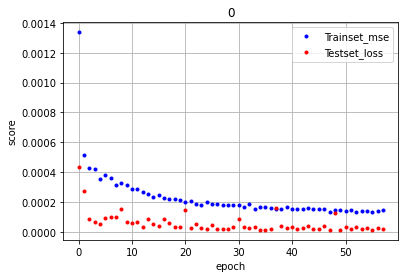

 MSE: 0.0000


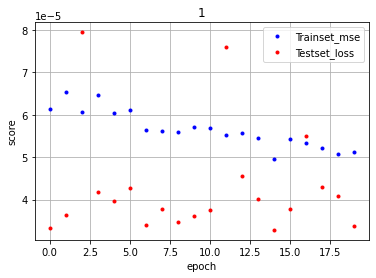

 MSE: 0.0000


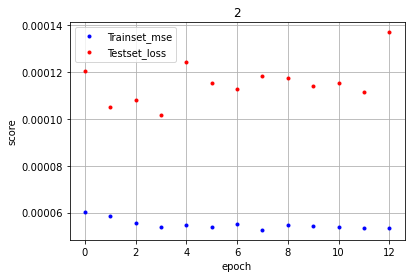

 MSE: 0.0001


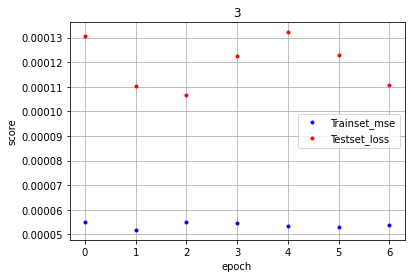

 MSE: 0.0001


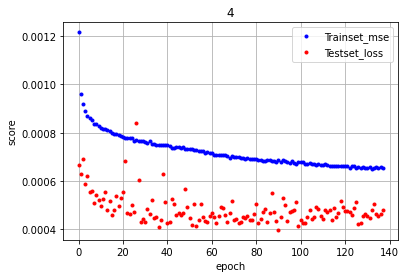

 MSE: 0.0005


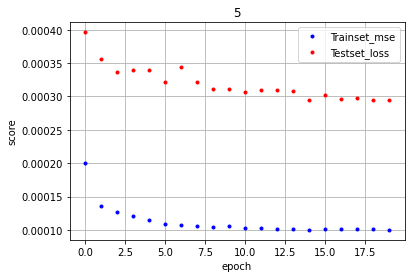

 MSE: 0.0003


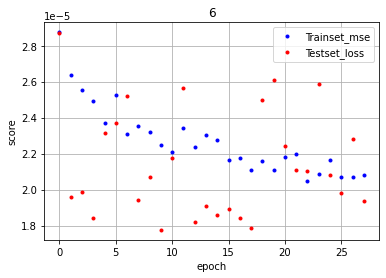

 MSE: 0.0000


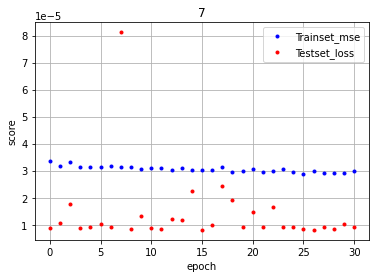

 MSE: 0.0000


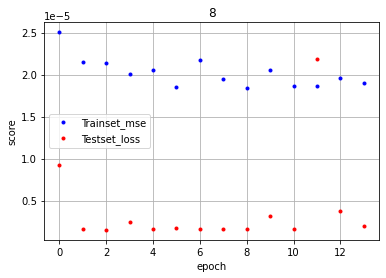

 MSE: 0.0000


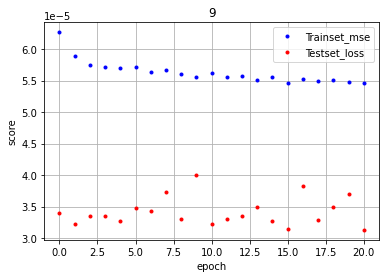

 MSE: 0.0000


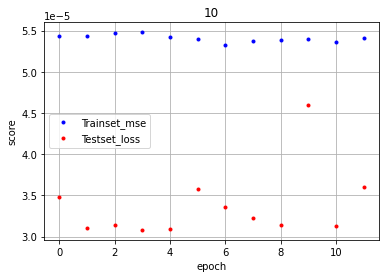

 MSE: 0.0000


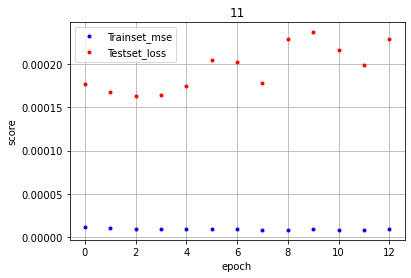

 MSE: 0.0002


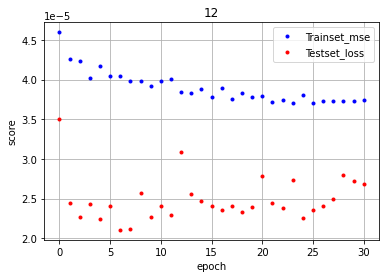

 MSE: 0.0000


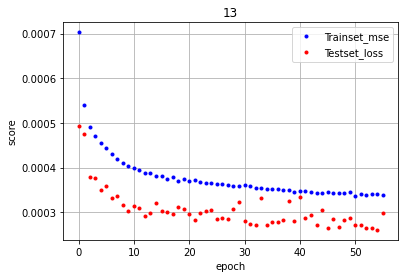

 MSE: 0.0003


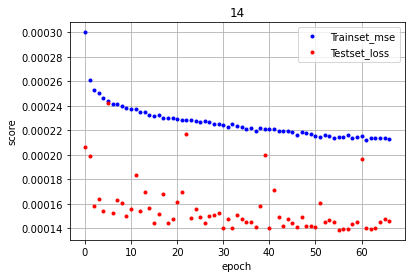

 MSE: 0.0001


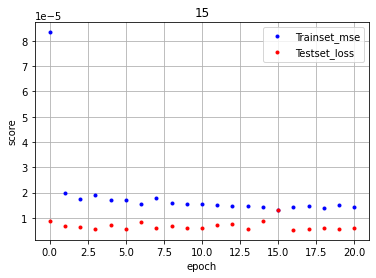

 MSE: 0.0000


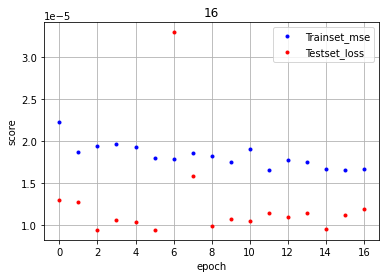

 MSE: 0.0000


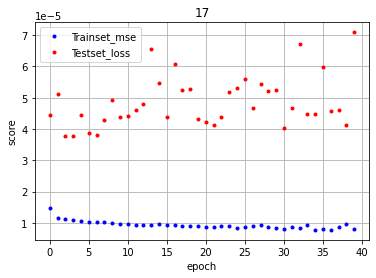

 MSE: 0.0001


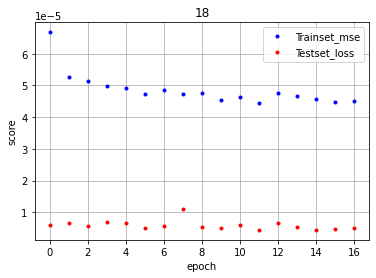

 MSE: 0.0000


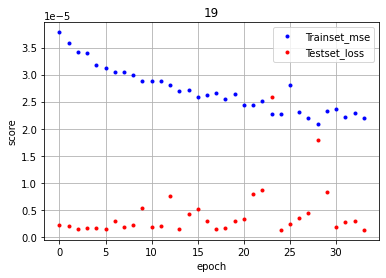

 MSE: 0.0000


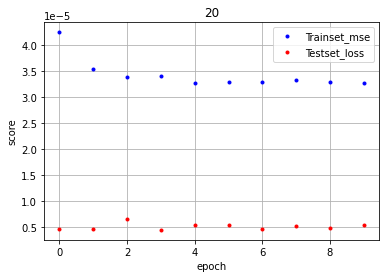

 MSE: 0.0000


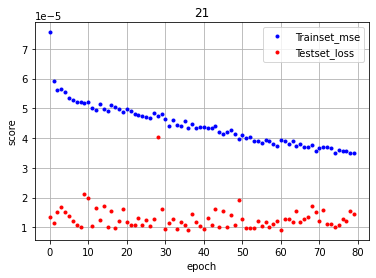

 MSE: 0.0000


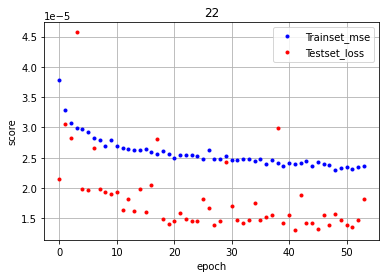

 MSE: 0.0000


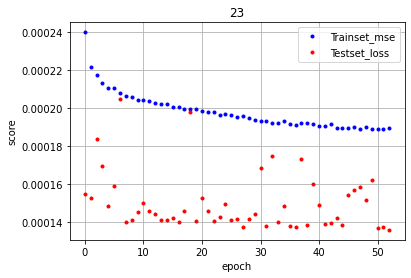

 MSE: 0.0001


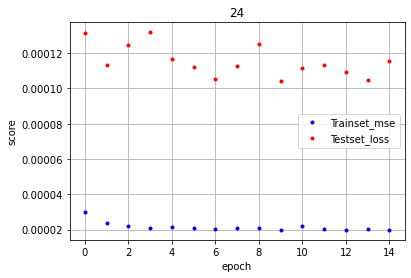

 MSE: 0.0001


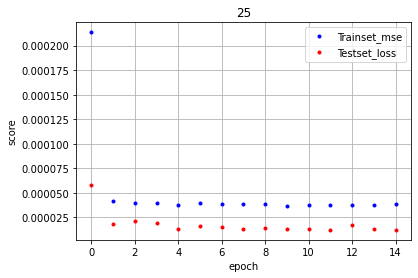

 MSE: 0.0000


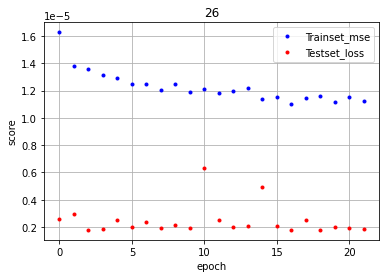

 MSE: 0.0000


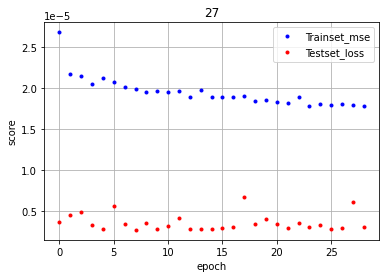

 MSE: 0.0000


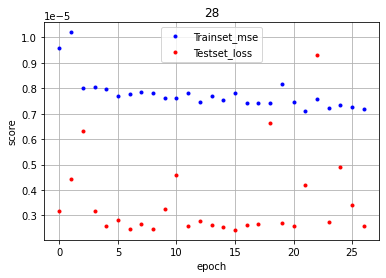

 MSE: 0.0000


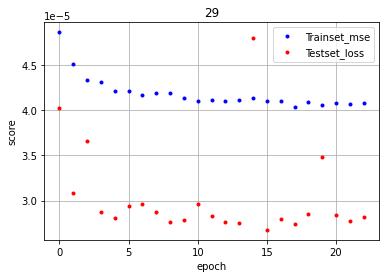

 MSE: 0.0000


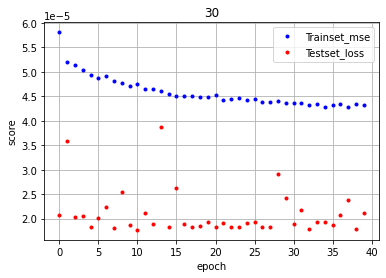

 MSE: 0.0000


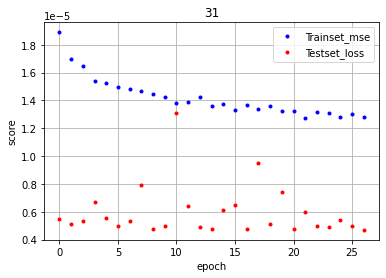

 MSE: 0.0000


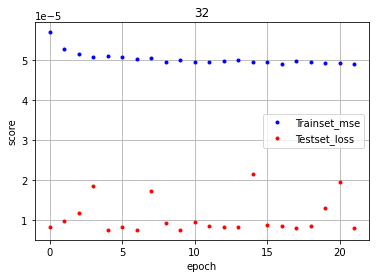

 MSE: 0.0000


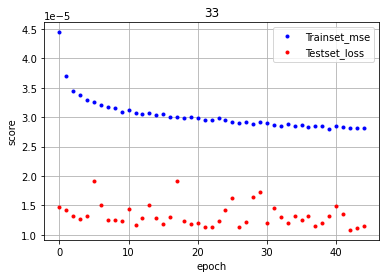

 MSE: 0.0000


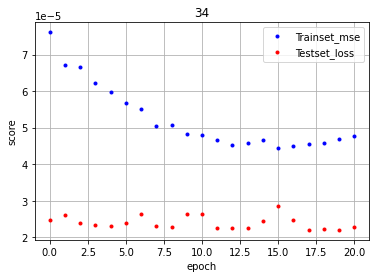

 MSE: 0.0000


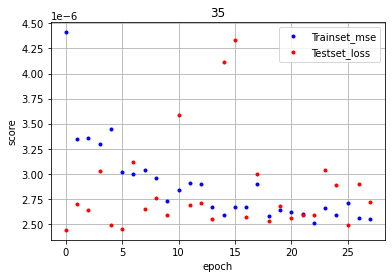

 MSE: 0.0000


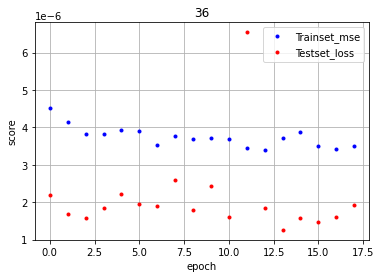

 MSE: 0.0000


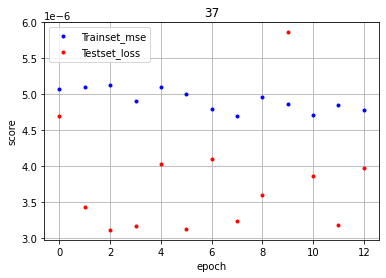

 MSE: 0.0000


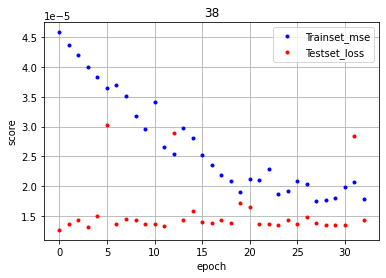

 MSE: 0.0000


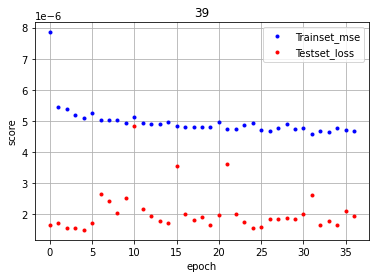

 MSE: 0.0000


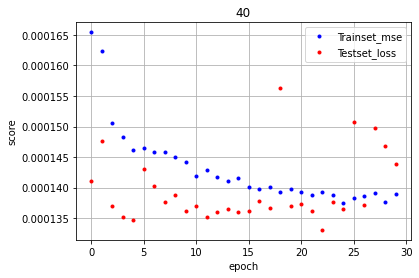

 MSE: 0.0001


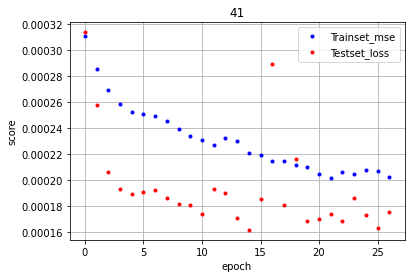

 MSE: 0.0002


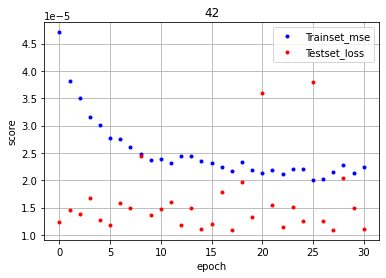

 MSE: 0.0000


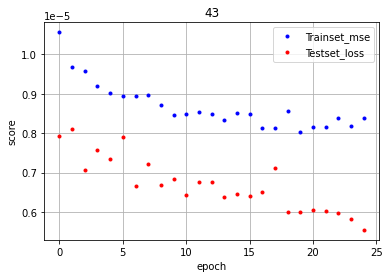

 MSE: 0.0000


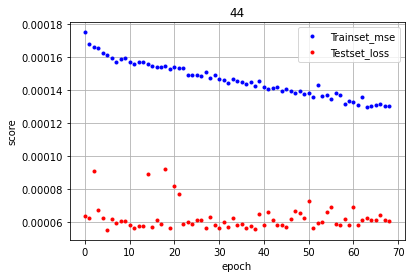

 MSE: 0.0001


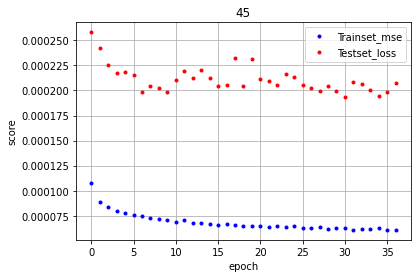

 MSE: 0.0002


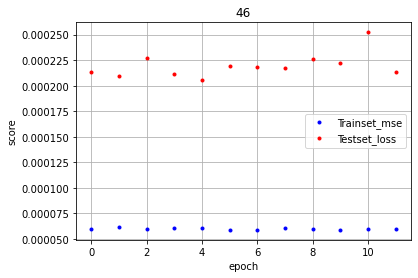

 MSE: 0.0002


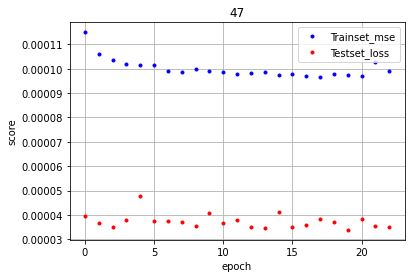

 MSE: 0.0000


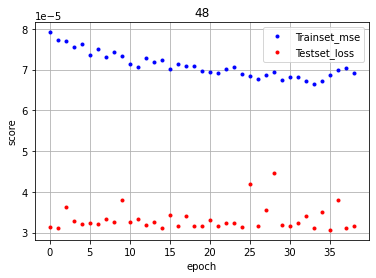

 MSE: 0.0000


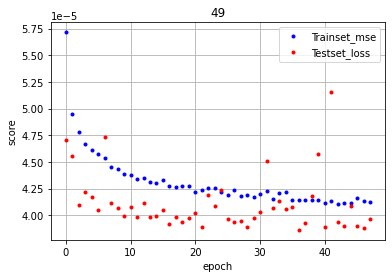

 MSE: 0.0000


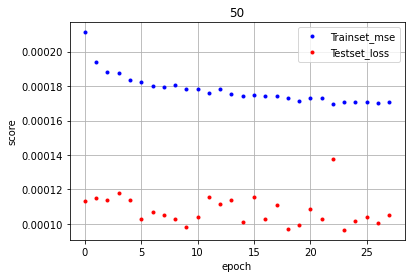

 MSE: 0.0001


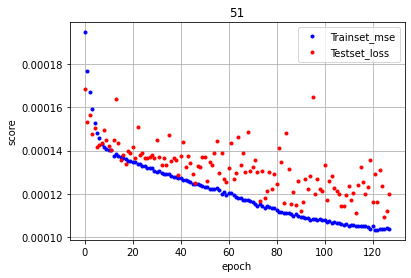

 MSE: 0.0001


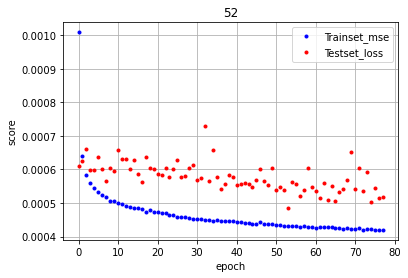

 MSE: 0.0005


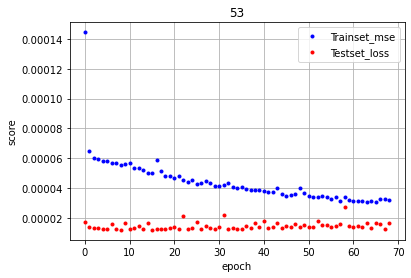

 MSE: 0.0000


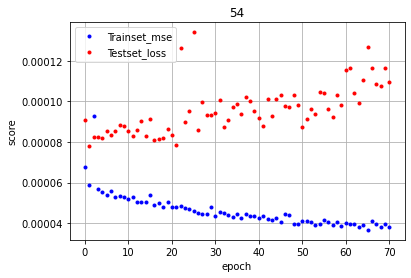

 MSE: 0.0001


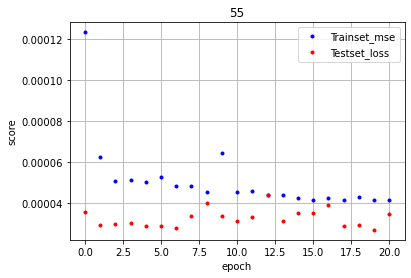

 MSE: 0.0000


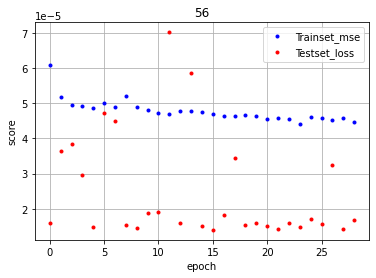

 MSE: 0.0000


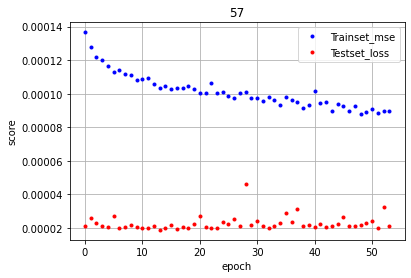

 MSE: 0.0000


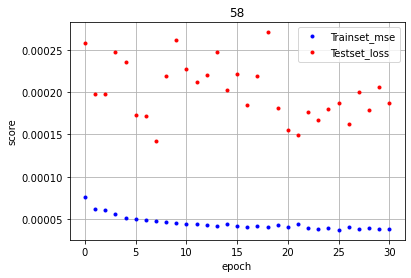

 MSE: 0.0002


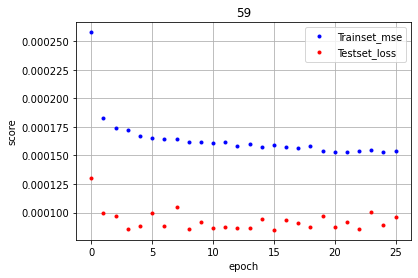

 MSE: 0.0001


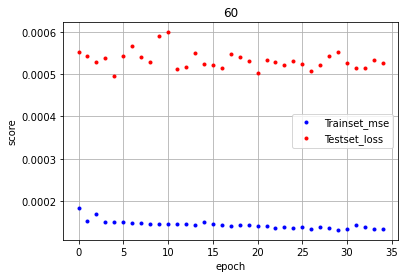

 MSE: 0.0005


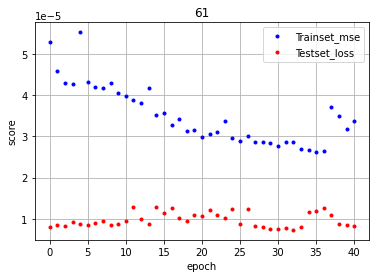

 MSE: 0.0000


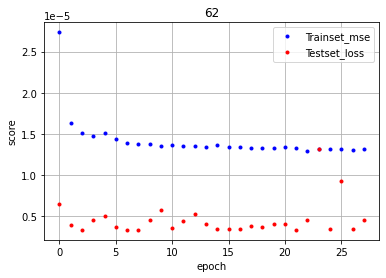

 MSE: 0.0000


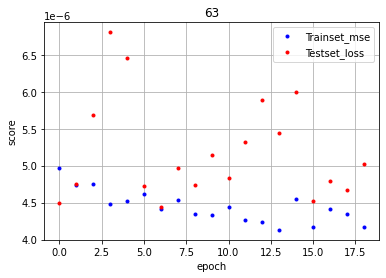

 MSE: 0.0000


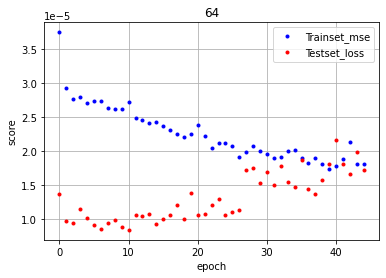

 MSE: 0.0000


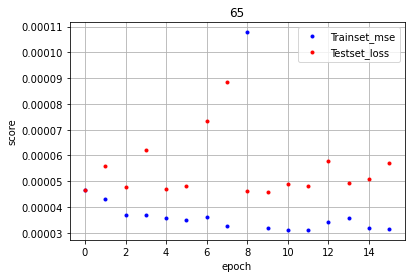

 MSE: 0.0001


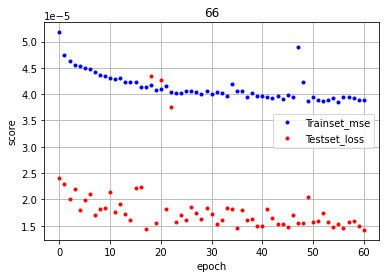

 MSE: 0.0000


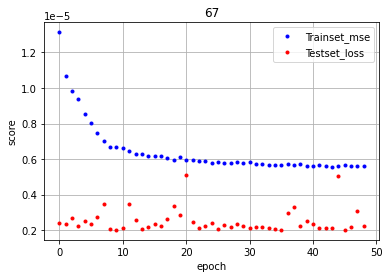

 MSE: 0.0000


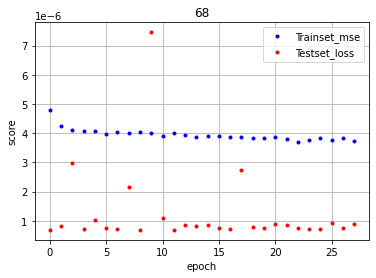

 MSE: 0.0000


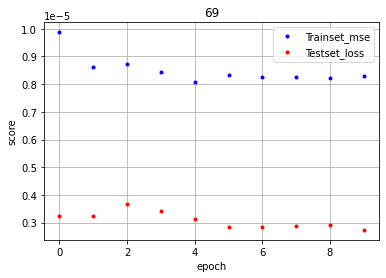

 MSE: 0.0000


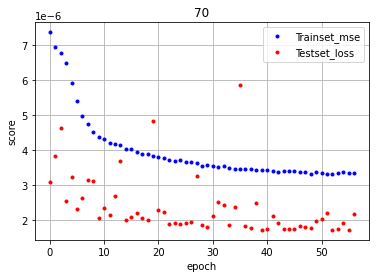

 MSE: 0.0000


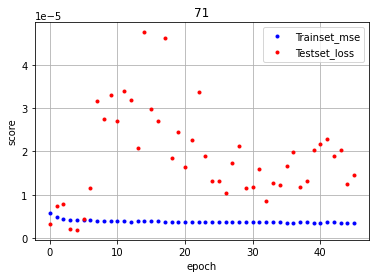

 MSE: 0.0000


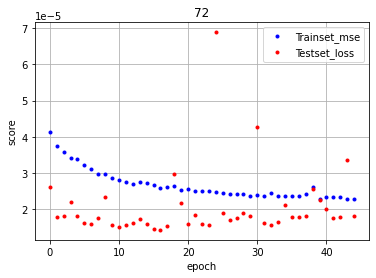

 MSE: 0.0000


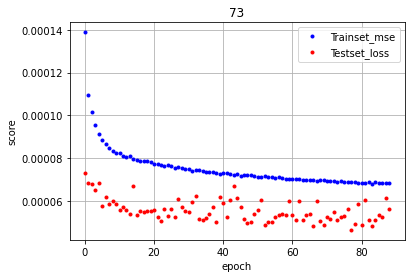

 MSE: 0.0001


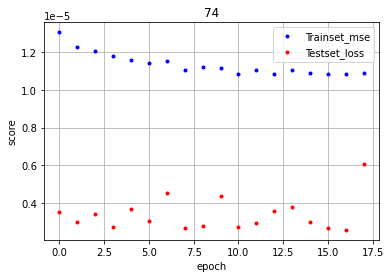

 MSE: 0.0000


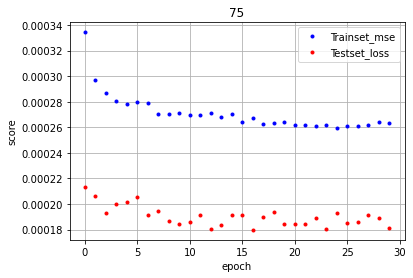

 MSE: 0.0002


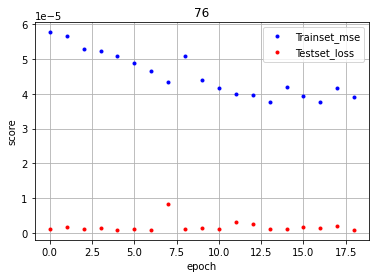

 MSE: 0.0000


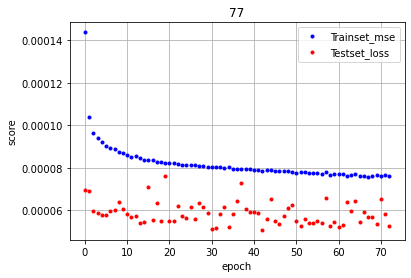

 MSE: 0.0001


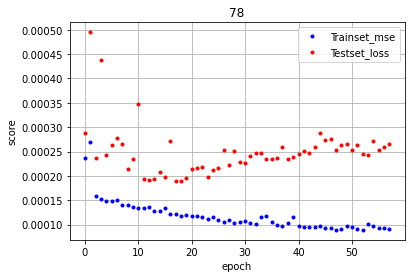

 MSE: 0.0003


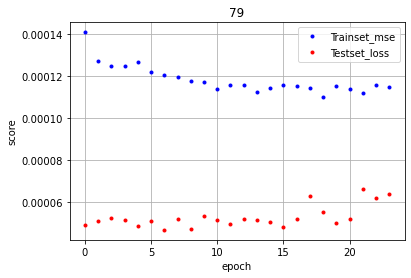

 MSE: 0.0001


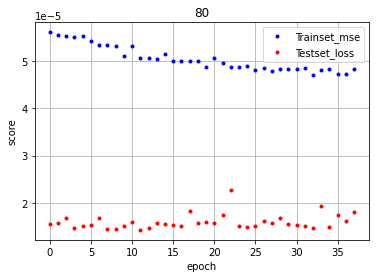

 MSE: 0.0000


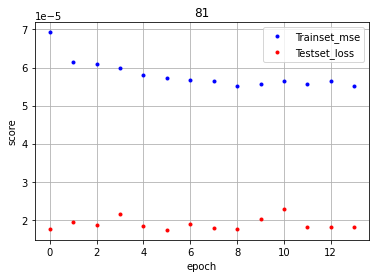

 MSE: 0.0000


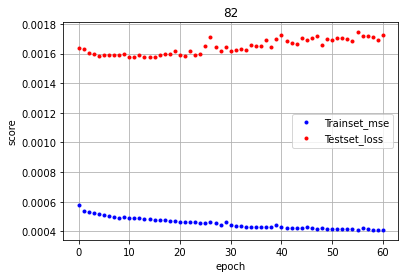

 MSE: 0.0017


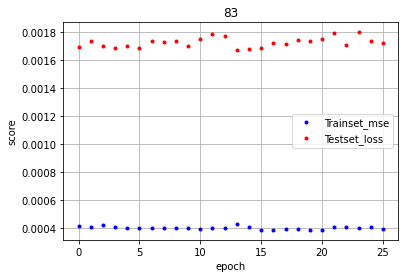

 MSE: 0.0017


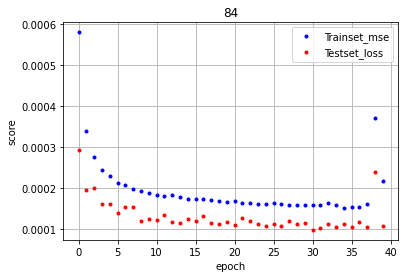

 MSE: 0.0001


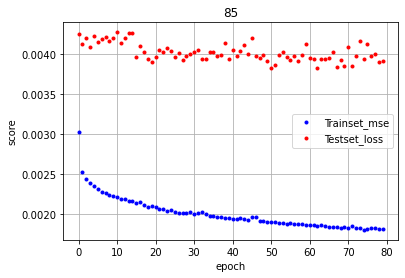

 MSE: 0.0039


In [26]:
#------------------------------------------------------------------------------------------#
# loss는 매 에포크 마다의 훈련 손실값
# acc는 매 에포크 마다의 훈련 정확도
# val_loss는 매 에포크 마다의 검증 손실값
# val_acc는 매 에포크 마다의 검증 정확도
# validation loss가 증가하기 시작한다면, 모델이 과적합이 되고 있다고 판단
# print(hist.history)

#------------------------------------------------------------------------------------------#
y_vloss = [hist_list[i].history['val_loss'] for i in range(len(df_list))]   # 테스트셋 오차
#print(len(y_vloss))   # shape함수는 리스트에 적용안됨

# 학습셋 정확도
y_mse = [hist_list[i].history['mean_squared_error'] for i in range(len(df_list))]

# 테스트셋 정확도
y_val_mse = [hist_list[i].history['val_mean_squared_error'] for i in range(len(df_list))]
x_len = [np.arange(len(y_mse[i])) for i in range(len(df_list))]

for i in range(len(df_list)):
    plt.title(i)
    #학습셋 정확도 라인
    plt.plot(x_len[i], y_mse[i], 'o', c='blue', markersize=3, label = 'Trainset_mse')

    #테스트셋 오차 라인
    plt.plot(x_len[i], y_vloss[i], 'o', c='red', markersize=3, label = 'Testset_loss')

    plt.legend(loc='best')   #location  right, left, upper rigtht 등등 
    plt.grid()   # 격자 
    plt.xlabel('epoch')
    plt.ylabel('score')

    plt.show()

    # 테스트 정확도 출력
    print(' MSE: %.4f' % y_val_mse[i][-1])  
    #제일 마지막 정확도를 가져오고 싶어서 인덱싱 -1번 

In [27]:
y_pred = [model_list[i].predict(X_test_t[i], batch_size=30) for i in range(len(df_list))]

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


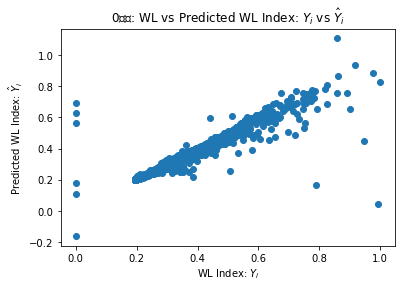

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


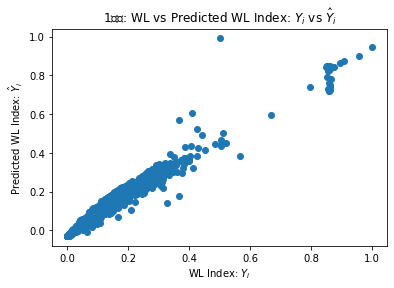

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


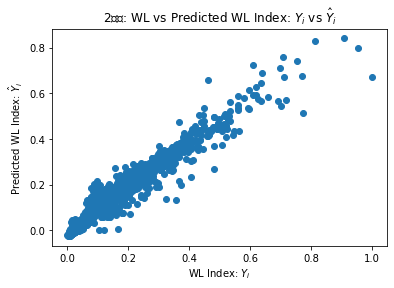

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


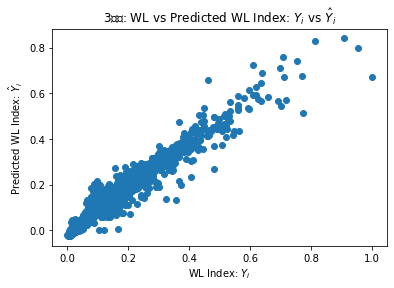

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


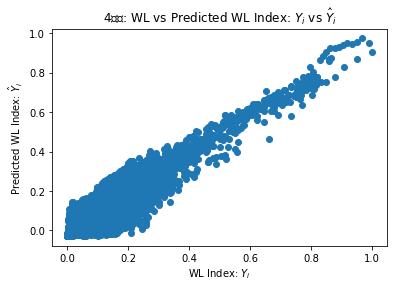

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


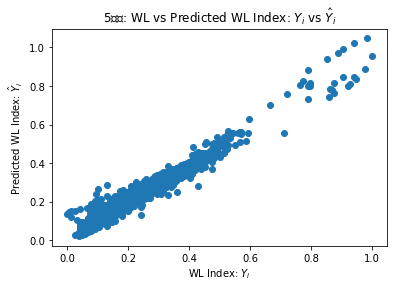

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


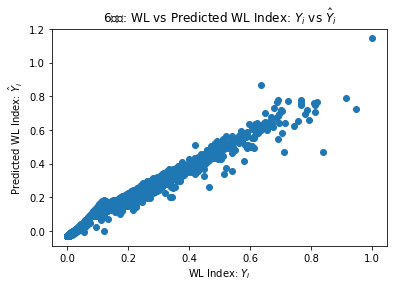

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


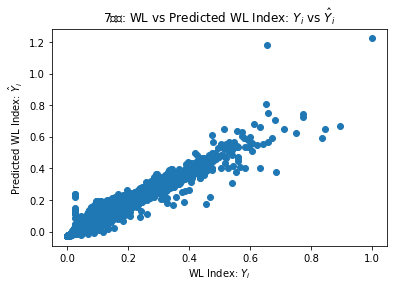

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


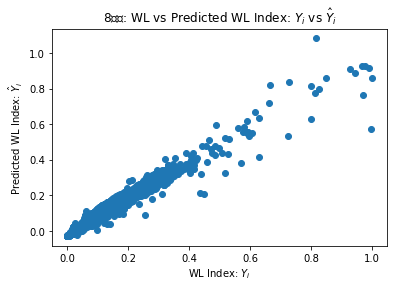

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


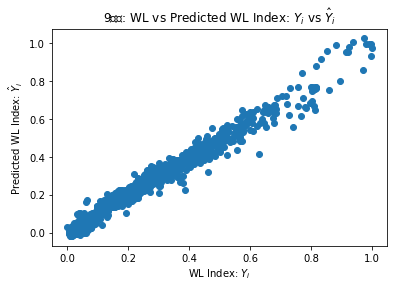

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


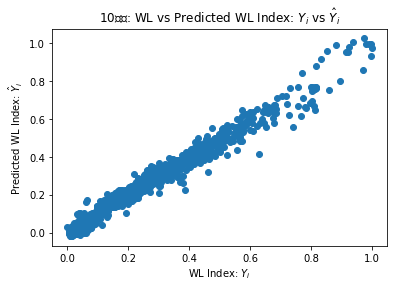

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


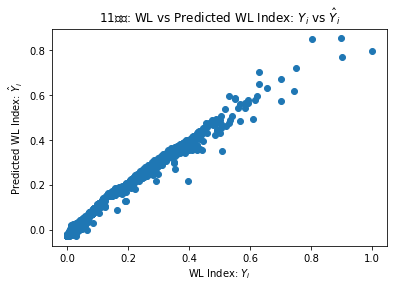

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


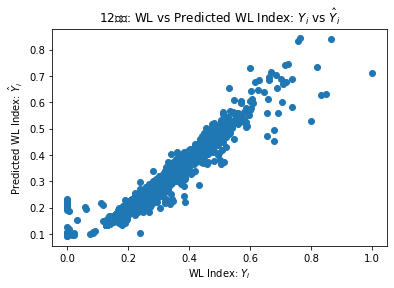

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


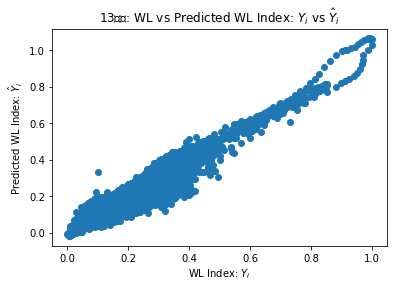

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


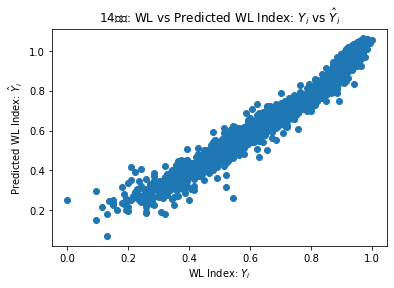

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


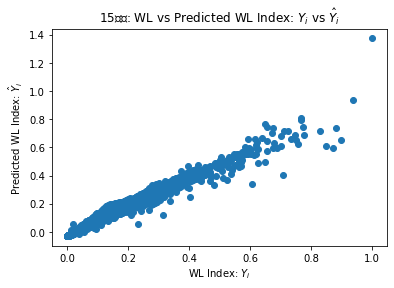

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


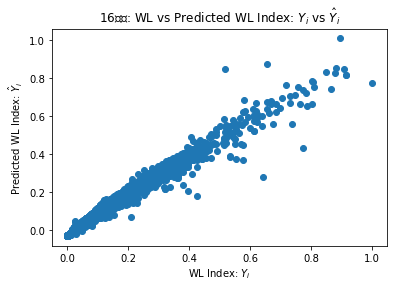

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


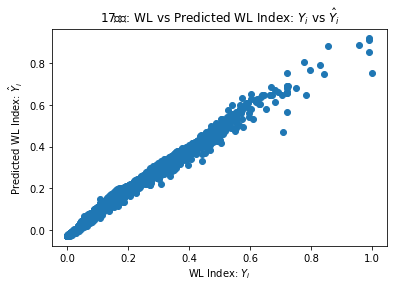

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


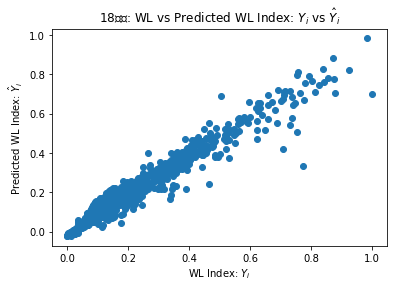

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


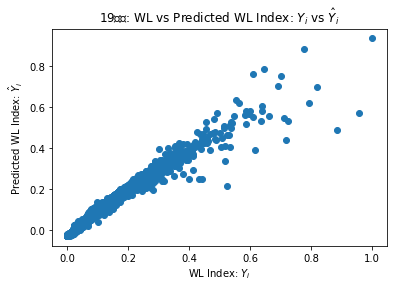

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


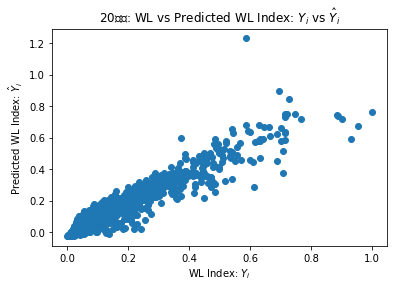

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


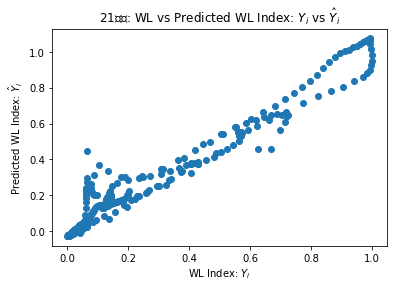

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


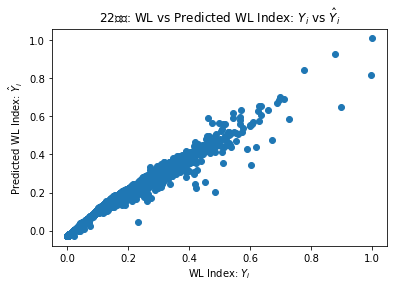

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


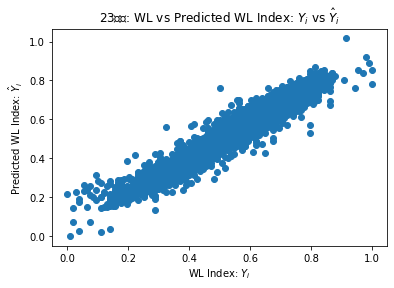

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


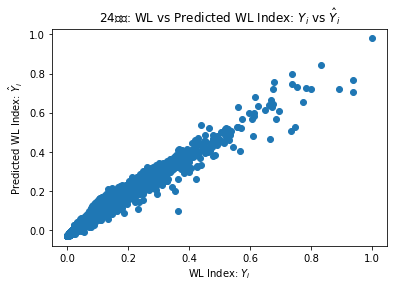

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


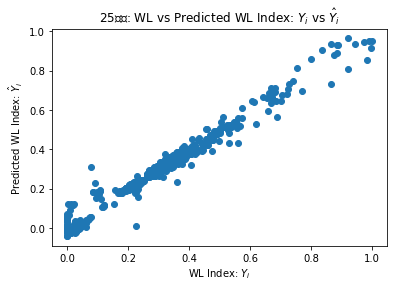

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


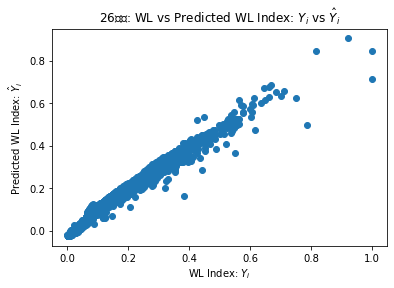

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


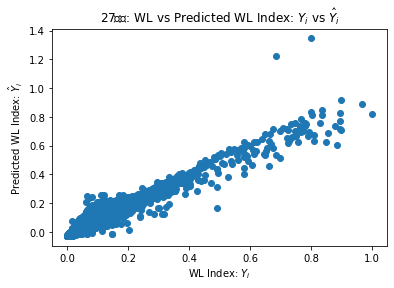

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


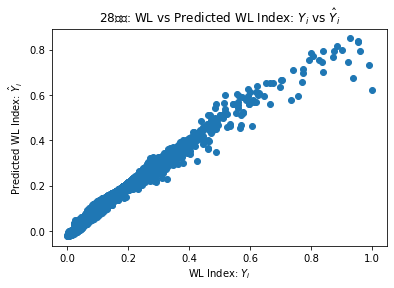

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


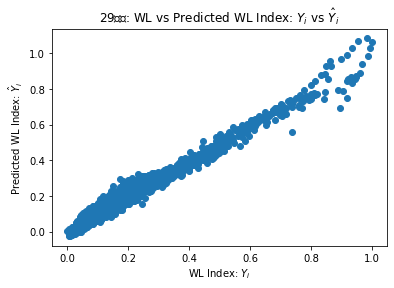

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


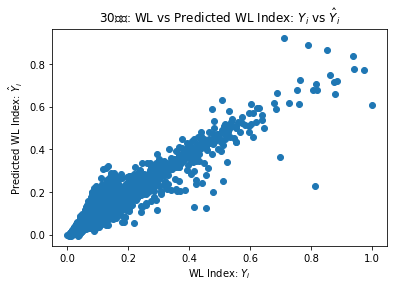

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


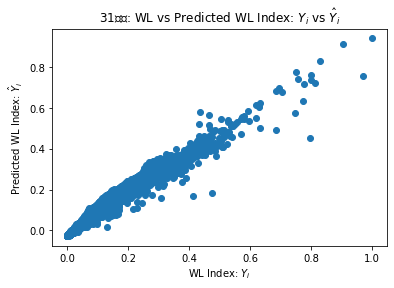

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


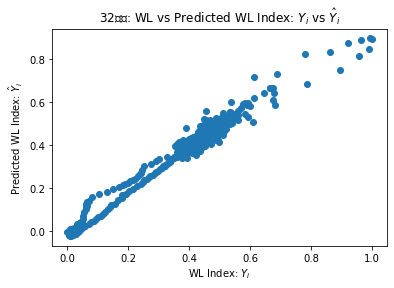

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


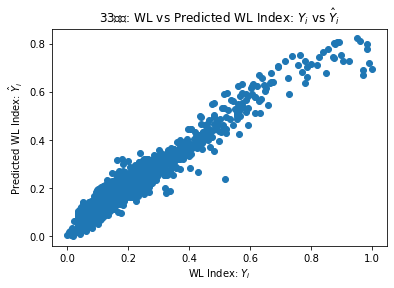

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


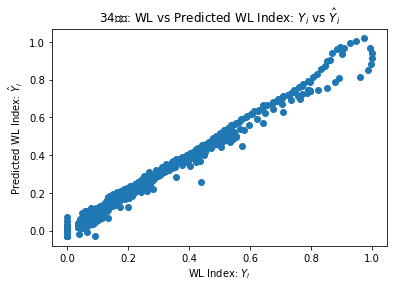

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


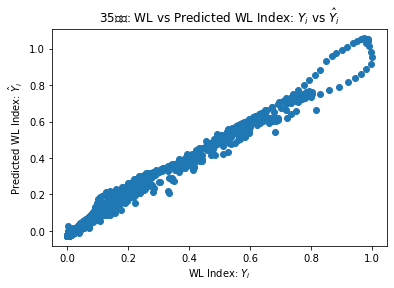

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


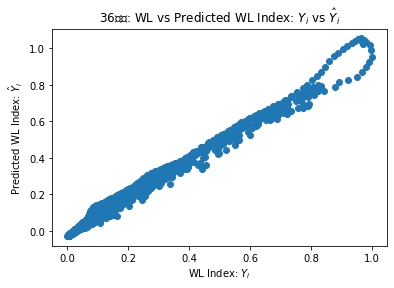

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


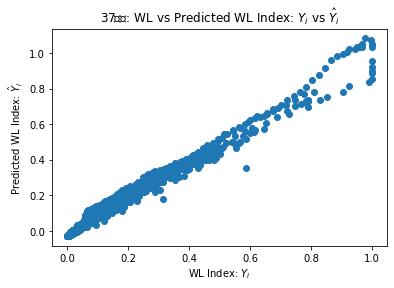

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


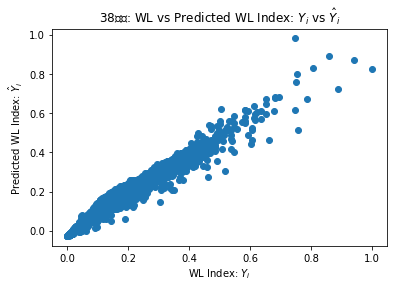

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


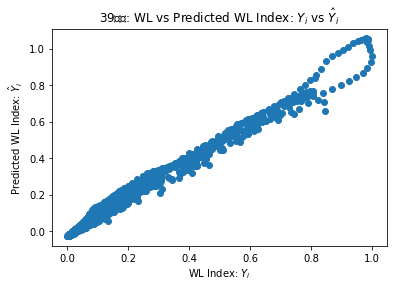

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


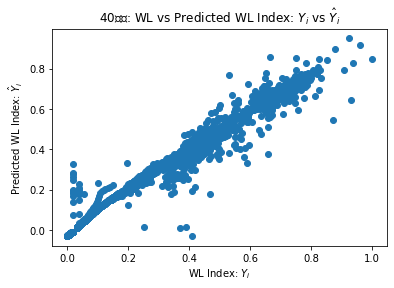

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


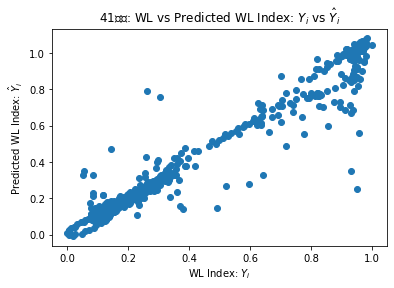

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


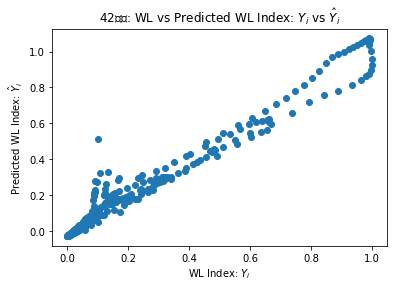

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


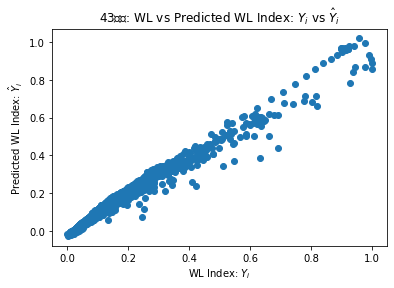

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


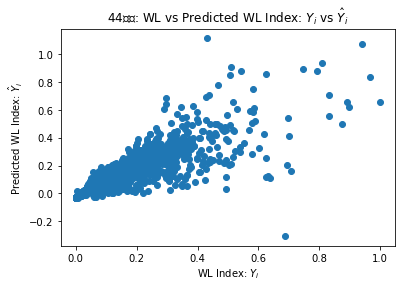

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


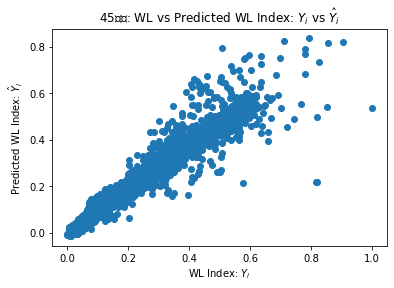

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


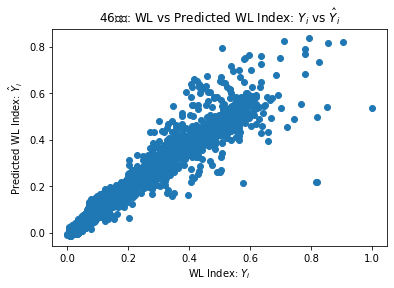

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


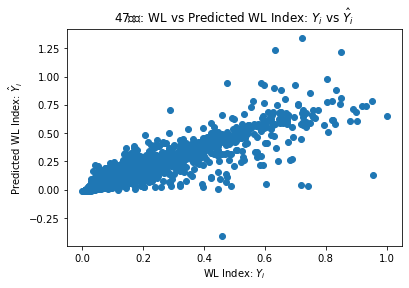

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


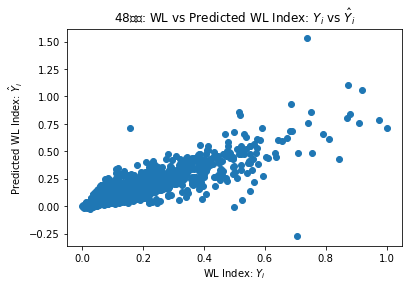

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


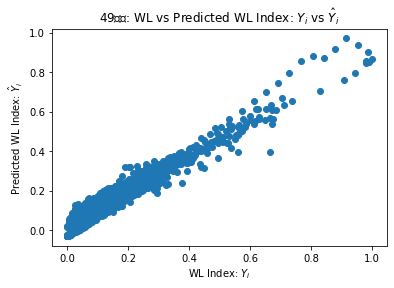

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


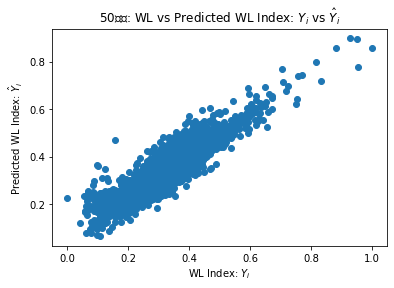

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


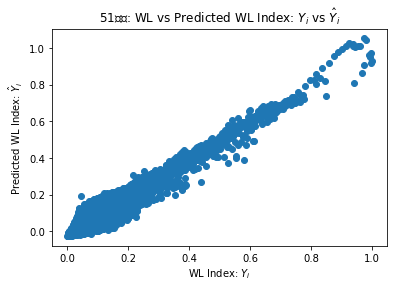

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


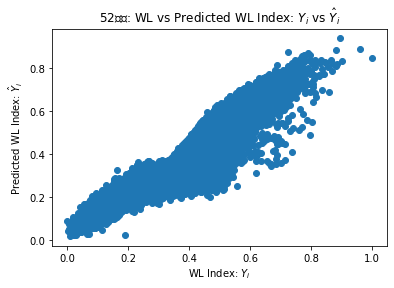

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


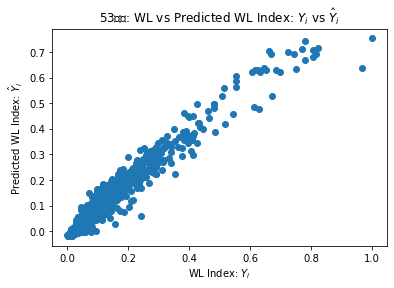

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


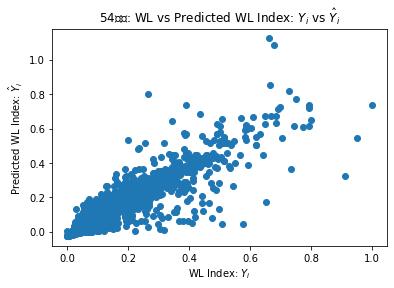

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


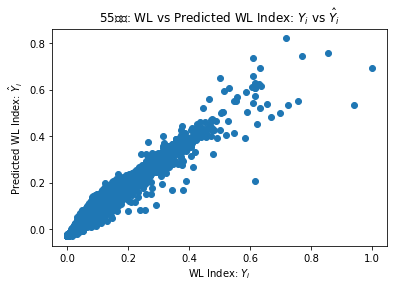

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


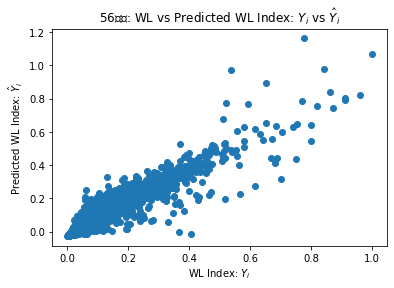

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


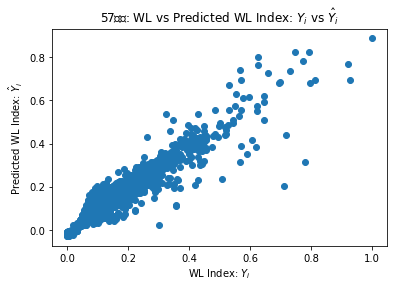

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


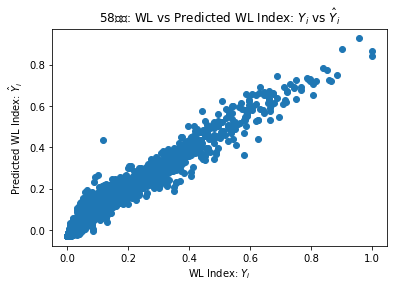

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


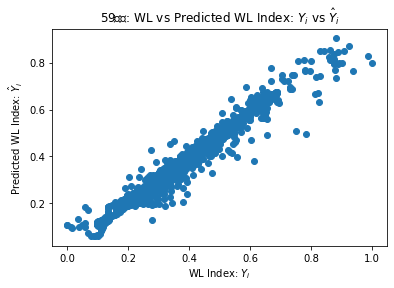

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


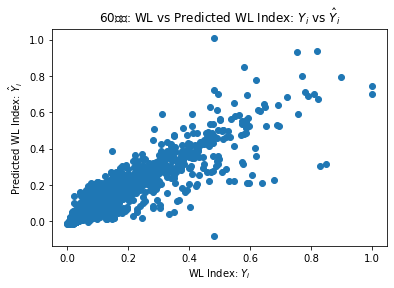

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


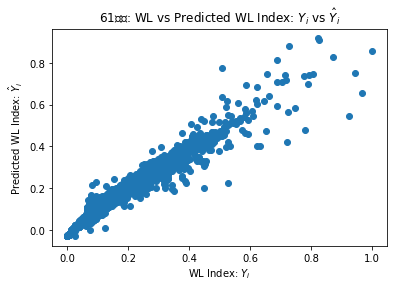

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


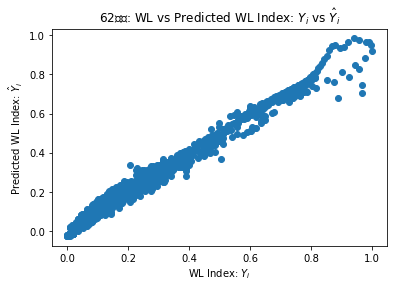

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


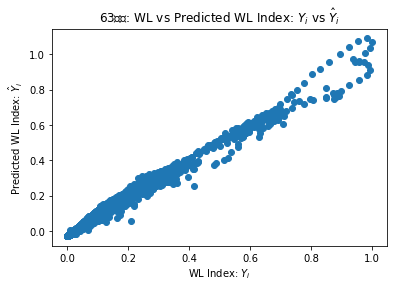

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


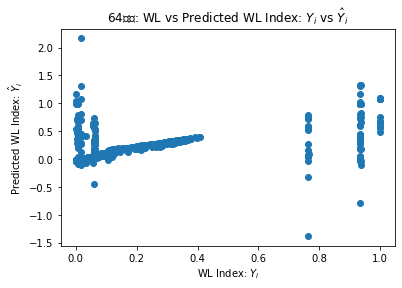

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


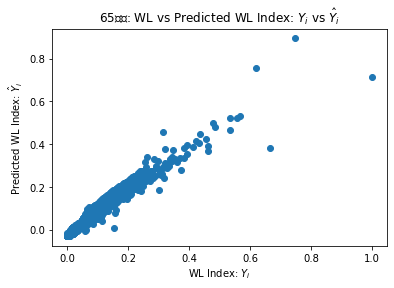

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


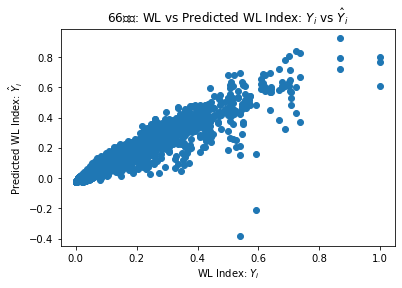

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


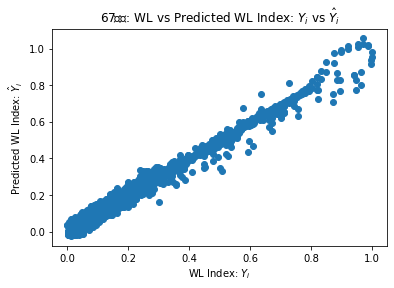

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


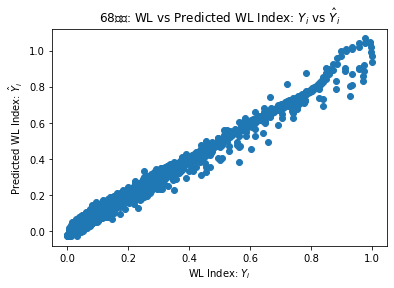

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


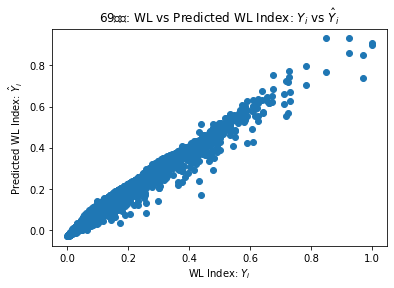

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


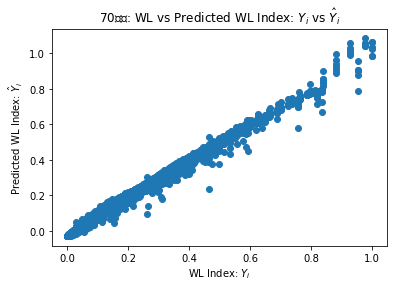

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


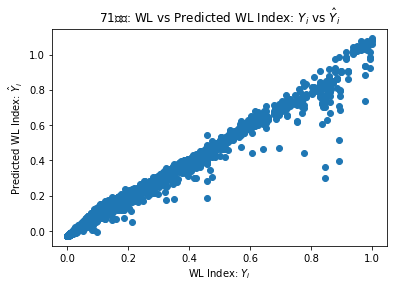

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


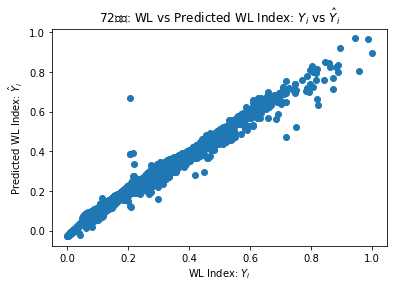

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


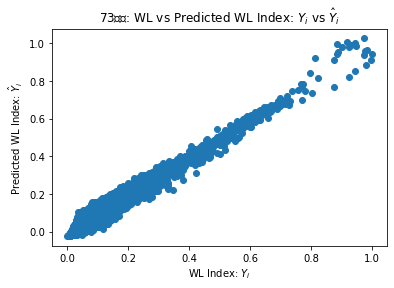

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


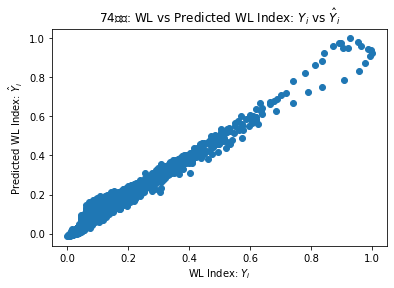

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


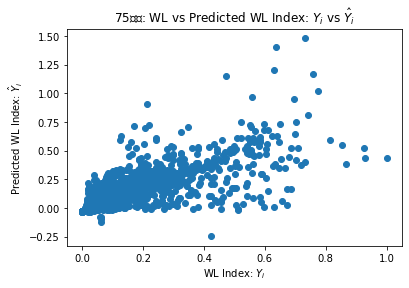

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


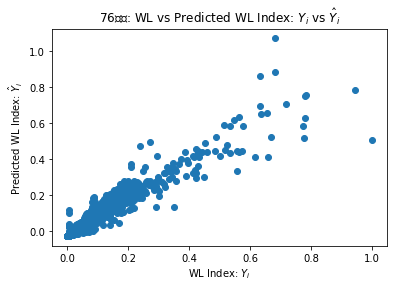

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


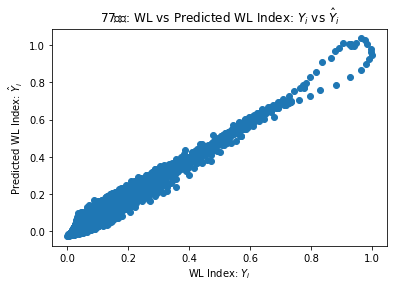

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


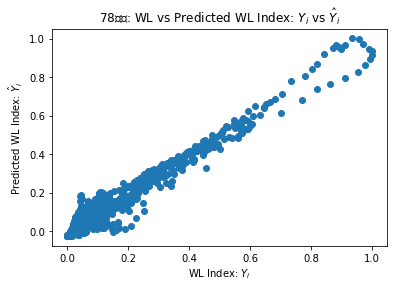

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


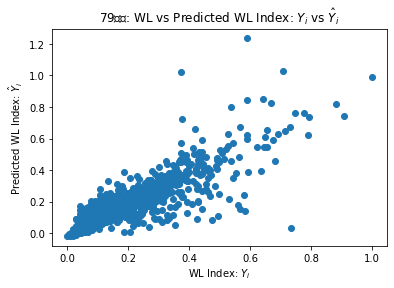

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


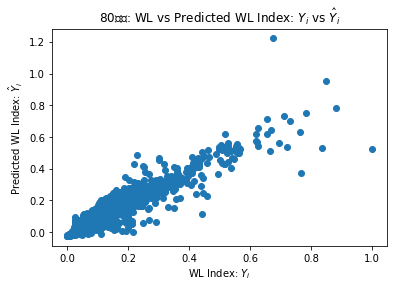

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


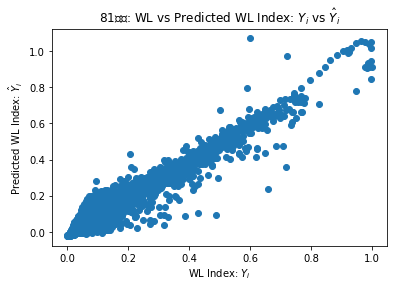

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


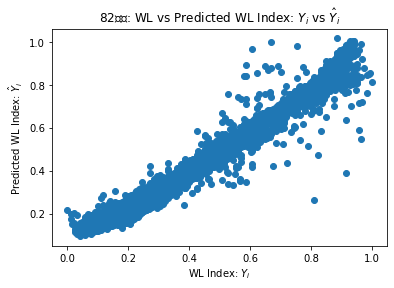

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


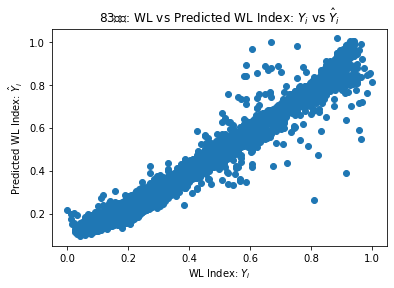

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


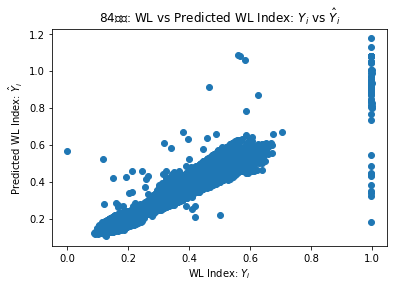

Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral
Font 'default' does not have a glyph for '\ubc88' [U+bc88], substituting with a dummy symbol.
Substituting symbol 번 from STIXGeneral
Font 'default' does not have a glyph for '\uc9f8' [U+c9f8], substituting with a dummy symbol.
Substituting symbol 째 from STIXGeneral


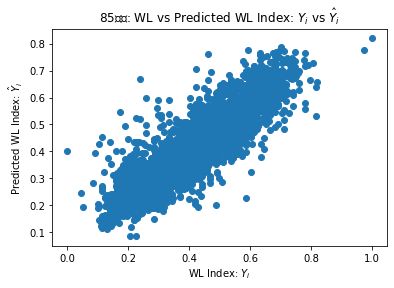

In [28]:
#------------------------------------------------------------------------------------------#
# 예측 결과 시각화하여 확인
# 원래 값과 예측 값이 일치하면 직선에 가깝게 분포가 되는데 결과가 나쁘지 않다
for i in range(len(df_list)):
    plt.scatter(y_test[i], y_pred[i])
    plt.xlabel("WL Index: $Y_i$")
    plt.ylabel("Predicted WL Index: $\hat{Y}_i$")
    plt.title(str(i)+"번째: WL vs Predicted WL Index: $Y_i$ vs $\hat{Y}_i$")
    plt.show()

In [29]:
a_axis = [np.arange(0, len(y_train[i])) for i in range(len(df_list))]
b_axis = [np.arange(len(y_train[i]), len(y_train[i]) + len(y_pred[i])) for i in range(len(df_list))]

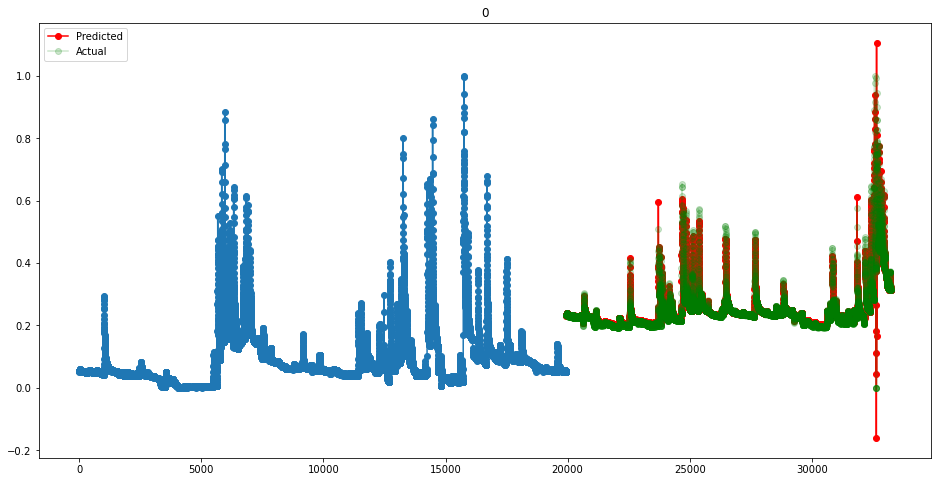

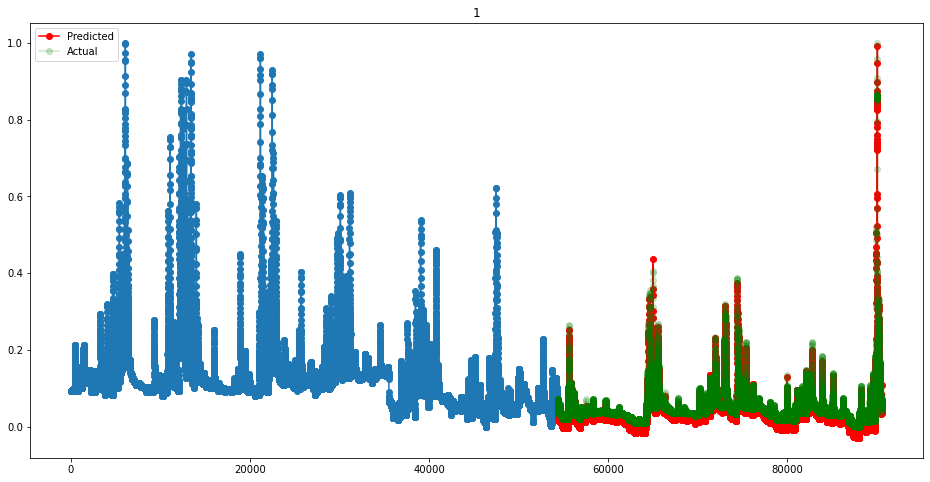

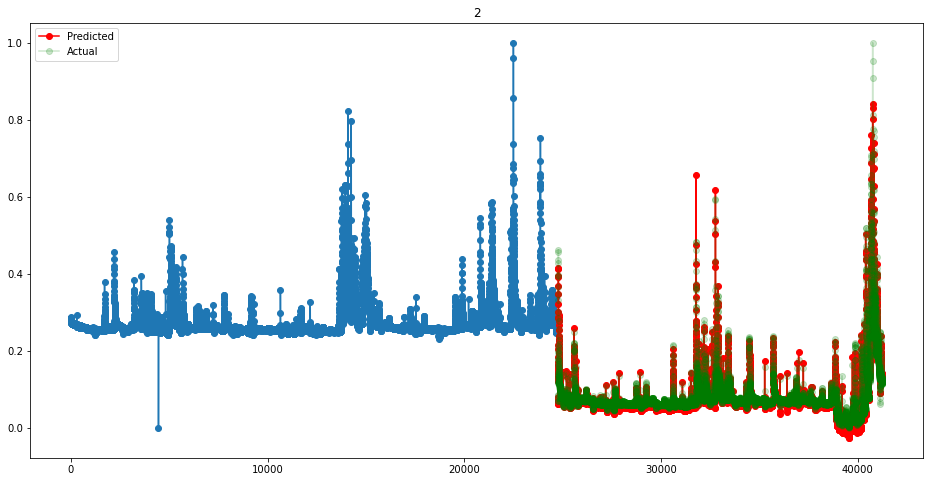

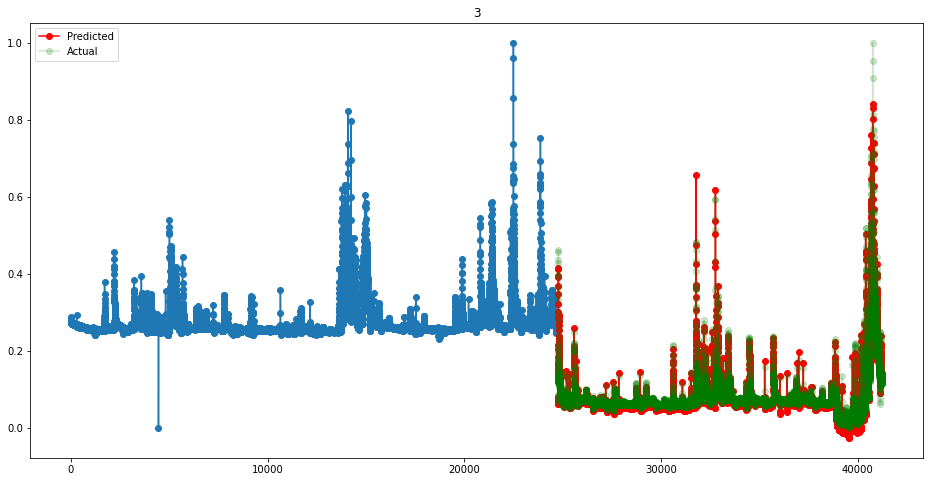

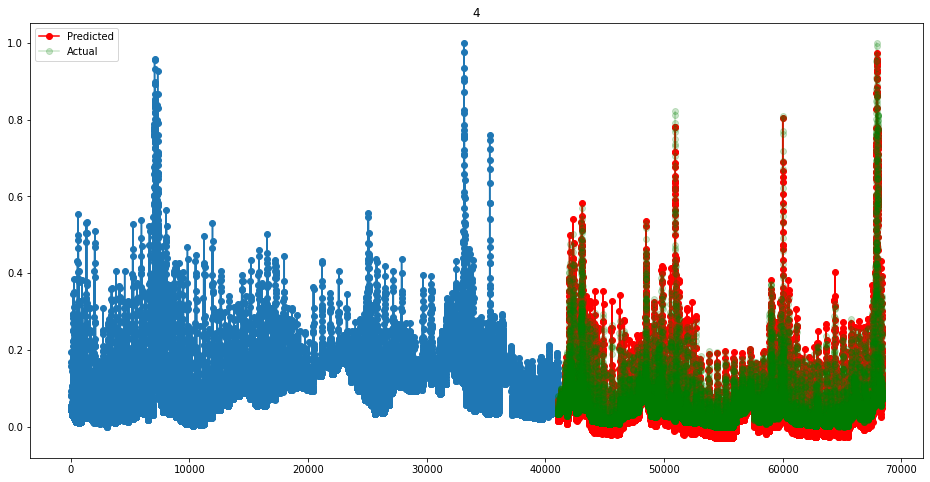

...

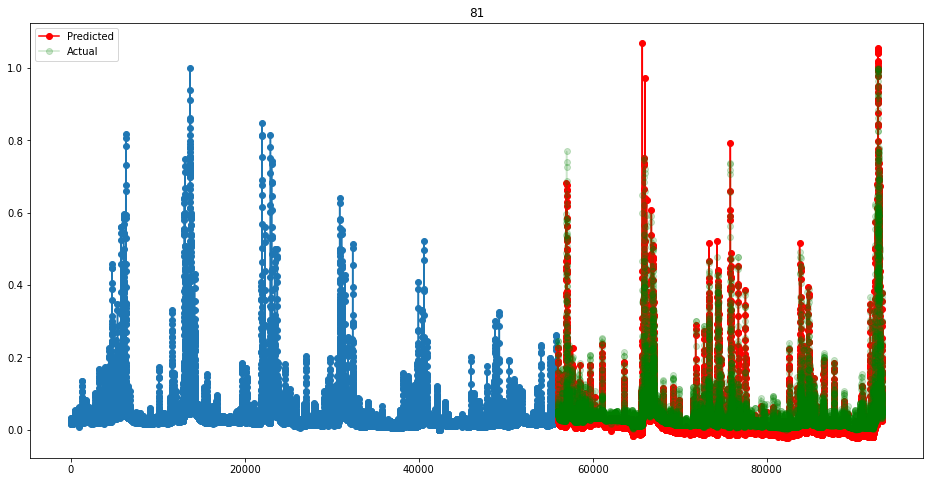

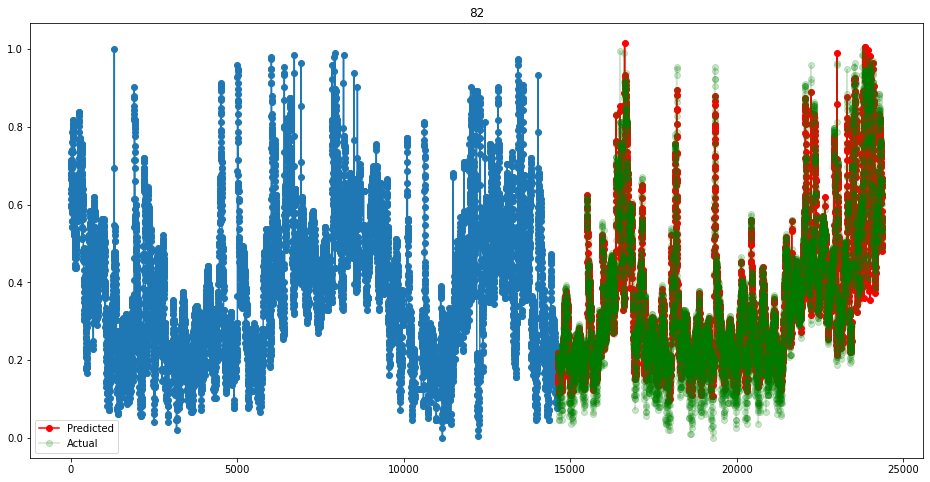

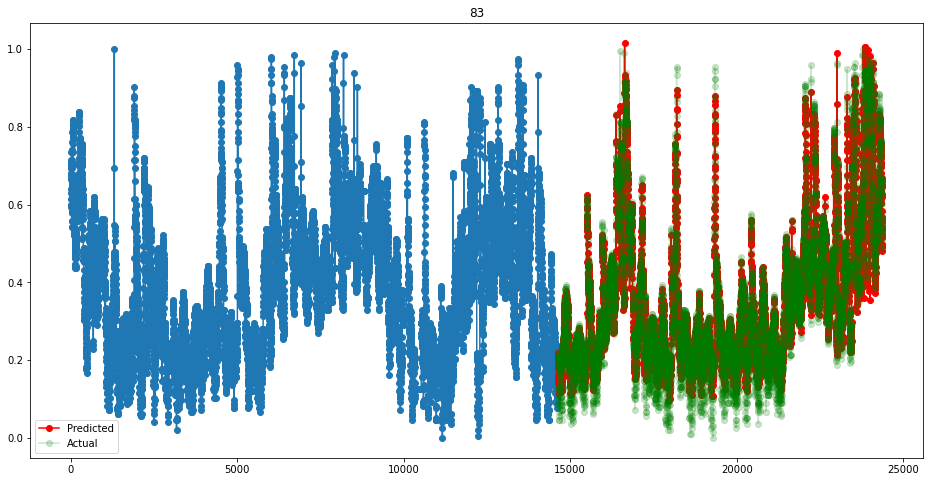

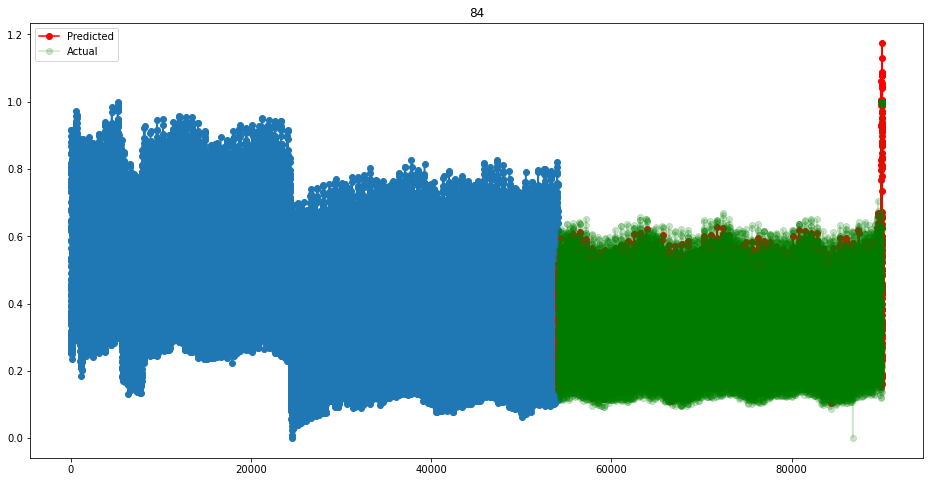

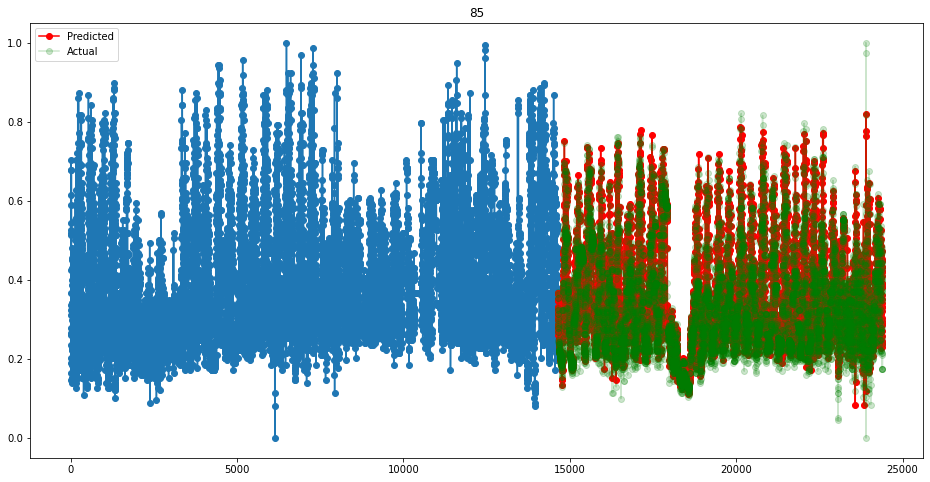

In [30]:
for i in range(len(df_list)):
    plt.figure(figsize=(16,8))
    plt.title(i)
    plt.plot(a_axis[i], y_train_np[i].reshape(X_train_t[i].shape[0],), 'o-')
    plt.plot(b_axis[i], y_pred[i].reshape(X_test_t[i].shape[0],), 'o-', color='red', label='Predicted')
    plt.plot(b_axis[i], y_test_np[i].reshape(X_test_t[i].shape[0],), 'o-', color='green', alpha=0.2, label='Actual')
    plt.legend()
    plt.show()

In [31]:
# #------------------------------------------------------------------------------------------#
# # test 값과 예측 값 시각화
# plt.plot(y_test[i], 'bo-', label='Actual')
# plt.plot(y_pred[i], 'ro-', label='Predicted')
# plt.legend()
# plt.show()